In [1]:
#Amo evaluation
#FM 28.11.2025
import sys
sys.path.extend(['src', '../src']) 
# Import all ML orchestration functions
from amo.ml_orchestration import (
    ml_exp_with_timing,  # Main experiment function with timing preservation
    extract_timing_structure,
    save_midi_with_exact_timing_structure,
    KerasClassifierWrapper,
    build_lstm_classifier,
    build_transformer_classifier,
    clf_predict,
    defineXy,           # Data preparation function
    split_and_encode    # Train/test split with encoding
)
# Import MIDI processing functions  
from amo.midi2df2midi import midi_to_dataframe, save_midi_from_df
from amo.mappings import fill_quaterna_columns, learn_quaterna_mapping
# Import amo funtion
from amo.ml_orchestration import amo_with_doublings_multiclass

import pandas as pd
import numpy as np
from collections import defaultdict


from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier

import matplotlib.pyplot as plt



/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(
2026-03-29 16:50:24.723255: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774795824.741931  275802 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been

In [2]:
# amo_with_doublings
# Args:
  #      filein (str): Path to the source MIDI file to learn orchestration style from.
  #      fileout (str): Path to the target MIDI file to be orchestrated.
  #      ytarget (str, optional): The target variable for the model ('track-channel' or 'program').
  #                               Defaults to "track-channel".
  #      model (str, optional): The name of the machine learning model to use for orchestration.
  #     ("XGBoost","RandomForest", "DecisionTree", "NearestNeighbors", "MLP3", "NaiveBayes", "MLP1", "AdaBoost", "LSTMClassifier", "TransformerClassifier")
  #                             Defaults to "XGBoost".

In [3]:
def transpose(note, inverse=False, n_semitones=12):
    # Example: transpose pitch
    if inverse:
        n_semitones = - n_semitones
    new_note = note.copy()
    new_note['pitch'] = note['pitch'] + n_semitones
    return [ new_note ]

In [4]:
transformations = [
    (transpose, {'n_semitones': 12}),
    (transpose, {'n_semitones': 24}),
    (transpose, {'n_semitones': 36}),
    (transpose, {'n_semitones': -12}),
    (transpose, {'n_semitones': -24}),
    (transpose, {'n_semitones': -36}),
    #(split_duration, {'smallest_unit': 0.25}),
]

In [5]:
"""
Prompt by GV
create a python function to read the path of .mid files which contain the string "orch". Files are inside folders like "folder_name1/la_mer_1_orch.mid", "folder_name2/symphony_9_2_orch.mid", etc.
"""
import os

def find_orch_mid_files(root_dir='.'):
    result = []
    for dirpath, _, filenames in os.walk(root_dir):
        for name in filenames:
            if name.lower().endswith('.mid') and 'orch' in name.lower():
                result.append(os.path.join(dirpath, name))
    return result

In [6]:
#get the parent directory
cwd = os.getcwd()
parent = os.path.normpath(os.path.join(cwd, '..', '..'))
path_AMO = parent + '/AutomaticMusicOrchestration'
model_path = path_AMO + '/'
#print(parent)#.../test
#print(path_AMO)

In [7]:
root_dir=model_path + 'LOP_database_06_09_17/hand_picked_Spotify'
#root_dir=parent+'/music/LOP_database_06_09_17/hand_picked_Spotify'
filenames = find_orch_mid_files(root_dir)
len(filenames)

55

In [8]:
model_names = [
        "XGBoost",
        "XGBoost5",
        "XGBoost10",
        "XGBoost20",
        "XGBoost50",
        "RandomForest",
        "RandomForest10",
        "RandomForest13",
        "RandomForest16",
        "RandomForest20",
        "DecisionTree",
        #"LSTMClassifier",      # Added
        "NearestNeighbors",
        #"MLP3",   
        #"TransformerClassifier", # Added
        "NaiveBayes",
        #"MLP1",
        "AdaBoost",
        "Dummy0",
        "Dummy1",
        "DummyUnif",      
    ]


model_names_short = [
    'XGB',
    'XGB5',
    'XGB10',
    'XGB20',
    'XGB50',
    'RF',
    'RF10',
    'RF13',
    'RF16',
    'RF20',
    'DT',
    #'LSTM*',
    'NN',
    #'MLP3*',
    #'TF',
    'NB',
    #'MLP1',
    'AB',
    'D0',
    'D1',
    'DU',
    ]

classifiers = [
    XGBClassifier(),
    XGBClassifier(n_estimators = 5),
    XGBClassifier(n_estimators = 10),
    XGBClassifier(n_estimators = 20),
    XGBClassifier(n_estimators = 50),
    RandomForestClassifier(),
    RandomForestClassifier(max_depth=10),
    RandomForestClassifier(max_depth=13),
    RandomForestClassifier(max_depth=16),
    RandomForestClassifier(max_depth=20),
    DecisionTreeClassifier(),
    #KerasClassifierWrapper(build_lstm_classifier),      # Added LSTM
    KNeighborsClassifier(1),
    #MLPClassifier(hidden_layer_sizes=(128,128,128)),
    #KerasClassifierWrapper(build_transformer_classifier),# Added Transformer
    GaussianNB(),
    #MLPClassifier(),
    AdaBoostClassifier(),
    DummyClassifier(strategy='constant', constant=0),
    DummyClassifier(strategy='constant', constant=1),
    DummyClassifier(strategy='uniform'),
]

In [9]:
# Reduce for testing purposes, remove this cell for the actual experiment
N_files = len(filenames)
N_models = len(classifiers)

filenames = filenames[:N_files]

model_names = model_names[:N_models]
classifiers = classifiers[:N_models]
model_names_short = model_names_short[:N_models]

In [10]:
# Initialize metrics collectors
s = (len(filenames),len(model_names))
ml_metrics = dict()
base_metrics_names = ["time",
                      "accuracy (train)",
                      "accuracy (test)",
                      "precision (train)",
                      "precision (test)",
                      "recall (train)",
                      "recall (test)",
                      "f1 (train)",
                      "f1 (test)",
                      ] #, "n_events", "n_classes"]
ml_metrics_names = base_metrics_names.copy()

for func, kwargs in transformations:
    trans_target_name = f"{func.__name__}_{kwargs}"
    for bmn in base_metrics_names:
        ml_metrics_names.append(f"{bmn} ({trans_target_name})")

for mn in ml_metrics_names:
    ml_metrics[mn] = np.zeros(s)

In [11]:
# Multiclass, with transformations
error_collection = []
for i, filein in enumerate(filenames):    
    for u, (model_name, clf) in enumerate(zip(model_names, classifiers)):
        try: 
            metrics = amo_with_doublings_multiclass(filein,fileout=None,model=model_name, tol=0.2, transformations=transformations, model_path=model_path)
            print(metrics)
            for mn in ml_metrics_names:
                # ml_metrics["accuracy"][i,u] = metrics["accuracy"]
                ml_metrics[mn][i,u] = metrics[mn]
        except Exception as e:
            print("Error")
            error_collection.append(f"Error with {filein} and model {model_name}: {e}")

print("\n????????? ERRORS ??????????")
for error in error_collection:
    print(error)


========= PREPROCESSING =========
[PREPROCESSING] Computing and caching results...
{'transformed': 308, 'direct': 39, 'none': 3973}
Original size: (4320, 15)
Dropping [901, 902, 903, 905, 906, 907, 909, 911, 913, 915, 916, 917, 919, 921, 923, 925, 927, 929, 930, 932, 936, 945, 946, 949, 479, 960, 711, 713, 715, 487, 968, 496, 498, 500, 502, 504, 506, 508, 510, 512, 514, 516, 518, 520, 522, 524, 526, 1375, 1376, 1379, 1193, 1381, 1384, 1385, 2762, 2763, 527, 528, 1284, 1285, 3108, 3109, 992, 741, 2765, 529, 1286, 1287, 3110, 3111, 994, 995, 1200, 2767, 1288, 1289, 3112, 3113, 996, 997, 1202, 2768, 533, 1290, 1291, 3114, 998, 999, 2770, 535, 536, 1292, 1293, 3116, 1000, 1001, 2771, 2772, 537, 1294, 1295, 3118, 1002, 1003, 1339, 2773, 540, 1296, 1297, 3120, 3121, 1005, 753, 2774, 541, 542, 1298, 1299, 3122, 3123, 1006, 1007, 1212, 755, 2775, 543, 1300, 1301, 3124, 3125, 1008, 1009, 1214, 757, 2776, 1302, 1303, 3126, 3127, 1010, 1011, 1216, 759, 2777, 1304, 1305, 3128, 3129, 1012, 1013, 7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4220
Score on Test (20%): 0.7670
Precision (micro): 0.9099
Recall (micro): 0.7840
F1-Score (micro): 0.8423
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   2   14]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   2  110]]
--- Class: 16_11 Violine I ---
[[1192   20]
 [  18   96]]
--- Class: 17_12 Violine II ---
[[1214   11]
 [  62   39]]
--- Class: 18_13 Viola ---
[[1214    7]
 [  56   49]]
--- Class: 19_14 Violoncelle ---
[[1231    4]
 [  39   52]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   3   17]]
--- Class: 20_15 Contrabasse ---
[[1241    2]
 [   8   75]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1226   16]
 [  17   67]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4681
Score on Test (20%): 0.8122
Precision (micro): 0.9013
Recall (micro): 0.8287
F1-Score (micro): 0.8635
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   2   14]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   2  110]]
--- Class: 16_11 Violine I ---
[[1192   20]
 [  15   99]]
--- Class: 17_12 Violine II ---
[[1212   13]
 [  46   55]]
--- Class: 18_13 Viola ---
[[1219    2]
 [  47   58]]
--- Class: 19_14 Violoncelle ---
[[1226    9]
 [  38   53]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1238    5]
 [   7   76]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1223   19]
 [  14   70]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6838
Score on Test (20%): 0.8462
Precision (micro): 0.8987
Recall (micro): 0.8704
F1-Score (micro): 0.8843
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   1   15]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1198   14]
 [  19   95]]
--- Class: 17_12 Violine II ---
[[1196   29]
 [  25   76]]
--- Class: 18_13 Viola ---
[[1213    8]
 [  28   77]]
--- Class: 19_14 Violoncelle ---
[[1224   11]
 [  35   56]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1238    5]
 [   6   77]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1228   14]
 [  16   68]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9353
Score on Test (20%): 0.8544
Precision (micro): 0.8871
Recall (micro): 0.8682
F1-Score (micro): 0.8775
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   1   15]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   1   13]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   1    5]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1198   14]
 [  21   93]]
--- Class: 17_12 Violine II ---
[[1200   25]
 [  25   76]]
--- Class: 18_13 Viola ---
[[1210   11]
 [  29   76]]
--- Class: 19_14 Violoncelle ---
[[1217   18]
 [  33   58]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1237    6]
 [   7   76]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1221   21]
 [  20   64]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.4923
Score on Test (20%): 0.8137
Precision (micro): 0.8430
Recall (micro): 0.8214
F1-Score (micro): 0.8320
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1310    0]
 [   0   16]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   0    8]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   1    5]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1214    0]
 [   1  111]]
--- Class: 16_11 Violine I ---
[[1194   18]
 [  29   85]]
--- Class: 17_12 Violine II ---
[[1183   42]
 [  35   66]]
--- Class: 18_13 Viola ---
[[1192   29]
 [  29   76]]
--- Class: 19_14 Violoncelle ---
[[1201   34]
 [  32   59]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1237    6]
 [   7   76]]
--- Class: 2_1 2 Flauti ---
[[1202    0]
 [   0  124]]
--- Class: 3_2 2 Oboi ---
[[1220   22]
 [  24   60]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1968
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.492294073104858, 'accuracy (test)': np.float64(0.8137254901960784), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8429752066115702, 'precision (train)': 1.0, 'recall (test)': 0.821376281112738, 'recall (train)': 1.0, 'f1 (test)': 0.8320355951056729, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.3568449020385742, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones':

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1954
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.3199968338012695, 'accuracy (test)': np.float64(0.8318250377073907), 'accuracy (train)': np.float64(0.9021493212669683), 'precision (test)': 0.8888030888030888, 'precision (train)': 0.9417346745112924, 'recall (test)': 0.842606149341142, 'recall (train)': 0.9133075648812811, 'f1 (test)': 0.8650883126644119, 'f1 (train)': 0.9273033077929359, "time (transpose_{'n_semitones': 12})": 0.3575398921966553, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9968435588873545, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1985
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.623264312744141, 'accuracy (test)': np.float64(0.8371040723981901), 'accuracy (train)': np.float64(0.9487179487179487), 'precision (test)': 0.8699248120300752, 'precision (train)': 0.9621561750046151, 'recall (test)': 0.8469985358711567, 'recall (train)': 0.9593226578317688, 'f1 (test)': 0.8583086053412463, 'f1 (train)': 0.9607373271889401, "time (transpose_{'n_semitones': 12})": 0.3555335998535156, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9994081672913789, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2072
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.523843288421631, 'accuracy (test)': np.float64(0.8273001508295625), 'accuracy (train)': np.float64(0.9753016591251885), 'precision (test)': 0.8587528174305034, 'precision (train)': 0.9828096118299445, 'recall (test)': 0.8367496339677891, 'recall (train)': 0.9786489968709737, 'f1 (test)': 0.8476084538375973, 'f1 (train)': 0.9807248916351563, "time (transpose_{'n_semitones': 12})": 0.35770606994628906, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpose_{'n_sem

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1998
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 5.469446897506714, 'accuracy (test)': np.float64(0.8167420814479638), 'accuracy (train)': np.float64(0.9935897435897436), 'precision (test)': 0.8458083832335329, 'precision (train)': 0.9975997045790251, 'recall (test)': 0.8272327964860908, 'recall (train)': 0.9944781888459415, 'f1 (test)': 0.8364174685418209, 'f1 (train)': 0.9960365010600055, "time (transpose_{'n_semitones': 12})": 0.3678100109100342, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9976340694006309, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9977547707737359, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.7528
Score on Test (20%): 0.7911
Precision (micro): 0.8031
Recall (micro): 0.7972
F1-Score (micro): 0.8001
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1309    1]
 [   0   16]]
--- Class: 11_7 Trombone 3 ---
[[1318    0]
 [   1    7]]
--- Class: 12_8 Tuba ---
[[1312    0]
 [   0   14]]
--- Class: 13_10 Timpani ---
[[1320    0]
 [   2    4]]
--- Class: 14_9 Tamburino ---
[[1265    0]
 [   2   59]]
--- Class: 15_9 Castagnetti ---
[[1212    2]
 [   2  110]]
--- Class: 16_11 Violine I ---
[[1189   23]
 [  29   85]]
--- Class: 17_12 Violine II ---
[[1178   47]
 [  36   65]]
--- Class: 18_13 Viola ---
[[1181   40]
 [  32   73]]
--- Class: 19_14 Violoncelle ---
[[1192   43]
 [  32   59]]
--- Class: 1_0 Piccolo ---
[[1306    0]
 [   0   20]]
--- Class: 20_15 Contrabasse ---
[[1232   11]
 [  12   71]]
--- Class: 2_1 2 Flauti ---
[[1199    3]
 [   4  120]]
--- Class: 3_2 2 Oboi ---
[[1214   28]
 [  25   59]]
--- Class: 4_3 2 Clarinetti in A ---


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4855
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 9.752755403518677, 'accuracy (test)': np.float64(0.7911010558069381), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8030973451327433, 'precision (train)': 1.0, 'recall (test)': 0.7972181551976574, 'recall (train)': 1.0, 'f1 (test)': 0.8001469507714916, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.4802100658416748, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9952681388012619, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9957162766394047, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3110
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1268]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 6337
Last onset at 310.14166666666665
Only one label in target variable
{'time': 6.119418621063232, 'accuracy (test)': np.float64(0.4947209653092006), 'accuracy (train)': np.float64(0.48642533936651583), 'precision (test)': 0.8859223300970874, 'precision (train)': 0.8926535782140596, 'recall (test)': 0.5344070278184481, 'recall (train)': 0.5188661881097, 'f1 (test)': 0.6666666666666666, 'f1 (train)': 0.656268187638226, "time (transpose_{'n_semitones': 12})": 0.3029460906982422, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9905362776025236, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9820477411718288, "precision (test) (transpose_{'n_semitones': 12})": 0.9811621172466638, "precision (train) (transp

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0541
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 2.3336942195892334, 'accuracy (test)': np.float64(0.7600648473385572), 'accuracy (train)': np.float64(0.8398648648648649), 'precision (test)': 0.8564146134239592, 'precision (train)': 0.9379717988890471, 'recall (test)': 0.7743918053777209, 'recall (train)': 0.8512247140179667, 'f1 (test)': 0.8133405056481979, 'f1 (train)': 0.892495341351855, "time (transpose_{'n_semitones': 12})": 0.3684563636779785, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9744772447724477, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9894664001230201, "precision (test) (transpose_{'n_semitones': 12})": 0.9738187937681345, "precision (train) (transpose_{'n_semitones': 12})": 0.9893333846497424, "recall (test) (transpose_{'n_semitones': 12})": 0.9744772447724477, "recall (train) (transpose_{'n_semitones': 12})": 0.989

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7629
Score on Test (20%): 0.6433
Precision (micro): 0.8956
Recall (micro): 0.6699
F1-Score (micro): 0.7665
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3581    5]
 [  28   87]]
--- Class: 11_7 Trombone 3 ---
[[3632    1]
 [   3   65]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   3   67]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3304   18]
 [ 118  261]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3383    1]
 [ 210  107]]
--- Class: 21_13 Viola ---
[[3317    8]
 [ 254  122]]
--- Class: 22_14 Violoncelle ---
[[3433   47]
 [ 107  114]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0702
Score on Test (20%): 0.6998
Precision (micro): 0.8932
Recall (micro): 0.7257
F1-Score (micro): 0.8008
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3581    5]
 [  23   92]]
--- Class: 11_7 Trombone 3 ---
[[3633    0]
 [   4   64]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   1   69]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3301   21]
 [  88  291]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3368   16]
 [ 130  187]]
--- Class: 21_13 Viola ---
[[3300   25]
 [ 204  172]]
--- Class: 22_14 Violoncelle ---
[[3435   45]
 [  93  128]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.8576
Score on Test (20%): 0.7514
Precision (micro): 0.8768
Recall (micro): 0.7670
F1-Score (micro): 0.8182
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3580    6]
 [  17   98]]
--- Class: 11_7 Trombone 3 ---
[[3633    0]
 [   4   64]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   1   69]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3301   21]
 [  65  314]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3359   25]
 [  95  222]]
--- Class: 21_13 Viola ---
[[3273   52]
 [ 145  231]]
--- Class: 22_14 Violoncelle ---
[[3452   28]
 [  74  147]]
--- Class: 23_15 Contrabasse

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0705
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 1.8576023578643799, 'accuracy (test)': np.float64(0.7514185355309376), 'accuracy (train)': np.float64(0.8047972972972973), 'precision (test)': 0.8767564402810304, 'precision (train)': 0.9330980738126746, 'recall (test)': 0.7669654289372599, 'recall (train)': 0.8202675628514186, 'f1 (test)': 0.818194235760142, 'f1 (train)': 0.8730524505588994, "time (transpose_{'n_semitones': 12})": 0.24172210693359375, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9698646986469864, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9851606950638166, "precision (test) (transpose_{'n_semitones': 12})": 0.9687676225417496, "precision (train) (transpose_{'n_semitones': 12})": 0.9849397654782662, "recall (test) (transpose_{'n_semitones': 12})": 0.9698646986469864, "recall (train) (transpose_{'n_semitones': 12})": 0.98

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2841
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 14.53455924987793, 'accuracy (test)': np.float64(0.7592542556065928), 'accuracy (train)': np.float64(0.9997972972972973), 'precision (test)': 0.782051282051282, 'precision (train)': 0.999935367114788, 'recall (test)': 0.7654289372599232, 'recall (train)': 0.9998707425838558, 'f1 (test)': 0.7736508347353436, 'f1 (train)': 0.9999030538051381, "time (transpose_{'n_semitones': 12})": 0.9061264991760254, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9707872078720787, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9707684655051149, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9707872078720787, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semito

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2835
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 13.370382308959961, 'accuracy (test)': np.float64(0.7027830316130775), 'accuracy (train)': np.float64(0.7556081081081081), 'precision (test)': 0.8876971608832808, 'precision (train)': 0.9455857856746253, 'recall (test)': 0.7206145966709347, 'recall (train)': 0.7704388289278097, 'f1 (test)': 0.7954770318021201, 'f1 (train)': 0.8490740740740741, "time (transpose_{'n_semitones': 12})": 0.844214677810669, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9701722017220172, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9786252498846686, "precision (test) (transpose_{'n_semitones': 12})": 0.9682788907936467, "precision (train) (transpose_{'n_semitones': 12})": 0.9781357252805702, "recall (test) (transpose_{'n_semitones': 12})": 0.9701722017220172, "recall (train) (transpose_{'n_semitones': 12})": 0.978

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2982
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 13.806768417358398, 'accuracy (test)': np.float64(0.7265603890840313), 'accuracy (train)': np.float64(0.8298648648648649), 'precision (test)': 0.8768996960486323, 'precision (train)': 0.9742012899355033, 'recall (test)': 0.7387964148527529, 'recall (train)': 0.839526917856912, 'f1 (test)': 0.8019457956914524, 'f1 (train)': 0.9018641302461208, "time (transpose_{'n_semitones': 12})": 0.8811116218566895, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9704797047970479, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9876210979547901, "precision (test) (transpose_{'n_semitones': 12})": 0.9690191273590197, "precision (train) (transpose_{'n_semitones': 12})": 0.9875499654996002, "recall (test) (transpose_{'n_semitones': 12})": 0.9704797047970479, "recall (train) (transpose_{'n_semitones': 12})": 0.987

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2698
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 14.051852941513062, 'accuracy (test)': np.float64(0.7452039989192111), 'accuracy (train)': np.float64(0.8999324324324325), 'precision (test)': 0.8408896492728828, 'precision (train)': 0.9897649467071363, 'recall (test)': 0.7551856594110116, 'recall (train)': 0.9062237445873457, 'f1 (test)': 0.7957366432811657, 'f1 (train)': 0.9461538461538461, "time (transpose_{'n_semitones': 12})": 0.9084460735321045, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9723247232472325, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9955405197601107, "precision (test) (transpose_{'n_semitones': 12})": 0.9716533510892909, "precision (train) (transpose_{'n_semitones': 12})": 0.9955239379559008, "recall (test) (transpose_{'n_semitones': 12})": 0.9723247232472325, "recall (train) (transpose_{'n_semitones': 12})": 0.99

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2879
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 14.274338006973267, 'accuracy (test)': np.float64(0.7541205079708186), 'accuracy (train)': np.float64(0.9549324324324324), 'precision (test)': 0.8073792729245794, 'precision (train)': 0.9979796619300964, 'recall (test)': 0.7620998719590268, 'recall (train)': 0.9577328249208298, 'f1 (test)': 0.784086418126729, 'f1 (train)': 0.9774421212321087, "time (transpose_{'n_semitones': 12})": 0.9016504287719727, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9710947109471094, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9989235737351991, "precision (test) (transpose_{'n_semitones': 12})": 0.9708370047041514, "precision (train) (transpose_{'n_semitones': 12})": 0.9989226032230669, "recall (test) (transpose_{'n_semitones': 12})": 0.9710947109471094, "recall (train) (transpose_{'n_semitones': 12})": 0.998

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.1483
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[3252]]
{'time': 29.781699657440186, 'accuracy (test)': np.float64(0.711159146176709), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7176591375770021, 'precision (train)': 1.0, 'recall (test)': 0.7160051216389245, 'recall (train)': 1.0, 'f1 (test)': 0.7168311754903217, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 1.1439480781555176, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9606396063960639, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.960278841025348, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9606396063960639, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9604050009505899, "f1 (train) (transpose_{'n

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 17.0759
Score on Test (20%): 0.5118
Precision (micro): 0.8744
Recall (micro): 0.5367
F1-Score (micro): 0.6652
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[3576   10]
 [  36   79]]
--- Class: 11_7 Trombone 3 ---
[[3628    5]
 [   4   64]]
--- Class: 12_8 Tuba ---
[[3638    0]
 [   1   62]]
--- Class: 13_10 Timpani ---
[[3621    0]
 [   0   80]]
--- Class: 14_9 Triangolo ---
[[3631    0]
 [   3   67]]
--- Class: 15_9 Tamburo militare ---
[[3630    0]
 [   0   71]]
--- Class: 16_9 Piatti ---
[[3658    0]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[3617    0]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[3425    0]
 [   1  275]]
--- Class: 19_11 Violine I ---
[[3287   35]
 [ 167  212]]
--- Class: 1_0 Piccolo ---
[[3625    0]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[3384    0]
 [ 317    0]]
--- Class: 21_13 Viola ---
[[3325    0]
 [ 376    0]]
--- Class: 22_14 Violoncelle ---
[[3462   18]
 [ 161   60]]
--- Class: 23_15 Contrabass

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


--- Class: 16_9 Piatti ---
[[   0 3658]
 [   0   43]]
--- Class: 17_10 Gran Cassa ---
[[   0 3617]
 [   0   84]]
--- Class: 18_8 Violin solo ---
[[   0 3425]
 [   0  276]]
--- Class: 19_11 Violine I ---
[[   0 3322]
 [   0  379]]
--- Class: 1_0 Piccolo ---
[[   0 3625]
 [   0   76]]
--- Class: 20_12 Violine II ---
[[   0 3384]
 [   0  317]]
--- Class: 21_13 Viola ---
[[   0 3325]
 [   0  376]]
--- Class: 22_14 Violoncelle ---
[[   0 3480]
 [   0  221]]
--- Class: 23_15 Contrabasse ---
[[   0 3551]
 [   0  150]]
--- Class: 2_1 2 Flauti ---
[[   0 3510]
 [   0  191]]
--- Class: 3_2 2 Oboi ---
[[   0 3492]
 [   0  209]]
--- Class: 4_3 2 Clarinetti in A ---
[[   0 3353]
 [   0  348]]
--- Class: 5_4 2 Fagotti ---
[[   0 3540]
 [   0  161]]
--- Class: 6_5 Corni in F I II ---
[[   0 3510]
 [   0  191]]
--- Class: 7_5 Corni in F III IV ---
[[   0 3535]
 [   0  166]]
--- Class: 8_6 2 Cornets à piston in A ---
[[   0 3551]
 [   0  150]]
--- Class: 9_6 2 Trombe in F ---
[[   0 3601]
 [   0  100]]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2339
Score on Test (20%): 0.7250
Precision (micro): 0.9677
Recall (micro): 0.7317
F1-Score (micro): 0.8333
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[35  0]
 [ 4  1]]
--- Class: 16_12 Violini II. ---
[[35  0]
 [ 2  3]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 2  2]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 2  3]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0140
Score 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.0190
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0230
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Nam

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2491
Score on Test (20%): 0.8000
Precision (micro): 0.9167
Recall (micro): 0.8049
F1-Score (micro): 0.8571
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 4  1]]
--- Class: 16_12 Violini II. ---
[[34  1]
 [ 1  4]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 1  3]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.0584
Score

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9036
Score on Test (20%): 0.8500
Precision (micro): 0.9211
Recall (micro): 0.8537
F1-Score (micro): 0.8861
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 3  2]]
--- Class: 16_12 Violini II. ---
[[35  0]
 [ 1  4]]
--- Class: 17_13 Viole ---
[[34  1]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[40]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[38  1]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1177
Sc

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1188
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1124
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1172
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1095
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1163
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1105
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1122
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1071
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.1383
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1094
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0058
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': 36}
0    0.994253
1    0.005747
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0048
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.5689
Score on Test (20%): 0.8000
Precision (micro): 0.9189
Recall (micro): 0.8293
F1-Score (micro): 0.8718
Confusion Matrices for Individual Classes:
--- Class: 15_11 Violini I. ---
[[34  1]
 [ 3  2]]
--- Class: 16_12 Violini II. ---
[[34  1]
 [ 2  3]]
--- Class: 17_13 Viole ---
[[35  0]
 [ 0  5]]
--- Class: 18_14 Violoncelli ---
[[36  0]
 [ 0  4]]
--- Class: 19_15 Contrabassi ---
[[39  1]
 [ 0  0]]
--- Class: 3_2 Corno inglese ---
[[24  0]
 [ 0 16]]
--- Class: 5_4 Clarinetti B ---
[[35  0]
 [ 1  4]]
--- Class: 6_5 Fagotti ---
[[39  0]
 [ 1  0]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.810345
1    0.183908
2    0.005747
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 174
Last onset at 58.002604166666664
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: Us

Train Time (sec): 0.0900
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[35]]
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 174
Last onset at 58.002604166666664
Only one label in target variable
{'time': 0.5688691139221191, 'accuracy (test)': np.float64(0.8), 'accuracy (train)': np.float64(0.8625), 'precision (test)': 0.918918918918919, 'precision (train)': 0.9447852760736196, 'recall (test)': 0.8292682926829268, 'recall (train)': 0.9005847953216374, 'f1 (test)': 0.8717948717948718, 'f1 (train)': 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0116
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.04749035835266113, 'accuracy (test)': np.float64(0.8125), 'accuracy (train)': np.float64(0.7903225806451613), 'precision (test)': 0.8666666666666667, 'precision (train)': 0.91964

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3139
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.23667311668395996, 'accuracy (test)': np.float64(0.8125), 'accuracy (train)': np.float64(0.8629032258064516), 'precision (test)': 0.84375, 'precision (train)': 0.9180327868852459

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5346
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 3.741638422012329, 'accuracy (test)': np.float64(0.84375), 'accuracy (train)': np.float64(0.9354838709677419), 'precision (test)': 0.8709677419354839, 'precision (train)': 0.991803

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7926
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 2.711027145385742, 'accuracy (test)': np.float64(0.84375), 'accuracy (train)': np.float64(0.9838709677419355), 'precision (test)': 0.8709677419354839, 'precision (train)': 1.0, 're

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1357
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.5201385021209717, 'accuracy (test)': np.float64(0.78125), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8125, 'precision (train)': 1.0, 'recall (test)': 0.8125, 'rec

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1275
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.49378371238708496, 'accuracy (test)': np.float64(0.78125), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8181818181818182, 'precision (train)': 1.0, 'recall (test)':

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1205
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.5162367820739746, 'accuracy (test)': np.float64(0.78125), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8064516129032258, 'precision (train)': 1.0, 'recall (test)': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1157
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4707486629486084, 'accuracy (test)': np.float64(0.84375), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8709677419354839, 'precision (train)': 1.0, 'recall (test)': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1155
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
{'time': 0.4733915328979492, 'accuracy (test)': np.float64(0.78125), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8064516129032258, 'precision (train)': 1.0, 'recall (test)': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0051
Score on Test Set (20% split): 0.7500
Precision (weighted): 0.5625
Recall (weighted): 0.7500
F1-Score (weighted): 0.6429
Confusion Matrix:
 [[18  0]
 [ 6  0]]
transpose_{'n_semitones': 24}
0    0.966667
1    0.033333
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 120
Last onset at 152.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy0 ---------
Train Time (sec): 0.0047
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[24]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -12}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 120
Last onset at 152.0
Only one label in target variable
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
L

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0435
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.4314
Score on Test Set (20% split): 0.9911
Precision (weighted): 0.9907
Recall (weighted): 0.9911
F1-Score (weighted): 0.9908
Confusion Matrix:
 [[2385    7    0]
 [  15   56    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost ---------
Train Time (sec): 0.0401
Score on Test Set (20% spli

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5691
Score on Test (20%): 0.6144
Precision (micro): 0.8726
Recall (micro): 0.6089
F1-Score (micro): 0.7173
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2737   18]
 [  54  114]]
--- Class: 11_7 Trombone 3 ---
[[2834    1]
 [  15   73]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   2  196]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2729   21]
 [  45  128]]
--- Class: 18_12 Violine II ---
[[2712   24]
 [ 154   33]]
--- Class: 19_13 Viola ---
[[2721    0]
 [ 202    0]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   5  127]]
--- Class: 20_14 Violoncelle ---
[[2763   28]
 [  71   61]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   8   74]]
--- Class: 2_1 2 Flauti ---
[[2748    0]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2671   5

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0331
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.3977
Score on Test Set (20% split): 0.9822
Precision (weighted): 0.9800
Recall (weighted): 0.9822
F1-Score (weighted): 0.9785
Confusion Matrix:
 [[2391    1    0]
 [  38   33    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0674
Score on Test Set (20% sp

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8003
Score on Test (20%): 0.6452
Precision (micro): 0.8528
Recall (micro): 0.6578
F1-Score (micro): 0.7427
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2737   18]
 [  52  116]]
--- Class: 11_7 Trombone 3 ---
[[2835    0]
 [  11   77]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   2  196]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   2  101]]
--- Class: 17_11 Violine I ---
[[2735   15]
 [  45  128]]
--- Class: 18_12 Violine II ---
[[2682   54]
 [ 127   60]]
--- Class: 19_13 Viola ---
[[2721    0]
 [ 202    0]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2755   36]
 [  59   73]]
--- Class: 21_15 Contrabasse ---
[[2839    2]
 [   5   77]]
--- Class: 2_1 2 Flauti ---
[[2748    0]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2651   7

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.8002862930297852, 'accuracy (test)': np.float64(0.6452275059869996), 'accuracy (train)': np.float64(0.668890599606535), 'precision (test)': 0.8528285835814547, 'precision (train)': 0.8717302237630004, 'recall (test)': 0.6578083989501312, 'recall (train)': 0.6813367271532966, 'f1 (test)': 0.7427301352102241, 'f1 (train)': 0.7648631210249792, "time (transpose_{'n_semitones': 12})": 0.09198236465454102, "accuracy (test) (transpose_{'n_semitones': 12})": 0.929902755267423, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9365754812563323, "precision (test) (transpose_{'n_semitones': 12})": 0.9261440600119342, "precision (train) (transpose_{'n_semitones': 12})": 0.9335486476695711, "recall (test) (transpose_{'n_semitones': 12})": 0.929902755267423, "recall (train) (transpose_{'n_semitones': 12})": 0.9365754812563323, "f1 (test) (transpose_{'n_semitones': 12})": 0.922274418332

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0374
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.9080033302307129, 'accuracy (test)': np.float64(0.6558330482381115), 'accuracy (train)': np.float64(0.690360106064494), 'precision (test)': 0.8481697171381032, 'precision (train)': 0.8792909109539911, 'recall (test)': 0.6689632545931758, 'recall (train)': 0.7045734460957386, 'f1 (test)': 0.747982391782832, 'f1 (train)': 0.7822955602151518, "time (transpose_{'n_semitones': 12})": 0.08759713172912598, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9311183144246353, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9416413373860182, "precision (test) (transpose_{'n_semitones': 12})": 0.9276173750760262, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2373
Score on Test Set (20% split): 0.9919
Precision (weighted): 0.9916
Recall (weighted): 0.9919
F1-Score (weighted): 0.9915
Confusion Matrix:
 [[2389    3    0]
 [  17   54    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0415
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 1.4962430000305176, 'accuracy (test)': np.float64(0.6732808758125214), 'accuracy (train)': np.float64(0.7595586348473184), 'precision (test)': 0.813328137

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 11.0854
Score on Test (20%): 0.6668
Precision (micro): 0.6797
Recall (micro): 0.6650
F1-Score (micro): 0.6723
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[2727   28]
 [  42  126]]
--- Class: 11_7 Trombone 3 ---
[[2831    4]
 [   4   84]]
--- Class: 12_8 Tuba ---
[[2853    0]
 [   0   70]]
--- Class: 13_10 Timpani ---
[[2818    0]
 [   0  105]]
--- Class: 14_9 Tamburino ---
[[2725    0]
 [   0  198]]
--- Class: 15_9 Piatti ---
[[2874    0]
 [   0   49]]
--- Class: 16_10 Gran Cassa ---
[[2820    0]
 [   0  103]]
--- Class: 17_11 Violine I ---
[[2719   31]
 [  44  129]]
--- Class: 18_12 Violine II ---
[[2637   99]
 [ 107   80]]
--- Class: 19_13 Viola ---
[[2577  144]
 [ 159   43]]
--- Class: 1_0 Piccolo ---
[[2791    0]
 [   0  132]]
--- Class: 20_14 Violoncelle ---
[[2725   66]
 [  58   74]]
--- Class: 21_15 Contrabasse ---
[[2838    3]
 [   3   79]]
--- Class: 2_1 2 Flauti ---
[[2744    4]
 [   1  174]]
--- Class: 3_2 2 Oboi ---
[[2633   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2581
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.6502
Score on Test Set (20% split): 0.9903
Precision (weighted): 0.9903
Recall (weighted): 0.9903
F1-Score (weighted): 0.9903
Confusion Matrix:
 [[2380   12    0]
 [  12   59    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2469
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 11.08535385131836, 'accuracy (test)': np.float64(0.6667807047553883), 'accuracy (train)': np.float64(0.9995723205884869), 'precision (test)': 0.6797451374916164, 'precision (train)': 0.9999178712220762, 'recall (test)': 0.6650262467191601, 'recall (train)': 0.9996715658100008, 'f1 (test)': 0.6723051409618573, 'f1 (train)': 0.9997947033463355, "time (transpose_{'n_semitones': 12})": 0.9196414947509766, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9112641815235009, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9998986828774062, "precision (test) (transpose_{'n_semitones': 12})": 0.9076679523726446, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2509
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.6095
Score on Test Set (20% split): 0.9870
Precision (weighted): 0.9868
Recall (weighted): 0.9870
F1-Score (weighted): 0.9854
Confusion Matrix:
 [[2390    2    0]
 [  26   45    0]
 [   4    0    1]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2751
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 9.990139722824097, 'accuracy (test)': np.float64(0.6616489907629148), 'accuracy (train)': np.float64(0.7272260713369259), 'precision (test)': 0.8475147430497051, 'precision (train)': 0.913200536691093, 'recall (test)': 0.6601049868766404, 'recall (train)': 0.7264964282781837, 'f1 (test)': 0.7421615639985245, 'f1 (train)': 0.8092189500640204, "time (transpose_{'n_semitones': 12})": 0.6729438304901123, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9327390599675851, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9473150962512664, "precision (test) (transpose_{'n_semitones': 12})": 0.9291374269557898, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2456
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.6505
Score on Test Set (20% split): 0.9899
Precision (weighted): 0.9895
Recall (weighted): 0.9899
F1-Score (weighted): 0.9892
Confusion Matrix:
 [[2388    4    0]
 [  20   51    0]
 [   1    0    4]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2665
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.668807029724121, 'accuracy (test)': np.float64(0.6688333903523777), 'accuracy (train)': np.float64(0.8062612265845522), 'precision (test)': 0.7978056426332288, 'precision (train)': 0.9515787447054294, 'recall (test)': 0.6679790026246719, 'recall (train)': 0.8116429920354709, 'f1 (test)': 0.7271428571428571, 'f1 (train)': 0.8760579607391323, "time (transpose_{'n_semitones': 12})": 0.7530417442321777, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9282820097244733, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9721377912867275, "precision (test) (transpose_{'n_semitones': 12})": 0.9215925546000093, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2411
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.6146
Score on Test Set (20% split): 0.9895
Precision (weighted): 0.9894
Recall (weighted): 0.9895
F1-Score (weighted): 0.9894
Confusion Matrix:
 [[2380   12    0]
 [  13   58    0]
 [   1    0    4]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2616
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.776571989059448, 'accuracy (test)': np.float64(0.6637016763599042), 'accuracy (train)': np.float64(0.8821315541869814), 'precision (test)': 0.7547450688500186, 'precision (train)': 0.9830493028342294, 'recall (test)': 0.6653543307086615, 'recall (train)': 0.8857049018802857, 'f1 (test)': 0.7072362685265912, 'f1 (train)': 0.9318417415342087, "time (transpose_{'n_semitones': 12})": 0.7320041656494141, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9217990275526742, "accuracy (train) (transpose_{'n_semitones': 12})": 0.988145896656535, "precision (test) (transpose_{'n_semitones': 12})": 0.9166004069935291, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2541
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.6221
Score on Test Set (20% split): 0.9891
Precision (weighted): 0.9891
Recall (weighted): 0.9891
F1-Score (weighted): 0.9891
Confusion Matrix:
 [[2378   14    0]
 [  13   58    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2569
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 10.781637191772461, 'accuracy (test)': np.float64(0.6637016763599042), 'accuracy (train)': np.float64(0.9671542211957916), 'precision (test)': 0.7017421602787457, 'precision (train)': 0.9989816700610998, 'recall (test)': 0.660761154855643, 'recall (train)': 0.9665818211675835, 'f1 (test)': 0.6806353497803312, 'f1 (train)': 0.9825147101781914, "time (transpose_{'n_semitones': 12})": 0.7516734600067139, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9124797406807131, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9985815602836879, "precision (test) (transpose_{'n_semitones': 12})": 0.9086394416696535, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0204
Score on Test Set (20% split): 0.9887
Precision (weighted): 0.9894
Recall (weighted): 0.9887
F1-Score (weighted): 0.9889
Confusion Matrix:
 [[2374   18    0]
 [  10   61    0]
 [   0    0    5]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0129
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.31869077682495117, 'accuracy (test)': np.float64(0.6626753335614095), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.6756581085472864, 'p

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8822
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.8630
Score on Test Set (20% split): 0.9712
Precision (weighted): 0.9718
Recall (weighted): 0.9712
F1-Score (weighted): 0.9710
Confusion Matrix:
 [[2357   35    0]
 [  32   39    0]
 [   4    0    1]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8817
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 21.364778518676758, 'accuracy (test)': np.float64(0.6524119055764626), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.647984267453294, 'precision (train)': 1.0, 'recall (test)': 0.6486220472440944, 'recall (train)': 1.0, 'f1 (test)': 0.6483030004918839, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.8590371608734131, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8837115072933549, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.8761513541554504, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NaiveBayes ---------
Train Time (sec): 0.0141
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 0.23109030723571777, 'accuracy (test)': np.float64(0.37461512145056447), 'accuracy (train)': np.float64(0.37490377213240955), 'precision (test)': 0.4272067252579289, 'precision (train)': 0.4285782488303256, 'recall (test)': 0.7335958005249343, 'recall (train)': 0.7370884309056572, 'f1 (test)': 0.5399661917411254, 'f1 (train)': 0.5420075471698114, "time (transpose_{'n_semitones': 12})": 0.01449131965637207, "accuracy (test) (transpose_{'n_semitones': 12})": 0.81

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4860
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.5122
Score on Test Set (20% split): 0.9510
Precision (weighted): 0.9398
Recall (weighted): 0.9510
F1-Score (weighted): 0.9453
Confusion Matrix:
 [[2346   46    0]
 [  70    1    0]
 [   5    0    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4924
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[2468]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 12338
Last onset at 717.1083333333333
Only one label in target variable
{'time': 12.184691667556763, 'accuracy (test)': np.float64(0.5774888812863497), 'accuracy (train)': np.float64(0.5894277649473955), 'precision (test)': 0.8471094123268036, 'precision (train)': 0.8382266931804889, 'recall (test)': 0.5816929133858267, 'recall (train)': 0.5883898513835291, 'f1 (test)': 0.6897490760552422, 'f1 (train)': 0.6914318795831725, "time (transpose_{'n_semitones': 12})": 0.49643778800964355, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8958670988654781, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8913880445795339, "precision (test) (transpose_{'n_semitones': 12})": 0.8738371179112766, "precision (train) (t

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0055
Score on Test Set (20% split): 0.0000
Precision (weighted): 0.0000
Recall (weighted): 0.0000
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 2468]
 [   0    0]]
transpose_{'n_semitones': -12}
0    0.967418
1    0.030961
2    0.001621
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 12338
Last onset at 717.1083333333333
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0059
Score on Test Set (20% split): 0.0288
Precision (weighted): 0.0008
Recall (weighted): 0.0288
F1-Score (weighted): 0.0016
Confusion Matrix:
 [[   0 2392    0]
 [   0   71    0]
 [   0    5    0]]
transpose_{'n_semitones': -24}
0    0.999919
1    0.000081
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 12338

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4697
Score on Test (20%): 0.7272
Precision (micro): 0.8615
Recall (micro): 0.7456
F1-Score (micro): 0.7994
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   6   82]]
--- Class: 11_7 Trombone 3 ---
[[1913    2]
 [   5   45]]
--- Class: 12_8 Tuba ---
[[1911    7]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   7  151]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   1   86]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1837    5]
 [  35   88]]
--- Class: 19_12 Violine II ---
[[1831   21]
 [  56   57]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1818   33]
 [  32   82]]
--- Class: 21_14 Violoncelle ---
[[1875   14]
 [  17   59]]
--- Class: 22_15 Contrabasse ---
[[1883    5]
 [   9   68]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7201
Score on Test (20%): 0.7613
Precision (micro): 0.8654
Recall (micro): 0.7927
F1-Score (micro): 0.8275
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1912    3]
 [   1   49]]
--- Class: 12_8 Tuba ---
[[1916    2]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   1  157]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   1   86]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1833    9]
 [  22  101]]
--- Class: 19_12 Violine II ---
[[1832   20]
 [  54   59]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1825   26]
 [  35   79]]
--- Class: 21_14 Violoncelle ---
[[1877   12]
 [  12   64]]
--- Class: 22_15 Contrabasse ---
[[1884    4]
 [   5   72]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7466
Score on Test (20%): 0.7781
Precision (micro): 0.8557
Recall (micro): 0.8034
F1-Score (micro): 0.8287
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1911    4]
 [   2   48]]
--- Class: 12_8 Tuba ---
[[1917    1]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   1  157]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1833    9]
 [  14  109]]
--- Class: 19_12 Violine II ---
[[1834   18]
 [  49   64]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1832   19]
 [  19   95]]
--- Class: 21_14 Violoncelle ---
[[1878   11]
 [  13   63]]
--- Class: 22_15 Contrabasse ---
[[1885    3]
 [   4   73]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.6400
Score on Test (20%): 0.7842
Precision (micro): 0.8326
Recall (micro): 0.8015
F1-Score (micro): 0.8167
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1875    2]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1911    4]
 [   3   47]]
--- Class: 12_8 Tuba ---
[[1918    0]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   1  157]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1833    9]
 [  18  105]]
--- Class: 19_12 Violine II ---
[[1823   29]
 [  46   67]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1830   21]
 [  18   96]]
--- Class: 21_14 Violoncelle ---
[[1884    5]
 [  13   63]]
--- Class: 22_15 Contrabasse ---
[[1886    2]
 [   0   77]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 7.6768
Score on Test (20%): 0.7771
Precision (micro): 0.7936
Recall (micro): 0.7801
F1-Score (micro): 0.7868
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1874    3]
 [   7   81]]
--- Class: 11_7 Trombone 3 ---
[[1911    4]
 [   2   48]]
--- Class: 12_8 Tuba ---
[[1918    0]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   0  158]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   0  111]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1830   12]
 [  18  105]]
--- Class: 19_12 Violine II ---
[[1811   41]
 [  46   67]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1822   29]
 [  25   89]]
--- Class: 21_14 Violoncelle ---
[[1879   10]
 [  18   58]]
--- Class: 22_15 Contrabasse ---
[[1886    2]
 [   2   75]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2013
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.676772356033325, 'accuracy (test)': np.float64(0.7770992366412214), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.7935802469135802, 'precision (train)': 1.0, 'recall (test)': 0.7800970873786408, 'recall (train)': 1.0, 'f1 (test)': 0.786780905752754, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.5110740661621094, "accuracy (test) (transpose_{'n_semitones': 12})": 0.932657926102503, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9345152581600773, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.932657926102503, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9333195199978378, "f1 (train) (transpose_{'n_s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2027
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.152454376220703, 'accuracy (test)': np.float64(0.7837150127226463), 'accuracy (train)': np.float64(0.8679389312977099), 'precision (test)': 0.8466666666666667, 'precision (train)': 0.9228418640183346, 'recall (test)': 0.8014563106796116, 'recall (train)': 0.8795049144521296, 'f1 (test)': 0.8234413965087282, 'f1 (train)': 0.9006523765144455, "time (transpose_{'n_semitones': 12})": 0.4368135929107666, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9368295589988082, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9503873659117997, "precision (test) (transpose_{'n_semitones': 12})": 0.9233762855153083, "precision (train) (transpose_{'n_semitones': 12})": 0.9494736605510248, "recall (test) (transpose_{'n_semitones': 12})": 0.9368295589988082, "recall (train) (transpose_{'n_semitones': 12})": 0.950

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2129
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.304703235626221, 'accuracy (test)': np.float64(0.7821882951653945), 'accuracy (train)': np.float64(0.933206106870229), 'precision (test)': 0.8167825223435948, 'precision (train)': 0.9552586418239765, 'recall (test)': 0.7985436893203883, 'recall (train)': 0.9456376653318772, 'f1 (test)': 0.8075601374570447, 'f1 (train)': 0.9504238063296543, "time (transpose_{'n_semitones': 12})": 0.48203563690185547, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9457687723480334, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9737783075089392, "precision (test) (transpose_{'n_semitones': 12})": 0.9421768421550082, "precision (train) (transpose_{'n_semitones': 12})": 0.9737409312110261, "recall (test) (transpose_{'n_semitones': 12})": 0.9457687723480334, "recall (train) (transpose_{'n_semitones': 12})": 0.973

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7637
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.420776605606079, 'accuracy (test)': np.float64(0.7750636132315522), 'accuracy (train)': np.float64(0.9769720101781171), 'precision (test)': 0.798810703666997, 'precision (train)': 0.9877099050863957, 'recall (test)': 0.7825242718446602, 'recall (train)': 0.9849532823686445, 'f1 (test)': 0.790583619421285, 'f1 (train)': 0.9863296676590315, "time (transpose_{'n_semitones': 12})": 0.5069234371185303, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9433849821215733, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9873361144219309, "precision (test) (transpose_{'n_semitones': 12})": 0.9418767785086298, "precision (train) (transpose_{'n_semitones': 12})": 0.9872824900451085, "recall (test) (transpose_{'n_semitones': 12})": 0.9433849821215733, "recall (train) (transpose_{'n_semitones': 12})": 0.98733

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1994
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 7.676283359527588, 'accuracy (test)': np.float64(0.7776081424936386), 'accuracy (train)': np.float64(0.9993638676844784), 'precision (test)': 0.7951509153884215, 'precision (train)': 0.9996360106770201, 'recall (test)': 0.7800970873786408, 'recall (train)': 0.9997573110059459, 'f1 (test)': 0.7875520705709385, 'f1 (train)': 0.9996966571619245, "time (transpose_{'n_semitones': 12})": 0.494060754776001, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9362336114421931, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9976162097735399, "precision (test) (transpose_{'n_semitones': 12})": 0.9361405576961579, "precision (train) (transpose_{'n_semitones': 12})": 0.9976225328245385, "recall (test) (transpose_{'n_semitones': 12})": 0.9362336114421931, "recall (train) (transpose_{'n_semitones': 12})": 0.9976

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 15.3099
Score on Test (20%): 0.7262
Precision (micro): 0.7324
Recall (micro): 0.7282
F1-Score (micro): 0.7303
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1874    3]
 [   6   82]]
--- Class: 11_7 Trombone 3 ---
[[1912    3]
 [   4   46]]
--- Class: 12_8 Tuba ---
[[1917    1]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1805    2]
 [   2  156]]
--- Class: 14_9 Triangolo ---
[[1853    1]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   1   36]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1819   23]
 [  23  100]]
--- Class: 19_12 Violine II ---
[[1809   43]
 [  53   60]]
--- Class: 1_0 Piccolo ---
[[1900    1]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1782   69]
 [  51   63]]
--- Class: 21_14 Violoncelle ---
[[1870   19]
 [  27   49]]
--- Class: 22_15 Contrabasse ---
[[1882    6]
 [   7   70]]
--- Class: 2_1 2 Flauti --

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6096
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 15.309946775436401, 'accuracy (test)': np.float64(0.7262086513994911), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.732421875, 'precision (train)': 1.0, 'recall (test)': 0.7281553398058253, 'recall (train)': 1.0, 'f1 (test)': 0.7302823758519961, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.6095130443572998, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9201430274135876, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9215983506675415, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9201430274135876, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9207338421293361, "f1 (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.0007
Score on Test (20%): 0.6427
Precision (micro): 0.8440
Recall (micro): 0.7015
F1-Score (micro): 0.7662
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[1874    3]
 [   9   79]]
--- Class: 11_7 Trombone 3 ---
[[1912    3]
 [   1   49]]
--- Class: 12_8 Tuba ---
[[1917    1]
 [   0   47]]
--- Class: 13_10 Timpani ---
[[1807    0]
 [   8  150]]
--- Class: 14_9 Triangolo ---
[[1854    0]
 [   1  110]]
--- Class: 15_9 Tamburo militare ---
[[1878    0]
 [   0   87]]
--- Class: 16_9 Piatti ---
[[1928    0]
 [   0   37]]
--- Class: 17_10 Gran Cassa ---
[[1905    0]
 [   0   60]]
--- Class: 18_11 Violine I ---
[[1835    7]
 [  43   80]]
--- Class: 19_12 Violine II ---
[[1852    0]
 [ 113    0]]
--- Class: 1_0 Piccolo ---
[[1901    0]
 [   0   64]]
--- Class: 20_13 Viola ---
[[1822   29]
 [  44   70]]
--- Class: 21_14 Violoncelle ---
[[1874   15]
 [  39   37]]
--- Class: 22_15 Contrabasse ---
[[1886    2]
 [  11   66]]
--- Class: 2_1 2 Flauti ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0063
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1678]]
{'time': 0.028370380401611328, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.float64(0.0), 'precision (test)': 0.0, 'precision (train)': 0.0, 'recall (test)': 0.0, 'recall (train)': 0.0, 'f1 (test)': 0.0, 'f1 (train)': 0.0, "time (transpose_{'n_semitones': 12})": 0.004608154296875, "accuracy (test) (transpose_{'n_semitones': 12})": 0.899880810488677, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8963051251489869, "precision (test) (transpose_{'n_semitones': 12})": 0.8097854730857582, "precision (train) (transpose_{'n_semitones': 12})": 0.803362877368341, "recall (test) (transpose_{'n_semitones': 12})": 0.899880810488677, "recall (train) (transpose_{'n_semitones': 12})": 0.8963051251489869, "f1 (test) (transpose_{'n_semitones': 12})": 0.8524592370375799, "f1 (train) (transpose_{'n_semitones': 12

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3043
Score on Test Set (20% split): 0.9830
Precision (weighted): 0.9827
Recall (weighted): 0.9830
F1-Score (weighted): 0.9827
Confusion Matrix:
 [[850   5   0]
 [ 11  73   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.1488
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9958
Recall (weighted): 0.9958
F1-Score (weighted): 0.9958
Confusion Matrix:
 [[921   2]
 [  2  18]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.2321
Score on Test Set (20% split):

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0424
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9915
Recall (weighted): 0.9958
F1-Score (weighted): 0.9936
Confusion Matrix:
 [[939   0   0]
 [  3   0   0]
 [  1   0   0]]
transpose_{'n_semitones': -36}
0    0.999363
1    0.000425
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0174
Score on Test Set (20% split): 0.9989
Precision (weighted): 0.9979
Recall (weighted): 0.9989
F1-Score (weighted): 0.9984
Confusion Matrix:
 [[942   0]
 [  1   0]]
{'time': 0.33437156677246094, 'accuracy (test)': np.float64(0.6846673095467696), 'accuracy (train)': np.float64(0.7265926640926641), 'precision (test)': 0.9064587973273942, 'precision (train)': 0.9488589496838054, 'recall (test)': 0.7096774193548387, 'recal

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 ---------
Train Time (sec): 0.1575
Score on Test Set (20% split): 0.9830
Precision (weighted): 0.9771
Recall (weighted): 0.9830
F1-Score (weighted): 0.9779
Confusion Matrix:
 [[924   1   0]
 [ 14   3   0]
 [  0   1   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 ---------
Train Time (sec): 0.0257
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9958
Recall (weighted): 0.9968
F1-Score (weighted): 0.9958
Confusion Matrix:
 [[939   0   0]
 [  2   1   0]
 [  1   0   0]]
transpose_{'n_semitones': -36}
0    0.999363
1    0.000425
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , la

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1029
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9967
Recall (weighted): 0.9968
F1-Score (weighted): 0.9968
Confusion Matrix:
 [[927   1]
 [  2  13]]
transpose_{'n_semitones': -12}
0    0.983443
1    0.015071
2    0.001486
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0465
Score on Test Set (20% split): 0.9852
Precision (weighted): 0.9812
Recall (weighted): 0.9852
F1-Score (weighted): 0.9816
Confusion Matrix:
 [[924   1   0]
 [ 12   5   0]
 [  0   1   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0467
Score on Test Set (20% spl

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1475
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9958
Recall (weighted): 0.9958
F1-Score (weighted): 0.9958
Confusion Matrix:
 [[921   2]
 [  2  18]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.1571
Score on Test Set (20% split): 0.9968
Precision (weighted): 0.9967
Recall (weighted): 0.9968
F1-Score (weighted): 0.9968
Confusion Matrix:
 [[927   1]
 [  2  13]]
transpose_{'n_semitones': -12}
0    0.983443
1    0.015071
2    0.001486
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.2542
Score on Test Set (20% split): 0.9852
Precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3335
Score on Test Set (20% split): 0.9841
Precision (weighted): 0.9843
Recall (weighted): 0.9841
F1-Score (weighted): 0.9835
Confusion Matrix:
 [[854   1   0]
 [ 13  70   1]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2665
Score on Test Set (20% split): 0.9926
Precision (weighted): 0.9924
Recall (weighted): 0.9926
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2167
Score on Test Set (2

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3213
Score on Test Set (20% split): 0.9830
Precision (weighted): 0.9831
Recall (weighted): 0.9830
F1-Score (weighted): 0.9823
Confusion Matrix:
 [[854   1   0]
 [ 15  69   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.3072
Score on Test Set (20% split): 0.9926
Precision (weighted): 0.9924
Recall (weighted): 0.9926
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.2196
Score on Test Se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3262
Score on Test Set (20% split): 0.9841
Precision (weighted): 0.9838
Recall (weighted): 0.9841
F1-Score (weighted): 0.9837
Confusion Matrix:
 [[852   3   0]
 [ 12  72   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2999
Score on Test Set (20% split): 0.9915
Precision (weighted): 0.9912
Recall (weighted): 0.9915
F1-Score (weighted): 0.9913
Confusion Matrix:
 [[920   3]
 [  5  15]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2752
Score on Test Se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3317
Score on Test Set (20% split): 0.9852
Precision (weighted): 0.9852
Recall (weighted): 0.9852
F1-Score (weighted): 0.9846
Confusion Matrix:
 [[854   1   0]
 [ 13  71   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.2686
Score on Test Set (20% split): 0.9926
Precision (weighted): 0.9924
Recall (weighted): 0.9926
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.2133
Score on Test Se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3328
Score on Test Set (20% split): 0.9841
Precision (weighted): 0.9838
Recall (weighted): 0.9841
F1-Score (weighted): 0.9837
Confusion Matrix:
 [[852   3   0]
 [ 12  72   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2750
Score on Test Set (20% split): 0.9926
Precision (weighted): 0.9924
Recall (weighted): 0.9926
F1-Score (weighted): 0.9925
Confusion Matrix:
 [[920   3]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2311
Score on Test Se

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0127
Score on Test Set (20% split): 0.9671
Precision (weighted): 0.9681
Recall (weighted): 0.9671
F1-Score (weighted): 0.9675
Confusion Matrix:
 [[837  17   1]
 [ 13  71   0]
 [  0   0   4]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DecisionTree ---------
Train Time (sec): 0.0094
Score on Test Set (20% split): 0.9915
Precision (weighted): 0.9926
Recall (weighted): 0.9915
F1-Score (weighted): 0.9919
Confusion Matrix:
 [[917   6]
 [  2  18]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- DecisionTree ---------
Train Time (sec): 0.0084
Score on Test Set (2

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3440
Score on Test Set (20% split): 0.9639
Precision (weighted): 0.9657
Recall (weighted): 0.9639
F1-Score (weighted): 0.9645
Confusion Matrix:
 [[841  13   1]
 [ 15  65   4]
 [  0   1   3]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.3324
Score on Test Set (20% split): 0.9905
Precision (weighted): 0.9913
Recall (weighted): 0.9905
F1-Score (weighted): 0.9908
Confusion Matrix:
 [[917   6]
 [  3  17]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.3669
Score on Tes

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0095
Score on Test Set (20% split): 0.9576
Precision (weighted): 0.9635
Recall (weighted): 0.9576
F1-Score (weighted): 0.9605
Confusion Matrix:
 [[902  23   0]
 [ 16   1   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997241
1    0.002547
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1 2]
--------- NaiveBayes ---------
Train Time (sec): 0.0084
Score on Test Set (20% split): 0.9915
Precision (weighted): 0.9915
Recall (weighted): 0.9915
F1-Score (weighted): 0.9915
Confusion Matrix:
 [[935   4   0]
 [  3   0   0]
 [  1   0   0]]
transpose_{'n_semitones': -36}
0    0.999363
1    0.000425
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NaiveBayes ---------
Train Time (sec): 0.0081
S

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2384
Score on Test Set (20% split): 0.9449
Precision (weighted): 0.9413
Recall (weighted): 0.9449
F1-Score (weighted): 0.9431
Confusion Matrix:
 [[832  23   0]
 [ 25  59   0]
 [  0   4   0]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2393
Score on Test Set (20% split): 0.9841
Precision (weighted): 0.9871
Recall (weighted): 0.9841
F1-Score (weighted): 0.9852
Confusion Matrix:
 [[912  11]
 [  4  16]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2747
Score on Test Set (20% split

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0043
Score on Test Set (20% split): 0.0891
Precision (weighted): 0.0079
Recall (weighted): 0.0891
F1-Score (weighted): 0.0146
Confusion Matrix:
 [[  0 855   0]
 [  0  84   0]
 [  0   4   0]]
transpose_{'n_semitones': 24}
0    0.974740
1    0.025048
2    0.000212
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy1 ---------
Train Time (sec): 0.0041
Score on Test Set (20% split): 0.0212
Precision (weighted): 0.0004
Recall (weighted): 0.0212
F1-Score (weighted): 0.0009
Confusion Matrix:
 [[  0 923]
 [  0  20]]
transpose_{'n_semitones': 36}
0    0.988113
1    0.011463
2    0.000425
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4711
Last onset at 503.5

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1345
Score on Test (20%): 0.5676
Precision (micro): 0.7333
Recall (micro): 0.5366
F1-Score (micro): 0.6197
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 2  0]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[25  3]
 [ 6  3]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0332
Score on Test Set (20% split): 0.9444
Precision (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost10 ---------
Train Time (sec): 0.0168
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
{'time': 0.08031845092773438, 'accuracy (test)': np.float64(0.6216216216216216), 'accuracy (train)': np.float64(0.7808219178082192), 'precision (test)': 0.6923076923076923, 'precision (train)': 0.9183673469387755, 'recall (test)': 0.6585365853658537, 'recall (train)': 0.8282208588957055, 'f1 (test)': 0.675, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1784
Score on Test (20%): 0.6216
Precision (micro): 0.7027
Recall (micro): 0.6341
F1-Score (micro): 0.6667
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0664
Score on Test Set (20% split): 0.9167
Precision (we

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3090
Score on Test (20%): 0.6757
Precision (micro): 0.7568
Recall (micro): 0.6829
F1-Score (micro): 0.7179
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 5  6]]
--- Class: 22_5 2ND VIOLIN ---
[[24  4]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 2  3]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[31  0]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0225
Score on Test Set (20% split): 0.8889
Precision (we

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9252
Score on Test (20%): 0.5405
Precision (micro): 0.6765
Recall (micro): 0.5610
F1-Score (micro): 0.6133
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[23  5]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[32  0]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1100
Score on Test Set (20% split): 0.9444
Precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1132
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1105
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36}


/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9151
Score on Test (20%): 0.5405
Precision (micro): 0.6500
Recall (micro): 0.6341
F1-Score (micro): 0.6420
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 4  7]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1099
Score on Test Set (20% split): 0.9167
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1204
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1136
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9226
Score on Test (20%): 0.5135
Precision (micro): 0.6316
Recall (micro): 0.5854
F1-Score (micro): 0.6076
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1108
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1119
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1109
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9219
Score on Test (20%): 0.4865
Precision (micro): 0.6154
Recall (micro): 0.5854
F1-Score (micro): 0.6000
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[22  6]
 [ 5  4]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 4  1]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[29  2]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1114
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1185
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1075
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9110
Score on Test (20%): 0.5135
Precision (micro): 0.6667
Recall (micro): 0.5854
F1-Score (micro): 0.6234
Confusion Matrices for Individual Classes:
--- Class: 13_12 TRUMPET ---
[[35  0]
 [ 1  1]]
--- Class: 21_4 1ST VIOLIN ---
[[23  3]
 [ 6  5]]
--- Class: 22_5 2ND VIOLIN ---
[[24  4]
 [ 4  5]]
--- Class: 23_6 VIOLA ---
[[30  2]
 [ 5  0]]
--- Class: 24_7 CHELLO ---
[[32  2]
 [ 0  3]]
--- Class: 25_8 CONTRABASS ---
[[37]]
--- Class: 30_13 ALTO ---
[[30  1]
 [ 1  5]]
--- Class: 3_2 OBOE ---
[[32  0]
 [ 0  5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.960227
1    0.039773
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1102
Score on Test Set (20% split): 0.9444
Precisio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1195
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1077
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- DecisionTree ---------
Train Time (sec): 0.0048
Score on Test Set (20% split): 0.9722
Precision (weighted): 1.0000
Recall (weighted): 0.9722
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[35  1]
 [ 0  0]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
{'time': 0.013550281524658203, 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0240
Score on Test Set (20% split): 0.9722
Precision (weighted): 0.9452
Recall (weighted): 0.9722
F1-Score (weighted): 0.9585
Confusion Matrix:
 [[35  0]
 [ 1  0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.0317
Score on Test Set (20% split): 0.9722
Precision (weighted): 1.0000
Recall (weighted): 0.9722
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[35  1]
 [ 0  0]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_s

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.1309
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[36]]
transpose_{'n_semitones': -24}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
{'time': 0.6690759658813477, 'accuracy (test)':

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0059
Score on Test Set (20% split): 0.0556
Precision (weighted): 0.0031
Recall (weighted): 0.0556
F1-Score (weighted): 0.0058
Confusion Matrix:
 [[ 0 34]
 [ 0  2]]
transpose_{'n_semitones': 24}
0    0.988636
1    0.011364
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- Dummy1 ---------
Train Time (sec): 0.0039
Score on Test Set (20% split): 0.0278
Precision (weighted): 0.0008
Recall (weighted): 0.0278
F1-Score (weighted): 0.0015
Confusion Matrix:
 [[ 0 35]
 [ 0  1]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 176
Last onset at 74.00260416666667
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.971591
1    0.028409
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 176
Last onset at 74.00260416666667
y_train, test size: 0.2 , labels: [0 1]

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6618
Score on Test Set (20% split): 0.8818
Precision (weighted): 0.8775
Recall (weighted): 0.8818
F1-Score (weighted): 0.8786
Confusion Matrix:
 [[1371   32   10    1    0    1    0]
 [  51  281   38    2    0    0    0]
 [   8   63  162    3    1    1    0]
 [   2    2    8   26    1    0    0]
 [   1    0    9    4    3    1    0]
 [   0    0    4    1    0    0    0]
 [   0    0    1    1    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost ---------
Train Time (sec): 2.9968
Score on Test Set (20% split): 0.9641
Precision (weighted): 0.9596
Recall (weighted): 0.9641
F1-Score (weighted): 0.9617
Confusion Matrix:
 [[1933   10

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0818
Score on Test Set (20% split): 0.9914
Precision (weighted): 0.9882
Recall (weighted): 0.9914
F1-Score (weighted): 0.9892
Confusion Matrix:
 [[2062    0    0    0    0    0]
 [   7    3    0    0    0    0]
 [   7    0    7    0    0    0]
 [   0    1    0    0    0    0]
 [   0    0    2    0    0    0]
 [   0    0    1    0    0    0]]
transpose_{'n_semitones': -12}
0    0.933486
1    0.059814
2    0.005359
3    0.001244
5    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 5]
y_train, test size: 0 , labels: [0 1 2 3 5]
--------- XGBoost5 ---------
Train Time (sec): 0.0379
Score on Test Set (20% split): 0.9603
Precision (weighted): 0.9508
Recall (weighted): 0.9603
F1-Score (weighted): 0.9530
Confusion Matrix:
 [[1931    7    0    0]
 [  60   76    0    0]
 [   8    4    0    0]
 [   4    0    0    0]]
transpose_{'n_semitones': -24}
0    0.997607
1    0.002105
2  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0696
Score on Test Set (20% split): 0.9584
Precision (weighted): 0.9496
Recall (weighted): 0.9584
F1-Score (weighted): 0.9512
Confusion Matrix:
 [[1945    4    0    0    0    0    0    0]
 [  33   38    7    0    0    0    0    0]
 [  16    4   16    0    1    0    0    0]
 [   8    0    3    3    0    0    0    0]
 [   1    1    1    0    1    0    0    0]
 [   2    0    3    1    0    0    0    0]
 [   0    0    1    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0]]
transpose_{'n_semitones': 36}
0    0.987559
2    0.006508
1    0.003637
3    0.001053
4    0.000766
5    0.000479
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5]
y_train, test size: 0 , labels: [0 1 2 3 4 5]
--------- XGBoost10 ---------
Train Time (sec): 0.0539
Score on Test Set (20% split): 0.9914
Precision (weighted): 0.9883
Recall (weighted): 0.9914
F1-Score (weighted): 0.9895
Confusio

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost20 ---------
Train Time (sec): 0.4995
Score on Test Set (20% split): 0.9603
Precision (weighted): 0.9517
Recall (weighted): 0.9603
F1-Score (weighted): 0.9551
Confusion Matrix:
 [[1938   10    0    1    0    0    0    0]
 [  27   47    3    1    0    0    0    0]
 [  16    2   17    0    2    0    0    0]
 [   7    0    3    4    0    0    0    0]
 [   0    1    1    1    1    0    0    0]
 [   2    1    2    1    0    0    0    0]
 [   0    0    1    0    0    0    0    0]
 [   0    0    1    0    0    0    0    0]]
transpose_{'n_semitones': 36}
0    0.987559
2    0.006508
1    0.003637
3    0.001053
4    0.000766
5    0.000479
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5]
y_train, test size: 0 , l

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6688
Score on Test Set (20% split): 0.8871
Precision (weighted): 0.8822
Recall (weighted): 0.8871
F1-Score (weighted): 0.8827
Confusion Matrix:
 [[1374   28   10    2    0    1    0]
 [  55  289   26    2    0    0    0]
 [   8   67  159    2    1    1    0]
 [   1    2    6   30    0    0    0]
 [   1    0   11    4    2    0    0]
 [   0    0    4    1    0    0    0]
 [   0    0    1    1    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- XGBoost50 ---------
Train Time (sec): 0.4397
Score on Test Set (20% split): 0.9627
Precision (weighted): 0.9573
Recall (weighted): 0.9627
F1-Score (weighted): 0.9598
Confusion Matrix:
 [[1932   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8971
Score on Test Set (20% split): 0.8718
Precision (weighted): 0.8708
Recall (weighted): 0.8718
F1-Score (weighted): 0.8702
Confusion Matrix:
 [[1368   32   11    3    0    0    1]
 [  44  259   66    3    0    0    0]
 [   7   60  165    5    1    0    0]
 [   1    2    9   25    1    1    0]
 [   0    0    8    5    5    0    0]
 [   1    0    3    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest ---------
Train Time (sec): 0.5231
Score on Test Set (20% split): 0.9636
Precision (weighted): 0.9591
Recall (weighted): 0.9636
F1-Score (weighted): 0.9613
Confusion Matrix:
 [[1931

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6789
Score on Test Set (20% split): 0.8770
Precision (weighted): 0.8734
Recall (weighted): 0.8770
F1-Score (weighted): 0.8704
Confusion Matrix:
 [[1371   29   11    3    0    0    1]
 [  70  287   15    0    0    0    0]
 [  12   78  146    2    0    0    0]
 [   3    2    6   28    0    0    0]
 [   1    0   11    5    1    0    0]
 [   0    0    3    2    0    0    0]
 [   0    0    0    3    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest10 ---------
Train Time (sec): 0.5004
Score on Test Set (20% split): 0.9684
Precision (weighted): 0.9638
Recall (weighted): 0.9684
F1-Score (weighted): 0.9639
Confusion Matrix:
 [[19

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7759
Score on Test Set (20% split): 0.8895
Precision (weighted): 0.8868
Recall (weighted): 0.8895
F1-Score (weighted): 0.8847
Confusion Matrix:
 [[1378   22   10    4    0    0    1]
 [  49  288   34    1    0    0    0]
 [   8   67  159    4    0    0    0]
 [   1    2    4   32    0    0    0]
 [   1    0   11    4    2    0    0]
 [   1    0    3    1    0    0    0]
 [   0    0    0    3    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest13 ---------
Train Time (sec): 0.4928
Score on Test Set (20% split): 0.9636
Precision (weighted): 0.9578
Recall (weighted): 0.9636
F1-Score (weighted): 0.9605
Confusion Matrix:
 [[19

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7896
Score on Test Set (20% split): 0.8842
Precision (weighted): 0.8824
Recall (weighted): 0.8842
F1-Score (weighted): 0.8818
Confusion Matrix:
 [[1373   28    9    4    0    0    1]
 [  42  278   49    3    0    0    0]
 [   7   59  166    5    1    0    0]
 [   1    2    9   27    0    0    0]
 [   0    0    9    5    4    0    0]
 [   1    0    3    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest16 ---------
Train Time (sec): 0.5212
Score on Test Set (20% split): 0.9617
Precision (weighted): 0.9573
Recall (weighted): 0.9617
F1-Score (weighted): 0.9594
Confusion Matrix:
 [[19

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8446
Score on Test Set (20% split): 0.8722
Precision (weighted): 0.8701
Recall (weighted): 0.8722
F1-Score (weighted): 0.8702
Confusion Matrix:
 [[1371   29   11    3    0    0    1]
 [  42  261   66    3    0    0    0]
 [   9   60  162    5    2    0    0]
 [   1    2    9   25    1    1    0]
 [   1    0    9    4    4    0    0]
 [   1    0    3    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- RandomForest20 ---------
Train Time (sec): 0.5229
Score on Test Set (20% split): 0.9632
Precision (weighted): 0.9586
Recall (weighted): 0.9632
F1-Score (weighted): 0.9607
Confusion Matrix:
 [[19

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8834
Score on Test Set (20% split): 0.8206
Precision (weighted): 0.8165
Recall (weighted): 0.8206
F1-Score (weighted): 0.8183
Confusion Matrix:
 [[1311   76   21    6    1    0    0]
 [  87  227   53    4    1    0    0]
 [  27   46  154    7    4    0    0]
 [   6    2   12   17    1    1    0]
 [   1    0    7    4    6    0    0]
 [   0    1    3    1    0    0    0]
 [   0    0    0    2    0    1    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- NearestNeighbors ---------
Train Time (sec): 0.7961
Score on Test Set (20% split): 0.9512
Precision (weighted): 0.9486
Recall (weighted): 0.9512
F1-Score (weighted): 0.9497
Confusion Matrix:
 [[

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NaiveBayes ---------
Train Time (sec): 0.0187
Score on Test Set (20% split): 0.9904
Precision (weighted): 0.9919
Recall (weighted): 0.9904
F1-Score (weighted): 0.9911
Confusion Matrix:
 [[2070    0   11]
 [   7    0    1]
 [   1    0    0]]
transpose_{'n_semitones': -36}
0    0.999521
1    0.000479
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NaiveBayes ---------
Train Time (sec): 0.0138
Score on Test Set (20% split): 0.9938
Precision (weighted): 0.9981
Recall (weighted): 0.9938
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[2077   11]
 [   2    0]]
{'time': 0.38202381134033203, 'accuracy (test)': np.float64(0.02616690240452617), 'accuracy (train)': np.float64(0.03324491600353669), 'precision (test)': 0.2

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4520
Score on Test Set (20% split): 0.7311
Precision (weighted): 0.6833
Recall (weighted): 0.7311
F1-Score (weighted): 0.6927
Confusion Matrix:
 [[1344   42   25    3    1    0    0]
 [ 234  121   16    0    1    0    0]
 [ 125   57   51    5    0    0    0]
 [   8    8   11   12    0    0    0]
 [   1    6    6    5    0    0    0]
 [   0    0    1    4    0    0    0]
 [   0    0    0    3    0    0    0]]
transpose_{'n_semitones': 24}
0    0.934635
1    0.035314
2    0.017035
3    0.006795
4    0.003350
5    0.001914
6    0.000574
8    0.000287
9    0.000096
Name: proportion, dtype: float64
Labels [0 1 2 3 4 5 6 8 9]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2 3 4 5 6 8]
y_train, test size: 0 , labels: [0 1 2 3 4 5 6 8 9]
--------- AdaBoost ---------
Train Time (sec): 0.4791
Score on Test Set (20% split): 0.9344
Precision (weighted): 0.9117
Recall (weighted): 0.9344
F1-Score (weighted): 0.9225
Confusion Matrix:
 [[1930   1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1 2 3 5]
--------- Dummy0 ---------
Train Time (sec): 0.0046
Score on Test Set (20% split): 0.9273
Precision (weighted): 0.8598
Recall (weighted): 0.9273
F1-Score (weighted): 0.8923
Confusion Matrix:
 [[1938    0    0    0]
 [ 136    0    0    0]
 [  12    0    0    0]
 [   4    0    0    0]]
transpose_{'n_semitones': -24}
0    0.997607
1    0.002105
2    0.000287
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- Dummy0 ---------
Train Time (sec): 0.0047
Score on Test Set (20% split): 0.9957
Precision (weighted): 0.9914
Recall (weighted): 0.9957
F1-Score (weighted): 0.9935
Confusion Matrix:
 [[2081    0    0]
 [   8    0    0]
 [   1    0    0]]
transpose_{'n_semitones': -36}
0    0.999521
1    0.000479
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 10449
Last onset at 740.0
y_train, test size: 0.2 , la

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7191
Score on Test (20%): 0.4186
Precision (micro): 0.8704
Recall (micro): 0.4269
F1-Score (micro): 0.5729
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2251    1]
 [   8    0]]
--- Class: 11_10 Soprano ---
[[2161    8]
 [  62   29]]
--- Class: 12_10 Mezzo Soprano ---
[[2168    7]
 [  56   29]]
--- Class: 13_11 1st Violin ---
[[1888   15]
 [ 154  203]]
--- Class: 14_12 2nd Violin ---
[[1886   24]
 [ 266   84]]
--- Class: 15_13 Viola ---
[[1889   19]
 [ 263   89]]
--- Class: 16_14 Cello ---
[[1740   55]
 [ 111  354]]
--- Class: 17_15 Contrabass ---
[[2155   14]
 [   7   84]]
--- Class: 1_0 Flute ---
[[2134    2]
 [  61   63]]
--- Class: 2_1 Oboe ---
[[2129    5]
 [  85   41]]
--- Class: 3_2 English Horn ---
[[2203    0]
 [  54    3]]
--- Class: 4_3 Clarinet in A ---
[[2084    2]
 [ 142   32]]
--- Class: 5_4 Bassoon ---
[[2172   10]
 [  53   25]]
--- Class: 6_5 Horn in F ---
[[2123    0]
 [ 129    8]]
--- Class: 7_6 Trumpet in F ---
[[2245  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5279
Score on Test (20%): 0.5204
Precision (micro): 0.8697
Recall (micro): 0.5308
F1-Score (micro): 0.6593
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2249    3]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2162    7]
 [  47   44]]
--- Class: 12_10 Mezzo Soprano ---
[[2166    9]
 [  45   40]]
--- Class: 13_11 1st Violin ---
[[1881   22]
 [ 122  235]]
--- Class: 14_12 2nd Violin ---
[[1873   37]
 [ 203  147]]
--- Class: 15_13 Viola ---
[[1875   33]
 [ 237  115]]
--- Class: 16_14 Cello ---
[[1734   61]
 [  75  390]]
--- Class: 17_15 Contrabass ---
[[2161    8]
 [   3   88]]
--- Class: 1_0 Flute ---
[[2134    2]
 [  52   72]]
--- Class: 2_1 Oboe ---
[[2131    3]
 [  72   54]]
--- Class: 3_2 English Horn ---
[[2203    0]
 [  53    4]]
--- Class: 4_3 Clarinet in A ---
[[2083    3]
 [ 112   62]]
--- Class: 5_4 Bassoon ---
[[2172   10]
 [  45   33]]
--- Class: 6_5 Horn in F ---
[[2118    5]
 [ 115   22]]
--- Class: 7_6 Trumpet in F ---
[[2243  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6884
Score on Test (20%): 0.6124
Precision (micro): 0.8776
Recall (micro): 0.6305
F1-Score (micro): 0.7338
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2249    3]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2165    4]
 [  40   51]]
--- Class: 12_10 Mezzo Soprano ---
[[2168    7]
 [  40   45]]
--- Class: 13_11 1st Violin ---
[[1880   23]
 [ 111  246]]
--- Class: 14_12 2nd Violin ---
[[1864   46]
 [ 153  197]]
--- Class: 15_13 Viola ---
[[1865   43]
 [ 170  182]]
--- Class: 16_14 Cello ---
[[1736   59]
 [  58  407]]
--- Class: 17_15 Contrabass ---
[[2163    6]
 [   5   86]]
--- Class: 1_0 Flute ---
[[2133    3]
 [  39   85]]
--- Class: 2_1 Oboe ---
[[2129    5]
 [  62   64]]
--- Class: 3_2 English Horn ---
[[2203    0]
 [  48    9]]
--- Class: 4_3 Clarinet in A ---
[[2075   11]
 [  77   97]]
--- Class: 5_4 Bassoon ---
[[2174    8]
 [  38   40]]
--- Class: 6_5 Horn in F ---
[[2118    5]
 [  92   45]]
--- Class: 7_6 Trumpet in F ---
[[2244  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.2967
Score on Test (20%): 0.7084
Precision (micro): 0.8730
Recall (micro): 0.7374
F1-Score (micro): 0.7995
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2247    5]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2166    3]
 [  32   59]]
--- Class: 12_10 Mezzo Soprano ---
[[2167    8]
 [  32   53]]
--- Class: 13_11 1st Violin ---
[[1874   29]
 [  82  275]]
--- Class: 14_12 2nd Violin ---
[[1866   44]
 [ 111  239]]
--- Class: 15_13 Viola ---
[[1836   72]
 [ 101  251]]
--- Class: 16_14 Cello ---
[[1746   49]
 [  65  400]]
--- Class: 17_15 Contrabass ---
[[2163    6]
 [   8   83]]
--- Class: 1_0 Flute ---
[[2129    7]
 [  25   99]]
--- Class: 2_1 Oboe ---
[[2127    7]
 [  43   83]]
--- Class: 3_2 English Horn ---
[[2196    7]
 [  34   23]]
--- Class: 4_3 Clarinet in A ---
[[2064   22]
 [  41  133]]
--- Class: 5_4 Bassoon ---
[[2177    5]
 [  28   50]]
--- Class: 6_5 Horn in F ---
[[2112   11]
 [  56   81]]
--- Class: 7_6 Trumpet in F ---
[[2245  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 10.1442
Score on Test (20%): 0.7389
Precision (micro): 0.8477
Recall (micro): 0.7774
F1-Score (micro): 0.8110
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2248    4]
 [   7    1]]
--- Class: 11_10 Soprano ---
[[2162    7]
 [  27   64]]
--- Class: 12_10 Mezzo Soprano ---
[[2161   14]
 [  30   55]]
--- Class: 13_11 1st Violin ---
[[1864   39]
 [  62  295]]
--- Class: 14_12 2nd Violin ---
[[1834   76]
 [  84  266]]
--- Class: 15_13 Viola ---
[[1842   66]
 [  84  268]]
--- Class: 16_14 Cello ---
[[1746   49]
 [  67  398]]
--- Class: 17_15 Contrabass ---
[[2168    1]
 [   3   88]]
--- Class: 1_0 Flute ---
[[2126   10]
 [  22  102]]
--- Class: 2_1 Oboe ---
[[2120   14]
 [  37   89]]
--- Class: 3_2 English Horn ---
[[2191   12]
 [  30   27]]
--- Class: 4_3 Clarinet in A ---
[[2062   24]
 [  34  140]]
--- Class: 5_4 Bassoon ---
[[2175    7]
 [  27   51]]
--- Class: 6_5 Horn in F ---
[[2094   29]
 [  44   93]]
--- Class: 7_6 Trumpet in F ---
[[2243 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2115
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 10.144187450408936, 'accuracy (test)': np.float64(0.7389380530973452), 'accuracy (train)': np.float64(0.9997786876175722), 'precision (test)': 0.8477178423236514, 'precision (train)': 1.0, 'recall (test)': 0.7773972602739726, 'recall (train)': 0.999811320754717, 'f1 (test)': 0.8110361254466057, 'f1 (train)': 0.9999056514765544, "time (transpose_{'n_semitones': 12})": 0.7862341403961182, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9257398101619208, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9272012349882766, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9257398101619208, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2087
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 9.284658670425415, 'accuracy (test)': np.float64(0.6376106194690265), 'accuracy (train)': np.float64(0.7105234037844418), 'precision (test)': 0.9001068376068376, 'precision (train)': 0.943306510607169, 'recall (test)': 0.64117199391172, 'recall (train)': 0.7299056603773585, 'f1 (test)': 0.7488888888888889, 'f1 (train)': 0.8229975534517604, "time (transpose_{'n_semitones': 12})": 0.5988101959228516, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9106644332774986, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9285016059209608, "precision (test) (transpose_{'n_semitones': 12})": 0.9049654760376687, "precision (train) (transpose_{'n_semitones': 12})": 0.9287869896449614, "recall (test) (transpose_{'n_semitones': 12})": 0.9106644332774986, "recall (train) (transpose_{'n_semitones': 12})": 0.928501

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2230
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 9.75916838645935, 'accuracy (test)': np.float64(0.7097345132743362), 'accuracy (train)': np.float64(0.8916675888015935), 'precision (test)': 0.8685636856368564, 'precision (train)': 0.9760721889891514, 'recall (test)': 0.7317351598173516, 'recall (train)': 0.9082075471698113, 'f1 (test)': 0.7942998760842627, 'f1 (train)': 0.9409177539950154, "time (transpose_{'n_semitones': 12})": 0.6508593559265137, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9296482412060302, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9779360424521715, "precision (test) (transpose_{'n_semitones': 12})": 0.9278099996096335, "precision (train) (transpose_{'n_semitones': 12})": 0.9777906658075739, "recall (test) (transpose_{'n_semitones': 12})": 0.9296482412060302, "recall (train) (transpose_{'n_semitones': 12})": 0.9779

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2206
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 10.089277982711792, 'accuracy (test)': np.float64(0.7353982300884956), 'accuracy (train)': np.float64(0.9766515436538674), 'precision (test)': 0.8572033898305085, 'precision (train)': 0.9946554686008781, 'recall (test)': 0.7697869101978692, 'recall (train)': 0.9832075471698113, 'f1 (test)': 0.8111467522052928, 'f1 (train)': 0.9888983774551665, "time (transpose_{'n_semitones': 12})": 0.7379026412963867, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9302065884980458, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9963692221756738, "precision (test) (transpose_{'n_semitones': 12})": 0.9306462907311627, "precision (train) (transpose_{'n_semitones': 12})": 0.9962322793556706, "recall (test) (transpose_{'n_semitones': 12})": 0.9302065884980458, "recall (train) (transpose_{'n_semitones': 12})": 0.99

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2175
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 10.139258861541748, 'accuracy (test)': np.float64(0.7380530973451327), 'accuracy (train)': np.float64(0.998893438087861), 'precision (test)': 0.8481697171381032, 'precision (train)': 0.9994340156589001, 'recall (test)': 0.775875190258752, 'recall (train)': 0.9995283018867924, 'f1 (test)': 0.8104133545310016, 'f1 (train)': 0.9994811565492194, "time (transpose_{'n_semitones': 12})": 0.7295517921447754, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9229480737018425, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9247013283741334, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9229480737018425, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semit

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 13.5527
Score on Test (20%): 0.6075
Precision (micro): 0.6656
Recall (micro): 0.6591
F1-Score (micro): 0.6623
Confusion Matrices for Individual Classes:
--- Class: 10_8 Various ---
[[2245    7]
 [   6    2]]
--- Class: 11_10 Soprano ---
[[2143   26]
 [  40   51]]
--- Class: 12_10 Mezzo Soprano ---
[[2127   48]
 [  40   45]]
--- Class: 13_11 1st Violin ---
[[1830   73]
 [  82  275]]
--- Class: 14_12 2nd Violin ---
[[1771  139]
 [ 110  240]]
--- Class: 15_13 Viola ---
[[1796  112]
 [ 108  244]]
--- Class: 16_14 Cello ---
[[1709   86]
 [  77  388]]
--- Class: 17_15 Contrabass ---
[[2166    3]
 [   8   83]]
--- Class: 1_0 Flute ---
[[2080   56]
 [  50   74]]
--- Class: 2_1 Oboe ---
[[2068   66]
 [  72   54]]
--- Class: 3_2 English Horn ---
[[2161   42]
 [  37   20]]
--- Class: 4_3 Clarinet in A ---
[[1995   91]
 [  89   85]]
--- Class: 5_4 Bassoon ---
[[2158   24]
 [  39   39]]
--- Class: 6_5 Horn in F ---
[[2070   53]
 [  68   69]]
--- Class: 7_6 Trumpet in F ---
[[2242 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6740
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 13.552729845046997, 'accuracy (test)': np.float64(0.6075221238938053), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.665641813989239, 'precision (train)': 1.0, 'recall (test)': 0.6590563165905632, 'recall (train)': 1.0, 'f1 (test)': 0.6623326959847037, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.6285789012908936, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8905639307649358, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.8923593587130766, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.8905639307649358, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.8913515983544703, "f1 (train) (transpose_{'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3774
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1791]]
{'time': 7.910899639129639, 'accuracy (test)': np.float64(0.2150442477876106), 'accuracy (train)': np.float64(0.2019475489653646), 'precision (test)': 0.7407894736842106, 'precision (train)': 0.7350309704060565, 'recall (test)': 0.21423135464231355, 'recall (train)': 0.20150943396226415, 'f1 (test)': 0.33234946871310506, 'f1 (train)': 0.3163038649489116, "time (transpose_{'n_semitones': 12})": 0.3978757858276367, "accuracy (test) (transpose_{'n_semitones': 12})": 0.7593523171412618, "accuracy (train) (transpose_{'n_semitones': 12})": 0.7493366848205558, "precision (test) (transpose_{'n_semitones': 12})": 0.7118922795538537, "precision (train) (transpose_{'n_semitones': 12})": 0.7019908725594807, "recall (test) (transpose_{'n_semitones': 12})": 0.7593523171412618, "recall (train) (transpose_{'n_semitones': 12})": 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 4 5 8]
Number of events: 8952
Last onset at 587.0
y_train, test size: 0.2 , labels: [0 1 2 4 8]
y_train, test size: 0 , labels: [0 1 2 4 5 8]
--------- Dummy1 ---------
Train Time (sec): 0.0050
Score on Test Set (20% split): 0.0006
Precision (weighted): 0.0000
Recall (weighted): 0.0006
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 1785    0    0]
 [   0    1    0    0]
 [   0    4    0    0]
 [   0    1    0    0]]
transpose_{'n_semitones': -36}
0    0.999777
2    0.000223
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 8952
Last onset at 587.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- Dummy1 ---------
Train Time (sec): 0.0049
Score on Test Set (20% split): 0.0000
Precision (weighted): 0.0000
Recall (weighted): 0.0000
F1-Score (weighted): 0.0000
Confusion Matrix:
 [[   0 1791]
 [   0    0]]
{'time': 0.05044054985046387, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.float64(0.0), 'precision 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0859
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[366]]
transpose_{'n_semitones': 36}
0    0.998907
2    0.001093
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- XGBoost ---------
Train Time (sec): 0.0314
Score on Test Set (20% split): 0.9973
Precision (weighted): 0.9945
Recall (weighted): 0.9973
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.3078
Score on Test Set (20% split): 0.9317
Precision (weighted): 0.9254
Recall (weighted): 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1129
Score on Test (20%): 0.7643
Precision (micro): 0.9004
Recall (micro): 0.8220
F1-Score (micro): 0.8594
Confusion Matrices for Individual Classes:
--- Class: 2_1 Violin II ---
[[294  15]
 [ 18  76]]
--- Class: 3_2 Viola ---
[[297  10]
 [ 32  64]]
--- Class: 4_3 Cello ---
[[350   1]
 [  5  47]]
--- Class: 5_4 Strings ---
[[230  12]
 [ 20 141]]
--- Class: 6_5 Soprano ---
[[340   8]
 [  9  46]]
--- Class: 7_6 Violin I ---
[[331   2]
 [ 10  60]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.971038
1    0.022404
2    0.006557
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost10 ---------
Train Time (sec): 0.2907
Score on Test Set (20% split): 0.9809
Precision (weighted): 0.9745
Recall (weighted): 0.9809
F1-Score (weigh

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2348
Score on Test (20%): 0.7940
Precision (micro): 0.9210
Recall (micro): 0.8390
F1-Score (micro): 0.8781
Confusion Matrices for Individual Classes:
--- Class: 2_1 Violin II ---
[[292  17]
 [ 15  79]]
--- Class: 3_2 Viola ---
[[301   6]
 [ 30  66]]
--- Class: 4_3 Cello ---
[[350   1]
 [  5  47]]
--- Class: 5_4 Strings ---
[[230  12]
 [ 17 144]]
--- Class: 6_5 Soprano ---
[[347   1]
 [ 10  45]]
--- Class: 7_6 Violin I ---
[[332   1]
 [  8  62]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.971038
1    0.022404
2    0.006557
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0484
Score on Test Set (20% split): 0.9836
Precision (weighted): 0.9782
Recall (weighted): 0.9836
F1-Score (weigh

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1079
Score on Test Set (20% split): 0.9781
Precision (weighted): 0.9764
Recall (weighted): 0.9781
F1-Score (weighted): 0.9753
Confusion Matrix:
 [[351   1]
 [  7   7]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1830
Last onset at 280.0
Only one label in target variable
{'time': 0.2348322868347168, 'accuracy (test)': np.float64(0.794044665012407), 'accuracy (train)': np.float64(0.8620261031696707), 'precision (test)': 0.920997920997921, 'precision (train)': 0.9487049263585576, 'recall (test)': 0.8390151515151515, 'recall (train)': 0.8946360153256705, 'f1 (test)': 0.8780971258671952, 'f1 (train)': 0.9208774956864678, "time (transpose_{'n_semitones': 12})": 0.04837298393249512, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9836065573770492, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9965846994535519, "precision (test) (transpose_{'n_semitones': 12})": 0.9782034751642414, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0907
Score on Test Set (20% split): 0.9372
Precision (weighted): 0.9326
Recall (weighted): 0.9372
F1-Score (weighted): 0.9346
Confusion Matrix:
 [[312   9   0]
 [ 13  31   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.1547
Score on Test Set (20% split): 0.9754
Precision (weighted): 0.9733
Recall (weighted): 0.9754
F1-Score (weighted): 0.9740
Confusion Matrix:
 [[349   3]
 [  6   8]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1830
Last onset at 280.0
Only one label in target variable
{'time': 0.4490389823913574, 'accuracy (test)': np.float64(0.8188585607940446), 'accuracy (train)': np.float64(0.9509011808576756), 'precision (test)': 0.9291497975

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1307
Score on Test Set (20% split): 0.9973
Precision (weighted): 0.9945
Recall (weighted): 0.9973
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2479
Score on Test Set (20% split): 0.9344
Precision (weighted): 0.9305
Recall (weighted): 0.9344
F1-Score (weighted): 0.9305
Confusion Matrix:
 [[315   6   0]
 [ 16  27   1]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.1801
Score on Test 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1242
Score on Test Set (20% split): 0.9973
Precision (weighted): 0.9945
Recall (weighted): 0.9973
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2286
Score on Test Set (20% split): 0.9344
Precision (weighted): 0.9305
Recall (weighted): 0.9344
F1-Score (weighted): 0.9305
Confusion Matrix:
 [[315   6   0]
 [ 16  27   1]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.964481
1    0.034973
2    0.000546
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.1825
Score on Test 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1420
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[366]]
transpose_{'n_semitones': 36}
0    0.998907
2    0.001093
Name: proportion, dtype: float64
Labels [0 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 2]
y_train, test size: 0 , labels: [0 2]
--------- AdaBoost ---------
Train Time (sec): 0.1409
Score on Test Set (20% split): 0.9973
Precision (weighted): 0.9945
Recall (weighted): 0.9973
F1-Score (weighted): 0.9959
Confusion Matrix:
 [[365   0]
 [  1   0]]
transpose_{'n_semitones': -12}
0    0.852459
1    0.144809
2    0.002732
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1830
Last onset at 280.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.1478
Score on Test Set (20% split): 0.8770
Precision (weighted): 0.8348
Recall (weighted):

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 1830
Last onset at 280.0
Only one label in target variable
{'time': 0.00800180435180664, 'accuracy (test)': np.float64(0.019851116625310174), 'accuracy (train)': np.float64(0.01305158483530143), 'precision (test)': 0.22120200333889817, 'precision (train)': 0.2163550441750565, 'recall (test)': 0.5018939393939394, 'recall (train)': 0.5043103448275862, 'f1 (test)': 0.3070683661645423, 'f1 (train)': 0.30280373831775703, "time (transpose_{'n_semitones': 12})": 0.00466609001159668, "accuracy (test) (transpose_{'n_semitones': 12})": 0.33879781420765026, "accuracy (train) (transpose_{'n_semitones': 12})": 0.33879781420765026, "precision (test) (transpose_{'n_semitones': 12})": 0.9605740811943406, "precision (train) (transpose_{'n_semitones': 12})": 0.9333341485730972, "recall (test) (transpose_{'n_semitones': 12})": 0.3743169398907104, "recall (train) (transpose_{'n_semitones': 12})": 0.31625683060109283, "f1 (test) (transpose_{'n_semitones': 12})": 0.5282854071486

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2166
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- XGBoost ---------
Train Time (sec): 0.2126
Score on Test Set (20% split): 0.9915
Precision (weighted): 0.9899
Recall (weighted): 0.9915
F1-Score (weighted): 0.9903
Confusion Matrix:
 [[806   1   0]
 [  5  10   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost ---------
Train Time (sec): 0.1519
Score on Test Set (20% 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1772
Score on Test (20%): 0.6579
Precision (micro): 0.9063
Recall (micro): 0.6785
F1-Score (micro): 0.7760
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[873   3]
 [ 16  58]]
--- Class: 1_1 1 Flute ---
[[905   3]
 [ 19  23]]
--- Class: 2_2 2 Oboes ---
[[880   9]
 [ 23  38]]
--- Class: 3_3 2 Bassoons ---
[[873  10]
 [ 37  30]]
--- Class: 4_4 2 Horns in F ---
[[887   3]
 [ 24  36]]
--- Class: 5_0 Piano ---
[[678   6]
 [ 44 222]]
--- Class: 6_5 1st Violins ---
[[870   9]
 [ 30  41]]
--- Class: 7_10 2nd Violins ---
[[796   6]
 [ 84  64]]
--- Class: 8_6 Violas ---
[[701  15]
 [ 37 197]]
--- Class: 9_7 Cellos ---
[[862  13]
 [ 39  36]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- XGBoost5 ---------
Train Time (sec): 0.0289
Score on Test Set (20% split): 0.9866
Precision (weighted): 0.9856
Recall (weighted): 0.9866
F1-Score (weighted): 0.9830
Confusion Matrix:
 [[807   0   0]
 [ 10   5   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost5 ---------
Train Time (sec): 0.0897
Score on Test Set (20% split): 0.9964
Precision (weighted): 0.9927
Recall (weighted): 0.9964
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[820   0]
 [  3   0]]
transpose_{'n_semitones': -36}
0    0.999514
1    0.000486
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 ,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3451
Score on Test (20%): 0.7305
Precision (micro): 0.9045
Recall (micro): 0.7587
F1-Score (micro): 0.8252
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[871   5]
 [ 10  64]]
--- Class: 1_1 1 Flute ---
[[905   3]
 [ 14  28]]
--- Class: 2_2 2 Oboes ---
[[880   9]
 [ 17  44]]
--- Class: 3_3 2 Bassoons ---
[[873  10]
 [ 35  32]]
--- Class: 4_4 2 Horns in F ---
[[888   2]
 [ 22  38]]
--- Class: 5_0 Piano ---
[[681   3]
 [ 34 232]]
--- Class: 6_5 1st Violins ---
[[870   9]
 [ 23  48]]
--- Class: 7_10 2nd Violins ---
[[785  17]
 [ 43 105]]
--- Class: 8_6 Violas ---
[[700  16]
 [ 31 203]]
--- Class: 9_7 Cellos ---
[[861  14]
 [ 36  39]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0159
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 0.345050573348999, 'accuracy (test)': np.float64(0.7305263157894737), 'accuracy (train)': np.float64(0.7859399684044234), 'precision (test)': 0.9044516829533116, 'precision (train)': 0.9379639448568399, 'recall (test)': 0.7586520947176685, 'recall (train)': 0.8070255474452555, 'f1 (test)': 0.8251609707776126, 'f1 (train)': 0.8675821481118196, "time (transpose_{'n_semitones': 12})": 0.05359292030334473, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9623329283110571, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9750911300121506, "precision (test) (transpose_{'n_semitones': 12})": 0.9606438610533835, "precision (train) (transpose_{'n_semitones': 12})": 0.974636079760316, "recall (test) (transpose_{'n_semitones': 12})": 0.9623329283110571, "recall (train) (transpose_{'n_semitones': 12})": 0.9750

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- XGBoost20 ---------
Train Time (sec): 0.0652
Score on Test Set (20% split): 0.9891
Precision (weighted): 0.9880
Recall (weighted): 0.9891
F1-Score (weighted): 0.9867
Confusion Matrix:
 [[807   0   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost20 ---------
Train Time (sec): 0.0467
Score on Test Set (20% split): 0.9964
Precision (weighted): 0.9927
Recall (weighted): 0.9964
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[820   0]
 [  3   0]]
transpose_{'n_semitones': -36}
0    0.999514
1    0.000486
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4115
Last onset at 412.0
y

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1366
Score on Test Set (20% split): 0.9903
Precision (weighted): 0.9885
Recall (weighted): 0.9903
F1-Score (weighted): 0.9888
Confusion Matrix:
 [[806   1   0]
 [  6   9   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.1459
Score on Test Set (20% split): 0.9964
Precision (weighted): 0.9927
Recall (weighted): 0.9964
F1-Score (weighted): 0.9945
Confusion Matrix:
 [[820   0]
 [  3   0]]
transpose_{'n_semitones': -36}
0    0.999514
1    0.000486
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0226
Score on Test Set (20% split): 1.0000
Precis

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


{'time': 0.6507625579833984, 'accuracy (test)': np.float64(0.8231578947368421), 'accuracy (train)': np.float64(0.9381253291205898), 'precision (test)': 0.9179841897233202, 'precision (train)': 0.9894052492174332, 'recall (test)': 0.8460837887067395, 'recall (train)': 0.937271897810219, 'f1 (test)': 0.8805687203791469, 'f1 (train)': 0.9626332435281715, "time (transpose_{'n_semitones': 12})": 0.13111186027526855, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9708383961117861, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9978736330498177, "precision (test) (transpose_{'n_semitones': 12})": 0.9695842440745798, "precision (train) (transpose_{'n_semitones': 12})": 0.9975730594011152, "recall (test) (transpose_{'n_semitones': 12})": 0.9708383961117861, "recall (train) (transpose_{'n_semitones': 12})": 0.9978736330498177, "f1 (test) (transpose_{'n_semitones': 12})": 0.9694143773163126, "f1 (train) (transpose_{'n_semitones': 12})": 0.9977222426264973, "time (transpose_{'n_semito

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1809
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest ---------
Train Time (sec): 0.2790
Score on Test Set (20% split): 0.9878
Precision (weighted): 0.9857
Recall (weighted): 0.9878
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.2096
Score on Test

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1656
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.3128554821014404, 'accuracy (test)': np.float64(0.8168421052631579), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9129574678536103, 'precision (train)': 1.0, 'recall (test)': 0.8406193078324226, 'recall (train)': 1.0, 'f1 (test)': 0.8752963489805595, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.3263387680053711, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9611178614823815, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9996962332928311, "precision (test) (transpose_{'n_semitones': 12})": 0.9585782939215503, "precision (train) (transpose_{'n_semitones': 12})": 0.9996963424044357, "recall (test) (transpose_{'n_semitones': 12})": 0.9611178614823815, "recall (train) (transpose_{'n_semitones': 12})": 0.9996962332928311, "f1 (test) (transpose_{'n_semitones': 12})": 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1898
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest10 ---------
Train Time (sec): 0.2542
Score on Test Set (20% split): 0.9878
Precision (weighted): 0.9857
Recall (weighted): 0.9878
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.2006
Score on 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1809
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.0754899978637695, 'accuracy (test)': np.float64(0.7821052631578947), 'accuracy (train)': np.float64(0.889942074776198), 'precision (test)': 0.926595744680851, 'precision (train)': 0.9827758362456316, 'recall (test)': 0.7932604735883424, 'recall (train)': 0.8980383211678832, 'f1 (test)': 0.8547595682041217, 'f1 (train)': 0.9384982121573302, "time (transpose_{'n_semitones': 12})": 0.29648661613464355, "accuracy (test) (transpose_{'n_semitones': 12})": 0.959902794653706, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9848116646415553, "precision (test) (transpose_{'n_semitones': 12})": 0.9571016732653199, "precision (train) (transpose_{'n_semitones': 12})": 0.9845804355062809, "recall (test) (transpose_{'n_semitones': 12})": 0.959902794653706, "recall (train) (transpose_{'n_semitones': 12})": 0.984811

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1859
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest13 ---------
Train Time (sec): 0.2524
Score on Test Set (20% split): 0.9866
Precision (weighted): 0.9842
Recall (weighted): 0.9866
F1-Score (weighted): 0.9839
Confusion Matrix:
 [[806   1   0]
 [  9   6   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.2031
Score on 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1965
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.2383742332458496, 'accuracy (test)': np.float64(0.8126315789473684), 'accuracy (train)': np.float64(0.9634017904160084), 'precision (test)': 0.9263050153531218, 'precision (train)': 0.9969418960244648, 'recall (test)': 0.8242258652094717, 'recall (train)': 0.9666970802919708, 'f1 (test)': 0.8722891566265061, 'f1 (train)': 0.9815865662999421, "time (transpose_{'n_semitones': 12})": 0.30863165855407715, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9635479951397327, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9975698663426489, "precision (test) (transpose_{'n_semitones': 12})": 0.9610585033153133, "precision (train) (transpose_{'n_semitones': 12})": 0.9975768319711902, "recall (test) (transpose_{'n_semitones': 12})": 0.9635479951397327, "recall (train) (transpose_{'n_semitones': 12})": 0.99

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1778
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest16 ---------
Train Time (sec): 0.2496
Score on Test Set (20% split): 0.9878
Precision (weighted): 0.9857
Recall (weighted): 0.9878
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.2312
Score on 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


{'time': 3.1980865001678467, 'accuracy (test)': np.float64(0.8221052631578948), 'accuracy (train)': np.float64(0.9960505529225908), 'precision (test)': 0.9209209209209209, 'precision (train)': 0.9997712194005949, 'recall (test)': 0.8378870673952641, 'recall (train)': 0.9968065693430657, 'f1 (test)': 0.8774439675727229, 'f1 (train)': 0.9982866933181039, "time (transpose_{'n_semitones': 12})": 0.30751657485961914, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9611178614823815, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9585782939215503, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9611178614823815, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9592203820348962, "f1 (train) (transpose_{'n_semitones': 12})": 1.0, "time (transpose_{'n_semitones': 24})": 0.2691669464111328, "accuracy (test) (transpos

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1874
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- RandomForest20 ---------
Train Time (sec): 0.2737
Score on Test Set (20% split): 0.9878
Precision (weighted): 0.9857
Recall (weighted): 0.9878
F1-Score (weighted): 0.9856
Confusion Matrix:
 [[806   1   0]
 [  8   7   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2115
Score on 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


{'time': 3.284689426422119, 'accuracy (test)': np.float64(0.8168421052631579), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9179179179179179, 'precision (train)': 1.0, 'recall (test)': 0.8351548269581056, 'recall (train)': 1.0, 'f1 (test)': 0.8745827372436814, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.31971168518066406, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9635479951397327, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9610809940700584, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9635479951397327, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9616849301929246, "f1 (train) (transpose_{'n_semitones': 12})": 1.0, "time (transpose_{'n_semitones': 24})": 0.268413782119751, "accuracy (test) (transpose_{'n_semitones': 24})": 0.982989064398542, "accuracy (train) 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.3525
Score on Test (20%): 0.8084
Precision (micro): 0.8506
Recall (micro): 0.8397
F1-Score (micro): 0.8451
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[871   5]
 [  6  68]]
--- Class: 1_1 1 Flute ---
[[905   3]
 [  8  34]]
--- Class: 2_2 2 Oboes ---
[[879  10]
 [  8  53]]
--- Class: 3_3 2 Bassoons ---
[[870  13]
 [ 19  48]]
--- Class: 4_4 2 Horns in F ---
[[881   9]
 [  7  53]]
--- Class: 5_0 Piano ---
[[665  19]
 [ 22 244]]
--- Class: 6_5 1st Violins ---
[[859  20]
 [ 25  46]]
--- Class: 7_10 2nd Violins ---
[[780  22]
 [ 19 129]]
--- Class: 8_6 Violas ---
[[689  27]
 [ 26 208]]
--- Class: 9_7 Cellos ---
[[841  34]
 [ 36  39]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2960
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 3.3525214195251465, 'accuracy (test)': np.float64(0.8084210526315789), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8505535055350554, 'precision (train)': 1.0, 'recall (test)': 0.8397085610200364, 'recall (train)': 1.0, 'f1 (test)': 0.845096241979835, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.32065463066101074, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8991494532199271, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.8968190209351666, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.8991494532199271, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.8979595727704577, "f1 (train) (transpose_{'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.4983
Score on Test (20%): 0.3895
Precision (micro): 0.7698
Recall (micro): 0.4080
F1-Score (micro): 0.5333
Confusion Matrices for Individual Classes:
--- Class: 10_8 Basses ---
[[870   6]
 [ 13  61]]
--- Class: 1_1 1 Flute ---
[[906   2]
 [ 26  16]]
--- Class: 2_2 2 Oboes ---
[[868  21]
 [ 39  22]]
--- Class: 3_3 2 Bassoons ---
[[872  11]
 [ 41  26]]
--- Class: 4_4 2 Horns in F ---
[[889   1]
 [ 60   0]]
--- Class: 5_0 Piano ---
[[642  42]
 [ 95 171]]
--- Class: 6_5 1st Violins ---
[[878   1]
 [ 67   4]]
--- Class: 7_10 2nd Violins ---
[[802   0]
 [140   8]]
--- Class: 8_6 Violas ---
[[679  37]
 [129 105]]
--- Class: 9_7 Cellos ---
[[862  13]
 [ 40  35]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.848117
1    0.126367
2    0.025030
4    0.000243
3    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 3 4]
Number of events: 4115
Last onset at 412.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2143
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
transpose_{'n_semitones': -12}
0    0.979587
1    0.019441
2    0.000729
4    0.000243
Name: proportion, dtype: float64
Labels [0 1 2 4]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2 4]
y_train, test size: 0 , labels: [0 1 2 4]
--------- AdaBoost ---------
Train Time (sec): 0.2264
Score on Test Set (20% split): 0.9696
Precision (weighted): 0.9766
Recall (weighted): 0.9696
F1-Score (weighted): 0.9726
Confusion Matrix:
 [[790  17   0]
 [  7   8   0]
 [  1   0   0]]
transpose_{'n_semitones': -24}
0    0.997084
1    0.002673
2    0.000243
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 4115
Last onset at 412.0
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- AdaBoost ---------
Train Time (sec): 0.2170
Score on Test Set (20

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2338
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[823]]
{'time': 2.4982504844665527, 'accuracy (test)': np.float64(0.3894736842105263), 'accuracy (train)': np.float64(0.4049499736703528), 'precision (test)': 0.7697594501718213, 'precision (train)': 0.8137777777777778, 'recall (test)': 0.4080145719489982, 'recall (train)': 0.4176551094890511, 'f1 (test)': 0.5333333333333333, 'f1 (train)': 0.5520048236358155, "time (transpose_{'n_semitones': 12})": 0.21895503997802734, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9234507897934386, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9094775212636695, "precision (test) (transpose_{'n_semitones': 12})": 0.9168856750535913, "precision (train) (transpose_{'n_semitones': 12})": 0.9018796466170144, "recall (test) (transpose_{'n_semitones': 12})": 0.9234507897934386, "recall (train) (transpose_{'n_semitones': 12})": 0.90

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2902
Score on Test (20%): 0.6866
Precision (micro): 0.8726
Recall (micro): 0.6827
F1-Score (micro): 0.7660
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  1   1]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[245   2]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[249   2]
 [ 14   3]]
--- Class: 17_13 Viola ---
[[258   1]
 [  7   2]]
--- Class: 18_14 Violoncelle ---
[[252   0]
 [  8   8]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  1   3]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  1  22]]
--- Class: 2_2 2 Oboi ---
[[222  10]
 [ 13  23]]
--- Class: 3_3 2 Clarinetti in A ---
[[219   9]
 [ 22  18]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  7   2]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3942
Score on Test (20%): 0.7164
Precision (micro): 0.8277
Recall (micro): 0.7269
F1-Score (micro): 0.7741
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[248   3]
 [ 12   5]]
--- Class: 17_13 Viola ---
[[254   5]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  6  10]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[217  15]
 [ 14  22]]
--- Class: 3_3 2 Clarinetti in A ---
[[218  10]
 [ 20  20]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4991
Score on Test (20%): 0.7425
Precision (micro): 0.8240
Recall (micro): 0.7601
F1-Score (micro): 0.7908
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  3   0]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[249   2]
 [ 12   5]]
--- Class: 17_13 Viola ---
[[254   5]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  6  10]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[216  16]
 [ 12  24]]
--- Class: 3_3 2 Clarinetti in A ---
[[217  11]
 [ 13  27]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[256   3]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Error

========= PREPROCESSING =========
[CACHE] Loading preprocessing results from memory...

========= TRAINING (with multi-class option) =========

Instrument classification
--------- XGBoost50 (Multi-Output) ---------
Train Time (sec): 0.7375
Score on Test (20%): 0.7351
Precision (micro): 0.8120
Recall (micro): 0.7491
F1-Score (micro): 0.7793
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[265   1]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  2   1]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[244   3]
 [  6  15]]
--- Class: 16_12 Violine II ---
[[247   4]
 [ 11   6]]
--- Class: 17_13 Viola ---
[[251   8]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  5  11]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[216  

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.6852
Score on Test (20%): 0.7575
Precision (micro): 0.8207
Recall (micro): 0.7601
F1-Score (micro): 0.7893
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  0   3]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[245   2]
 [  8  13]]
--- Class: 16_12 Violine II ---
[[247   4]
 [ 10   7]]
--- Class: 17_13 Viola ---
[[252   7]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[251   1]
 [  7   9]]
--- Class: 19_15 Contrabasse ---
[[264   0]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  0  23]]
--- Class: 2_2 2 Oboi ---
[[217  15]
 [ 12  24]]
--- Class: 3_3 2 Clarinetti in A ---
[[217  11]
 [ 14  26]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  0  13]]
--- Class: 5_5 Corni in F I II ---
[[257   2]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1121
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.6851677894592285, 'accuracy (test)': np.float64(0.7574626865671642), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8207171314741036, 'precision (train)': 1.0, 'recall (test)': 0.7601476014760148, 'recall (train)': 1.0, 'f1 (test)': 0.789272030651341, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15844416618347168, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9525095376876738, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9522670331017553, "f1 (train

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1215
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.6817853450775146, 'accuracy (test)': np.float64(0.7388059701492538), 'accuracy (train)': np.float64(0.9430438842203548), 'precision (test)': 0.8185483870967742, 'precision (train)': 0.9818181818181818, 'recall (test)': 0.7490774907749077, 'recall (train)': 0.9508804448563485, 'f1 (test)': 0.7822736030828517, 'f1 (train)': 0.9661016949152542, "time (transpose_{'n_semitones': 12})": 0.15647482872009277, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9936775553213909, "precision (test) (transpose_{'n_semitones': 12})": 0.9505701270407153, "precision (train) (transpose_{'n_semitones': 12})": 0.9937212588560357, "recall (test) (transpose_{'n_semitones': 12})": 0.9537815126050421, "recall (train) (transpose_{'n_semitone

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1265
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1157
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.6845736503601074, 'accuracy (test)': np.float64(0.7425373134328358), 'accuracy (train)': np.float64(0.988795518207283), 'precision (test)': 0.8134920634920635, 'precision (train)': 0.9981290926099158, 'recall (test)': 0.7564575645756457, 'recall (train)': 0.9888785912882299, 'f1 (test)': 0.7839388145315488, 'f1 (train)': 0.9934823091247672, "time (transp

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1293
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1127
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.6419520378112793, 'accuracy (test)': np.float64(0.7649253731343284), 'accuracy (train)': np.float64(0.9990662931839402), 'precision (test)': 0.8253968253968254, 'precision (train)': 1.0, 'recall (test)': 0.7675276752767528, 'recall (train)': 0.9990732159406858, 'f1 (test)': 0.7954110898661568, 'f1 (train)': 0.9995363931386184, "time (transpose_{'n_semito

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1116
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.654496431350708, 'accuracy (test)': np.float64(0.7686567164179104), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8221343873517787, 'precision (train)': 1.0, 'recall (test)': 0.7675276752767528, 'recall (train)': 1.0, 'f1 (test)': 0.7938931297709924, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15659403800964355, "accuracy (test) (transpose_{'n_semitones': 12})": 0.957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9548107121636534, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.957983193277311, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9558049026062038, "f1 (train) 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.8960
Score on Test (20%): 0.7948
Precision (micro): 0.8030
Recall (micro): 0.7970
F1-Score (micro): 0.8000
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[266   0]
 [  0   2]]
--- Class: 11_10 Timpani ---
[[266   0]
 [  0   2]]
--- Class: 12_9 Piatti ---
[[265   0]
 [  0   3]]
--- Class: 13_10 Gran Cassa ---
[[267   0]
 [  0   1]]
--- Class: 14_0 Arpa ---
[[214   0]
 [  0  54]]
--- Class: 15_11 Violine I ---
[[245   2]
 [  7  14]]
--- Class: 16_12 Violine II ---
[[244   7]
 [  8   9]]
--- Class: 17_13 Viola ---
[[251   8]
 [  6   3]]
--- Class: 18_14 Violoncelle ---
[[250   2]
 [  3  13]]
--- Class: 19_15 Contrabasse ---
[[261   3]
 [  0   4]]
--- Class: 1_1 2 Flauti ---
[[245   0]
 [  2  21]]
--- Class: 2_2 2 Oboi ---
[[219  13]
 [ 10  26]]
--- Class: 3_3 2 Clarinetti in A ---
[[218  10]
 [ 11  29]]
--- Class: 4_4 2 Fagotti ---
[[255   0]
 [  1  12]]
--- Class: 5_5 Corni in F I II ---
[[255   4]
 [  5   4]]
--- Class: 6_5 Corni in F III IV ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1009
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.0930
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 1.895979642868042, 'accuracy (test)': np.float64(0.7947761194029851), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8029739776951673, 'precision (train)': 1.0, 'recall (test)': 0.7970479704797048, 'recall (train)': 1.0, 'f1 (test)': 0.8, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.0890042781829834, "accuracy (test) (transpos

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1195
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[238]]
transpose_{'n_semitones': -36}
0    0.999158
1    0.000842
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1187
Last onset at 135.10833333333332
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.0059
Score on Test Set (20% split): 0.9958
Precision (weighted): 0.9916
Recall (weighted): 0.9958
F1-Score (weighted): 0.9937
Confusion Matrix:
 [[237   0]
 [  1   0]]
{'time': 2.1964304447174072, 'accuracy (test)': np.float64(0.6902985074626866), 'accuracy (train)': np.float64(0.7105508870214753), 'precision (test)': 0.8622222222222222, 'precision (train)': 0.8703296703296703, 'recall (test)': 0.7158671586715867, 'recall (train)': 0.7340129749768304, 'f1 (test)': 0.782258064516129, 'f1 (train)': 0.7963800904977375, "time (transpose_{'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0111
Score on Test (20%): 0.6158
Precision (micro): 0.8607
Recall (micro): 0.6354
F1-Score (micro): 0.7311
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4593   14]
 [  17  129]]
--- Class: 11_7 Trombone 3 ---
[[4673    7]
 [   6   67]]
--- Class: 12_8 Tuba ---
[[4664    8]
 [   2   79]]
--- Class: 13_10 Timpani ---
[[4651    3]
 [   4   95]]
--- Class: 14_9 Triangolo ---
[[4735    2]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   1   28]]
--- Class: 17_10 Gran Cassa ---
[[4699    5]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4657    5]
 [   4   87]]
--- Class: 1_0 Piccolo ---
[[4631    0]
 [  21  101]]
--- Class: 20_6 Cello solo ---
[[4737    4]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4295   61]
 [ 100  297]]
--- Class: 22_12 Violine II ---
[[4343   16]
 [ 323   71]]
--- Class: 23_13 Viola ---
[[4331   47]
 [ 314   61]]
--- Class: 24_14 Violoncelle ---
[[4400   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0912
Score on Test (20%): 0.6514
Precision (micro): 0.8520
Recall (micro): 0.6810
F1-Score (micro): 0.7570
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4598    9]
 [  11  135]]
--- Class: 11_7 Trombone 3 ---
[[4670   10]
 [   6   67]]
--- Class: 12_8 Tuba ---
[[4667    5]
 [   6   75]]
--- Class: 13_10 Timpani ---
[[4652    2]
 [   2   97]]
--- Class: 14_9 Triangolo ---
[[4737    0]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   1   28]]
--- Class: 17_10 Gran Cassa ---
[[4702    2]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4661    1]
 [   4   87]]
--- Class: 1_0 Piccolo ---
[[4629    2]
 [  19  103]]
--- Class: 20_6 Cello solo ---
[[4737    4]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4289   67]
 [  74  323]]
--- Class: 22_12 Violine II ---
[[4342   17]
 [ 321   73]]
--- Class: 23_13 Viola ---
[[4324   54]
 [ 298   77]]
--- Class: 24_14 Violoncelle ---
[[4386   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.4484
Score on Test (20%): 0.6861
Precision (micro): 0.8696
Recall (micro): 0.7127
F1-Score (micro): 0.7834
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4598    9]
 [   9  137]]
--- Class: 11_7 Trombone 3 ---
[[4673    7]
 [  11   62]]
--- Class: 12_8 Tuba ---
[[4667    5]
 [   6   75]]
--- Class: 13_10 Timpani ---
[[4651    3]
 [   1   98]]
--- Class: 14_9 Triangolo ---
[[4737    0]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   0   29]]
--- Class: 17_10 Gran Cassa ---
[[4704    0]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4661    1]
 [   2   89]]
--- Class: 1_0 Piccolo ---
[[4619   12]
 [  16  106]]
--- Class: 20_6 Cello solo ---
[[4739    2]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4312   44]
 [  79  318]]
--- Class: 22_12 Violine II ---
[[4342   17]
 [ 296   98]]
--- Class: 23_13 Viola ---
[[4316   62]
 [ 252  123]]
--- Class: 24_14 Violoncelle ---
[[4378   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 2.1172
Score on Test (20%): 0.7450
Precision (micro): 0.8557
Recall (micro): 0.7679
F1-Score (micro): 0.8094
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[4599    8]
 [  13  133]]
--- Class: 11_7 Trombone 3 ---
[[4673    7]
 [  11   62]]
--- Class: 12_8 Tuba ---
[[4667    5]
 [   6   75]]
--- Class: 13_10 Timpani ---
[[4651    3]
 [   1   98]]
--- Class: 14_9 Triangolo ---
[[4737    0]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[4724    0]
 [   0   29]]
--- Class: 17_10 Gran Cassa ---
[[4704    0]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[4563    0]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[4661    1]
 [   2   89]]
--- Class: 1_0 Piccolo ---
[[4614   17]
 [  20  102]]
--- Class: 20_6 Cello solo ---
[[4741    0]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[4312   44]
 [  61  336]]
--- Class: 22_12 Violine II ---
[[4301   58]
 [ 206  188]]
--- Class: 23_13 Viola ---
[[4274  104]
 [ 188  187]]
--- Class: 24_14 Violoncelle ---
[[4341   

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7447
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4192]]
{'time': 2.1171627044677734, 'accuracy (test)': np.float64(0.7450031559015359), 'accuracy (train)': np.float64(0.8038720538720538), 'precision (test)': 0.8557435440783615, 'precision (train)': 0.9121719709659408, 'recall (test)': 0.7678785457451058, 'recall (train)': 0.8186510322709962, 'f1 (test)': 0.8094335649610445, 'f1 (train)': 0.8628849099455976, "time (transpose_{'n_semitones': 12})": 0.3324599266052246, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9751908396946565, "accuracy (train) (transpose_{'n_semitones': 12})": 0.98115233210068, "precision (test) (transpose_{'n_semitones': 12})": 0.9744008929063147, "precision (train) (transpose_{'n_semitones': 12})": 0.9807033822646702, "recall (test) (transpose_{'n_semitones': 12})": 0.9751908396946565, "recall (train) (transpose_{'n_semitones': 12})": 0.9811

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8281
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[4192]]
{'time': 22.660436391830444, 'accuracy (test)': np.float64(0.36566379128971177), 'accuracy (train)': np.float64(0.3617950336700337), 'precision (test)': 0.8919047619047619, 'precision (train)': 0.9004124211547793, 'recall (test)': 0.37415101877746704, 'recall (train)': 0.3719683303267188, 'f1 (test)': 0.5271601463551928, 'f1 (train)': 0.5264539007092198, "time (transpose_{'n_semitones': 12})": 0.9029781818389893, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9012404580152672, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8940713348443278, "precision (test) (transpose_{'n_semitones': 12})": 0.8908135439624216, "precision (train) (transpose_{'n_semitones': 12})": 0.8806309640025021, "recall (test) (transpose_{'n_semitones': 12})": 0.9012404580152672, "recall (train) (transpose_{'n_semitones': 12})": 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0842
Score on Test (20%): 0.0000
Precision (micro): 0.0439
Recall (micro): 1.0000
F1-Score (micro): 0.0841
Confusion Matrices for Individual Classes:
--- Class: 10_7 2 Tromboni ---
[[   0 4607]
 [   0  146]]
--- Class: 11_7 Trombone 3 ---
[[   0 4680]
 [   0   73]]
--- Class: 12_8 Tuba ---
[[   0 4672]
 [   0   81]]
--- Class: 13_10 Timpani ---
[[   0 4654]
 [   0   99]]
--- Class: 14_9 Triangolo ---
[[   0 4737]
 [   0   16]]
--- Class: 16_9 Piatti ---
[[   0 4724]
 [   0   29]]
--- Class: 17_10 Gran Cassa ---
[[   0 4704]
 [   0   49]]
--- Class: 18_8 Arpa ---
[[   0 4563]
 [   0  190]]
--- Class: 19_5 Violin solo ---
[[   0 4662]
 [   0   91]]
--- Class: 1_0 Piccolo ---
[[   0 4631]
 [   0  122]]
--- Class: 20_6 Cello solo ---
[[   0 4741]
 [   0   12]]
--- Class: 21_11 Violine I ---
[[   0 4356]
 [   0  397]]
--- Class: 22_12 Violine II ---
[[   0 4359]
 [   0  394]]
--- Class: 23_13 Viola ---
[[   0 4378]
 [   0  375]]
--- Class: 24_14 Violoncelle ---
[[   0 44

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1304
Score on Test (20%): 0.5998
Precision (micro): 0.8670
Recall (micro): 0.7486
F1-Score (micro): 0.8035
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[813  36]
 [ 76 332]]
--- Class: 2_2 Violini I ---
[[1037   11]
 [ 136   73]]
--- Class: 3_3 Violini II ---
[[1044   11]
 [ 152   50]]
--- Class: 4_4 Viola ---
[[1084    9]
 [ 109   55]]
--- Class: 5_5 Solo Violoncello ---
[[1018    8]
 [  22  209]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1084   11]
 [  20  142]]
--- Class: 7_0 Harpsichord ---
[[311 162]
 [ 28 756]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost5 ---

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


--- Class: 7_0 Harpsichord ---
[[328 145]
 [ 35 749]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost10 ---------
Train Time (sec): 0.0610
Score on Test Set (20% split): 0.9442
Precision (weighted): 0.9399
Recall (weighted): 0.9442
F1-Score (weighted): 0.9369
Confusion Matrix:
 [[978   4   0   4]
 [ 29  19   0   0]
 [  1   1   1   0]
 [ 22   0   0  34]]
transpose_{'n_semitones': 24}
0    0.959356
3    0.034420
2    0.005126
1    0.001098
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost10 -

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2113
Score on Test (20%): 0.7359
Precision (micro): 0.9053
Recall (micro): 0.8449
F1-Score (micro): 0.8740
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[823  26]
 [ 52 356]]
--- Class: 2_2 Violini I ---
[[1033   15]
 [  81  128]]
--- Class: 3_3 Violini II ---
[[1033   22]
 [  85  117]]
--- Class: 4_4 Viola ---
[[1068   25]
 [  54  110]]
--- Class: 5_5 Solo Violoncello ---
[[1021    5]
 [  14  217]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1083   12]
 [   6  156]]
--- Class: 7_0 Harpsichord ---
[[387  86]
 [ 43 741]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost20 --

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4888
Score on Test (20%): 0.8003
Precision (micro): 0.9196
Recall (micro): 0.8894
F1-Score (micro): 0.9042
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[821  28]
 [ 37 371]]
--- Class: 2_2 Violini I ---
[[1030   18]
 [  61  148]]
--- Class: 3_3 Violini II ---
[[1026   29]
 [  62  140]]
--- Class: 4_4 Viola ---
[[1067   26]
 [  33  131]]
--- Class: 5_5 Solo Violoncello ---
[[1021    5]
 [   6  225]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1087    8]
 [   3  159]]
--- Class: 7_0 Harpsichord ---
[[419  54]
 [ 37 747]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- XGBoost50 --

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.1886
Score on Test (20%): 0.8146
Precision (micro): 0.9226
Recall (micro): 0.8935
F1-Score (micro): 0.9078
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[817  32]
 [ 33 375]]
--- Class: 2_2 Violini I ---
[[1026   22]
 [  52  157]]
--- Class: 3_3 Violini II ---
[[1030   25]
 [  60  142]]
--- Class: 4_4 Viola ---
[[1069   24]
 [  34  130]]
--- Class: 5_5 Solo Violoncello ---
[[1021    5]
 [   6  225]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1088    7]
 [   9  153]]
--- Class: 7_0 Harpsichord ---
[[426  47]
 [ 36 748]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- RandomForest

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


{'time': 3.1885905265808105, 'accuracy (test)': np.float64(0.8146380270485283), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9225621414913958, 'precision (train)': 1.0, 'recall (test)': 0.8935185185185185, 'recall (train)': 1.0, 'f1 (test)': 0.9078080903104422, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.467254638671875, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9606587374199451, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9585442931705077, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9606587374199451, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9588869012913976, "f1 (train) (transpose_{'n_semitones': 12})": 1.0, "time (transpose_{'n_semitones': 24})": 0.3539242744445801, "accuracy (test) (transpose_{'n_semitones': 24})": 0.9752973467520586, "accuracy (train)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1646
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 2.8233630657196045, 'accuracy (test)': np.float64(0.7191726332537789), 'accuracy (train)': np.float64(0.8074398249452954), 'precision (test)': 0.9054397559735639, 'precision (train)': 0.9603084312981924, 'recall (test)': 0.8245370370370371, 'recall (train)': 0.8850186393289842, 'f1 (test)': 0.8630966803973831, 'f1 (train)': 0.9211276144286147, "time (transpose_{'n_semitones': 12})": 0.423809289932251, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9469350411710887, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9679560540169375, "precision (test) (transpose_{'n_semitones': 12})": 0.9450633042375893, "precision (train) (transpose_{'n_semitones': 12})": 0.9686908164654452, "recall (test) (transpose_{'n_semitones': 12})": 0.9469350411710887, "recall (train) (transpose_{'n_semitones': 12})": 0.967

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1661
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.0668537616729736, 'accuracy (test)': np.float64(0.7907716785998409), 'accuracy (train)': np.float64(0.9295802665605729), 'precision (test)': 0.9236381322957199, 'precision (train)': 0.986538003335716, 'recall (test)': 0.8791666666666667, 'recall (train)': 0.9647017707362535, 'f1 (test)': 0.900853889943074, 'f1 (train)': 0.9754977029096478, "time (transpose_{'n_semitones': 12})": 0.44522881507873535, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9551692589204026, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9942778667887389, "precision (test) (transpose_{'n_semitones': 12})": 0.9530518511446092, "precision (train) (transpose_{'n_semitones': 12})": 0.9943018703851567, "recall (test) (transpose_{'n_semitones': 12})": 0.9551692589204026, "recall (train) (transpose_{'n_semitones': 12})": 0.994

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1738
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.1384730339050293, 'accuracy (test)': np.float64(0.8082736674622116), 'accuracy (train)': np.float64(0.985677342351303), 'precision (test)': 0.9225589225589226, 'precision (train)': 0.9980096007493268, 'recall (test)': 0.887962962962963, 'recall (train)': 0.9930102516309413, 'f1 (test)': 0.9049304081151215, 'f1 (train)': 0.9955036496350365, "time (transpose_{'n_semitones': 12})": 0.4437074661254883, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9615736505032022, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9993133440146487, "precision (test) (transpose_{'n_semitones': 12})": 0.9595692088098529, "precision (train) (transpose_{'n_semitones': 12})": 0.9993138689809983, "recall (test) (transpose_{'n_semitones': 12})": 0.9615736505032022, "recall (train) (transpose_{'n_semitones': 12})": 0.9993

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1686
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.1640756130218506, 'accuracy (test)': np.float64(0.8194112967382657), 'accuracy (train)': np.float64(0.9992042967972946), 'precision (test)': 0.923040380047506, 'precision (train)': 1.0, 'recall (test)': 0.899537037037037, 'recall (train)': 0.9995340167753961, 'f1 (test)': 0.911137162954279, 'f1 (train)': 0.9997669540899558, "time (transpose_{'n_semitones': 12})": 0.4662470817565918, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9606587374199451, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9584857911163651, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9606587374199451, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 3.1273
Score on Test (20%): 0.7955
Precision (micro): 0.8762
Recall (micro): 0.8810
F1-Score (micro): 0.8786
Confusion Matrices for Individual Classes:
--- Class: 1_1 Violino Solo ---
[[807  42]
 [ 47 361]]
--- Class: 2_2 Violini I ---
[[1008   40]
 [  56  153]]
--- Class: 3_3 Violini II ---
[[980  75]
 [ 51 151]]
--- Class: 4_4 Viola ---
[[1056   37]
 [  47  117]]
--- Class: 5_5 Solo Violoncello ---
[[1016   10]
 [   6  225]]
--- Class: 6_6 Violoncello e Contrabasso Basso cont ---
[[1081   14]
 [   5  157]]
--- Class: 7_0 Harpsichord ---
[[422  51]
 [ 45 739]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.898389
3    0.053460
1    0.044306
2    0.003845
Name: proportion, dtype: float64
Labels [0 1 2 3]
Number of events: 5462
Last onset at 840.5
y_train, test size: 0.2 , labels: [0 1 2 3]
y_train, test size: 0 , labels: [0 1 2 3]
--------- NearestNeighbors

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3814
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 3.127333641052246, 'accuracy (test)': np.float64(0.7955449482895783), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8761510128913443, 'precision (train)': 1.0, 'recall (test)': 0.8810185185185185, 'recall (train)': 1.0, 'f1 (test)': 0.8785780240073869, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.40282392501831055, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9176578225068619, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.923346501365049, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9176578225068619, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.919721179958296, "f1 (train) (transpose_{'n

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2659
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1093]]
{'time': 2.030815601348877, 'accuracy (test)': np.float64(0.441527446300716), 'accuracy (train)': np.float64(0.456534712552218), 'precision (test)': 0.8043478260869565, 'precision (train)': 0.8180999549752364, 'recall (test)': 0.6166666666666667, 'recall (train)': 0.6350186393289842, 'f1 (test)': 0.6981132075471698, 'f1 (train)': 0.7150259067357513, "time (transpose_{'n_semitones': 12})": 0.26181554794311523, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8838060384263495, "accuracy (train) (transpose_{'n_semitones': 12})": 0.8830395971618219, "precision (test) (transpose_{'n_semitones': 12})": 0.8198199126054884, "precision (train) (transpose_{'n_semitones': 12})": 0.8137419635532145, "recall (test) (transpose_{'n_semitones': 12})": 0.8838060384263495, "recall (train) (transpose_{'n_semitones': 12})": 0.8830

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9926
Score on Test (20%): 0.4408
Precision (micro): 0.8073
Recall (micro): 0.4963
F1-Score (micro): 0.6147
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1603   32]
 [  81  176]]
--- Class: 1_0 1 Flute ---
[[1706   35]
 [  71   80]]
--- Class: 2_1 2 Oboes ---
[[1689   30]
 [ 104   69]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1669   12]
 [ 184   27]]
--- Class: 4_3 2 Bassoons ---
[[1553   44]
 [ 127  168]]
--- Class: 5_4 1 Horn in Bb ---
[[1831    2]
 [  39   20]]
--- Class: 6_5 1 Horn in G ---
[[1849    7]
 [  26   10]]
--- Class: 7_6 Violins I ---
[[1524   29]
 [ 198  141]]
--- Class: 8_10 Violins II ---
[[1431   30]
 [ 248  183]]
--- Class: 9_7 Violas ---
[[1327   69]
 [ 155  341]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7034
Score on Test (20%): 0.5106
Precision (micro): 0.8098
Recall (micro): 0.5895
F1-Score (micro): 0.6823
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1601   34]
 [  63  194]]
--- Class: 1_0 1 Flute ---
[[1711   30]
 [  60   91]]
--- Class: 2_1 2 Oboes ---
[[1686   33]
 [  90   83]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1654   27]
 [ 141   70]]
--- Class: 4_3 2 Bassoons ---
[[1563   34]
 [ 105  190]]
--- Class: 5_4 1 Horn in Bb ---
[[1831    2]
 [  33   26]]
--- Class: 6_5 1 Horn in G ---
[[1850    6]
 [  22   14]]
--- Class: 7_6 Violins I ---
[[1520   33]
 [ 170  169]]
--- Class: 8_10 Violins II ---
[[1418   43]
 [ 210  221]]
--- Class: 9_7 Violas ---
[[1299   97]
 [ 111  385]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6282
Score on Test (20%): 0.6121
Precision (micro): 0.8504
Recall (micro): 0.6989
F1-Score (micro): 0.7673
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1608   27]
 [  42  215]]
--- Class: 1_0 1 Flute ---
[[1714   27]
 [  51  100]]
--- Class: 2_1 2 Oboes ---
[[1683   36]
 [  71  102]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1649   32]
 [  95  116]]
--- Class: 4_3 2 Bassoons ---
[[1564   33]
 [  62  233]]
--- Class: 5_4 1 Horn in Bb ---
[[1831    2]
 [  22   37]]
--- Class: 6_5 1 Horn in G ---
[[1852    4]
 [  16   20]]
--- Class: 7_6 Violins I ---
[[1515   38]
 [ 139  200]]
--- Class: 8_10 Violins II ---
[[1411   50]
 [ 139  292]]
--- Class: 9_7 Violas ---
[[1344   52]
 [ 100  396]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0139
Score on Test (20%): 0.7289
Precision (micro): 0.8907
Recall (micro): 0.7990
F1-Score (micro): 0.8424
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1615   20]
 [  23  234]]
--- Class: 1_0 1 Flute ---
[[1719   22]
 [  39  112]]
--- Class: 2_1 2 Oboes ---
[[1689   30]
 [  59  114]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1651   30]
 [  61  150]]
--- Class: 4_3 2 Bassoons ---
[[1577   20]
 [  39  256]]
--- Class: 5_4 1 Horn in Bb ---
[[1830    3]
 [  19   40]]
--- Class: 6_5 1 Horn in G ---
[[1850    6]
 [  13   23]]
--- Class: 7_6 Violins I ---
[[1516   37]
 [  79  260]]
--- Class: 8_10 Violins II ---
[[1417   44]
 [  87  344]]
--- Class: 9_7 Violas ---
[[1368   28]
 [  73  423]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 6.6118
Score on Test (20%): 0.7579
Precision (micro): 0.9116
Recall (micro): 0.8007
F1-Score (micro): 0.8525
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1622   13]
 [  28  229]]
--- Class: 1_0 1 Flute ---
[[1723   18]
 [  37  114]]
--- Class: 2_1 2 Oboes ---
[[1698   21]
 [  71  102]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1661   20]
 [  58  153]]
--- Class: 4_3 2 Bassoons ---
[[1578   19]
 [  46  249]]
--- Class: 5_4 1 Horn in Bb ---
[[1832    1]
 [  20   39]]
--- Class: 6_5 1 Horn in G ---
[[1854    2]
 [  12   24]]
--- Class: 7_6 Violins I ---
[[1524   29]
 [  74  265]]
--- Class: 8_10 Violins II ---
[[1418   43]
 [  79  352]]
--- Class: 9_7 Violas ---
[[1372   24]
 [  63  433]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2027
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.611826658248901, 'accuracy (test)': np.float64(0.7579281183932347), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.9116279069767442, 'precision (train)': 1.0, 'recall (test)': 0.8006535947712419, 'recall (train)': 1.0, 'f1 (test)': 0.8525445846020009, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.772310733795166, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9351535836177475, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9323884779826781, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9351535836177475, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9323612400567208, "f1 (train) (transpose_{'n

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1964
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.038170099258423, 'accuracy (test)': np.float64(0.6321353065539113), 'accuracy (train)': np.float64(0.7630500858992996), 'precision (test)': 0.8827838827838828, 'precision (train)': 0.9401916777872134, 'recall (test)': 0.6891339869281046, 'recall (train)': 0.8008680376149633, 'f1 (test)': 0.7740307409956412, 'f1 (train)': 0.8649553571428571, "time (transpose_{'n_semitones': 12})": 0.5684211254119873, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9030716723549488, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9419398907103825, "precision (test) (transpose_{'n_semitones': 12})": 0.9011867672402453, "precision (train) (transpose_{'n_semitones': 12})": 0.9401993471993535, "recall (test) (transpose_{'n_semitones': 12})": 0.9030716723549488, "recall (train) (transpose_{'n_semitones': 12})": 0.941

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2178
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.361767530441284, 'accuracy (test)': np.float64(0.7320295983086681), 'accuracy (train)': np.float64(0.9300911854103343), 'precision (test)': 0.9159378036929058, 'precision (train)': 0.9873854447439353, 'recall (test)': 0.7700163398692811, 'recall (train)': 0.9463676759326237, 'f1 (test)': 0.8366622281402575, 'f1 (train)': 0.9664415365132968, "time (transpose_{'n_semitones': 12})": 0.6208422183990479, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9276450511945392, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9829234972677595, "precision (test) (transpose_{'n_semitones': 12})": 0.9227704956021151, "precision (train) (transpose_{'n_semitones': 12})": 0.9828471621526416, "recall (test) (transpose_{'n_semitones': 12})": 0.9276450511945392, "recall (train) (transpose_{'n_semitones': 12})": 0.982

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2088
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.561928749084473, 'accuracy (test)': np.float64(0.7526427061310782), 'accuracy (train)': np.float64(0.9850667371481433), 'precision (test)': 0.9169811320754717, 'precision (train)': 0.998228059203669, 'recall (test)': 0.7941176470588235, 'recall (train)': 0.9896662188694844, 'f1 (test)': 0.851138353765324, 'f1 (train)': 0.9939287011571791, "time (transpose_{'n_semitones': 12})": 0.651618480682373, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9358361774744027, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9984631147540983, "precision (test) (transpose_{'n_semitones': 12})": 0.9327548192589695, "precision (train) (transpose_{'n_semitones': 12})": 0.9984743535095197, "recall (test) (transpose_{'n_semitones': 12})": 0.9358361774744027, "recall (train) (transpose_{'n_semitones': 12})": 0.998463

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2065
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 6.718254089355469, 'accuracy (test)': np.float64(0.7531712473572939), 'accuracy (train)': np.float64(0.9990749306197965), 'precision (test)': 0.9115867845509539, 'precision (train)': 0.9996899545266639, 'recall (test)': 0.8002450980392157, 'recall (train)': 0.9995866487547794, 'f1 (test)': 0.852294974983685, 'f1 (train)': 0.9996382989717356, "time (transpose_{'n_semitones': 12})": 0.676201343536377, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9324232081911262, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.92913024029012, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9324232081911262, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitone

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 6.8037
Score on Test (20%): 0.7505
Precision (micro): 0.8201
Recall (micro): 0.8158
F1-Score (micro): 0.8179
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1616   19]
 [  26  231]]
--- Class: 1_0 1 Flute ---
[[1721   20]
 [  36  115]]
--- Class: 2_1 2 Oboes ---
[[1667   52]
 [  56  117]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1638   43]
 [  54  157]]
--- Class: 4_3 2 Bassoons ---
[[1564   33]
 [  43  252]]
--- Class: 5_4 1 Horn in Bb ---
[[1819   14]
 [  25   34]]
--- Class: 6_5 1 Horn in G ---
[[1842   14]
 [  18   18]]
--- Class: 7_6 Violins I ---
[[1471   82]
 [  65  274]]
--- Class: 8_10 Violins II ---
[[1364   97]
 [  71  360]]
--- Class: 9_7 Violas ---
[[1332   64]
 [  57  439]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 4.4166
Score on Test (20%): 0.2352
Precision (micro): 0.6205
Recall (micro): 0.3766
F1-Score (micro): 0.4687
Confusion Matrices for Individual Classes:
--- Class: 10_8 Cellos & Basses ---
[[1584   51]
 [ 136  121]]
--- Class: 1_0 1 Flute ---
[[1683   58]
 [  63   88]]
--- Class: 2_1 2 Oboes ---
[[1692   27]
 [ 147   26]]
--- Class: 3_2 2 Clarinets in Bb ---
[[1652   29]
 [ 172   39]]
--- Class: 4_3 2 Bassoons ---
[[1374  223]
 [ 100  195]]
--- Class: 5_4 1 Horn in Bb ---
[[1833    0]
 [  47   12]]
--- Class: 6_5 1 Horn in G ---
[[1855    1]
 [  34    2]]
--- Class: 7_6 Violins I ---
[[1515   38]
 [ 249   90]]
--- Class: 8_10 Violins II ---
[[1461    0]
 [ 431    0]]
--- Class: 9_7 Violas ---
[[1259  137]
 [ 147  349]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.790193
1    0.175522
2    0.023767
3    0.005191
5    0.003551
4    0.001776
Name: proportion,

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3806
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1465]]
{'time': 4.4165709018707275, 'accuracy (test)': np.float64(0.23520084566596194), 'accuracy (train)': np.float64(0.24950442711774812), 'precision (test)': 0.620457604306864, 'precision (train)': 0.620978332239002, 'recall (test)': 0.37663398692810457, 'recall (train)': 0.39092694016740726, 'f1 (test)': 0.4687341128622267, 'f1 (train)': 0.47980214344600164, "time (transpose_{'n_semitones': 12})": 0.4581310749053955, "accuracy (test) (transpose_{'n_semitones': 12})": 0.7781569965870307, "accuracy (train) (transpose_{'n_semitones': 12})": 0.7911543715846995, "precision (test) (transpose_{'n_semitones': 12})": 0.7315749737788845, "precision (train) (transpose_{'n_semitones': 12})": 0.7478901912311542, "recall (test) (transpose_{'n_semitones': 12})": 0.7781569965870307, "recall (train) (transpose_{'n_semitones': 12})": 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.7905
Score on Test (20%): 0.7060
Precision (micro): 0.8680
Recall (micro): 0.7546
F1-Score (micro): 0.8073
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   3   69]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1174   14]
 [  44  258]]
--- Class: 14_12 Violine II ---
[[1156   45]
 [ 136  153]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  86  232]]
--- Class: 16_14 Violoncelle ---
[[1376   13]
 [  38   63]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1396   19]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1397   10]
 [  24   59]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1456    7]
 [  14   13]]
--- Class: 6_5 Corni in F III IV ---
[[1461   12]
 [   6   11]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.7904870510101318, 'accuracy (test)': np.float64(0.7060402684563758), 'accuracy (train)': np.float64(0.7155563013928512), 'precision (test)': 0.8679817905918058, 'precision (train)': 0.8789954337899544, 'recall (test)': 0.7546174142480211, 'recall (train)': 0.7660421157353673, 'f1 (test)': 0.8073394495412844, 'f1 (train)': 0.818640914326216, "time (transpose_{'n_semitones': 12})": 0.025711536407470703, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9929971988795518, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9929971988795518, "precision (test) (transpose_{'n_semitones': 12})": 0.9922994726701767, "precision (train) (transpose_{'n_semitones': 12})": 0.9928730313725723, "recall (test) (transpose_{'n_semitones': 12})": 0.9929971988795518, "recall (train) (transpose_{'n_semitones': 12})": 0.9929971988795518, "f1 (test) (transpose_{'n_semitones': 12})": 0.992648208

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8183
Score on Test (20%): 0.8315
Precision (micro): 0.8967
Recall (micro): 0.8648
F1-Score (micro): 0.8805
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1168   20]
 [  17  285]]
--- Class: 14_12 Violine II ---
[[1182   19]
 [  56  233]]
--- Class: 15_13 Viola ---
[[1118   54]
 [  42  276]]
--- Class: 16_14 Violoncelle ---
[[1376   13]
 [  25   76]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1395   12]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1458    5]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1460   13]
 [  11    6]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.0990
Score on Test (20%): 0.8631
Precision (micro): 0.9017
Recall (micro): 0.8773
F1-Score (micro): 0.8893
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1173   15]
 [  17  285]]
--- Class: 14_12 Violine II ---
[[1176   25]
 [  41  248]]
--- Class: 15_13 Viola ---
[[1136   36]
 [  39  279]]
--- Class: 16_14 Violoncelle ---
[[1368   21]
 [  21   80]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1401   14]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1400    7]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1453   10]
 [  16   11]]
--- Class: 6_5 Corni in F III IV ---
[[1458   15]
 [  12    5]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.0660
Score on Test (20%): 0.8604
Precision (micro): 0.8807
Recall (micro): 0.8720
F1-Score (micro): 0.8764
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   1   71]]
--- Class: 12_0 Arpa ---
[[1426    4]
 [   6   54]]
--- Class: 13_11 Violine I ---
[[1176   12]
 [  15  287]]
--- Class: 14_12 Violine II ---
[[1169   32]
 [  35  254]]
--- Class: 15_13 Viola ---
[[1124   48]
 [  50  268]]
--- Class: 16_14 Violoncelle ---
[[1363   26]
 [  26   75]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   0   20]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1404   11]
 [   9   66]]
--- Class: 3_3 2 Clarinetti in A ---
[[1393   14]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1456   17]
 [  13    4]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1867
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.065998792648315, 'accuracy (test)': np.float64(0.8604026845637583), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8807461692205196, 'precision (train)': 1.0, 'recall (test)': 0.8720316622691293, 'recall (train)': 1.0, 'f1 (test)': 0.8763672522373218, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.38607287406921387, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1811
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.989795684814453, 'accuracy (test)': np.float64(0.8463087248322148), 'accuracy (train)': np.float64(0.9244839738211109), 'precision (test)': 0.8947368421052632, 'precision (train)': 0.9620966365033293, 'recall (test)': 0.8634564643799473, 'recall (train)': 0.9343392472226828, 'f1 (test)': 0.8788183954347096, 'f1 (train)': 0.948014804845222, "time (transpose_{'n_semitones': 12})": 0.3469529151916504, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9994747899159664, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1766
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.1208107471466064, 'accuracy (test)': np.float64(0.8577181208053691), 'accuracy (train)': np.float64(0.9783520724953851), 'precision (test)': 0.8826666666666667, 'precision (train)': 0.9875373878364905, 'recall (test)': 0.8733509234828496, 'recall (train)': 0.9854087216050407, 'f1 (test)': 0.8779840848806366, 'f1 (train)': 0.9864719063822723, "time (transpose_{'n_semitones': 12})": 0.3536033630371094, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9998249299719888, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (tr

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1776
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.018971920013428, 'accuracy (test)': np.float64(0.8604026845637583), 'accuracy (train)': np.float64(0.995301225037758), 'precision (test)': 0.8842034805890228, 'precision (train)': 0.9976771196283392, 'recall (test)': 0.8713720316622692, 'recall (train)': 0.9970154203283038, 'f1 (test)': 0.8777408637873754, 'f1 (train)': 0.9973461602255764, "time (transpose_{'n_semitones': 12})": 0.35375428199768066, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9952700355928765, "precision (train) (transpose_{'n_semi

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1776
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.11444616317749, 'accuracy (test)': np.float64(0.8583892617449664), 'accuracy (train)': np.float64(0.9998321866084914), 'precision (test)': 0.8802395209580839, 'precision (train)': 1.0, 'recall (test)': 0.8726912928759895, 'recall (train)': 0.9998341900182391, 'f1 (test)': 0.8764491553494534, 'f1 (train)': 0.9999170881353122, "time (transpose_{'n_semitones': 12})": 0.3612051010131836, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958912249605958, "precision (train) (transpose_{'n_semitones': 12})": 1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.1620
Score on Test (20%): 0.8309
Precision (micro): 0.8465
Recall (micro): 0.8476
F1-Score (micro): 0.8471
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   2   70]]
--- Class: 12_0 Arpa ---
[[1423    7]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1160   41]
 [  36  253]]
--- Class: 15_13 Viola ---
[[1121   51]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1349   40]
 [  31   70]]
--- Class: 17_15 Contrabasse ---
[[1460   10]
 [   7   13]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   2   64]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [  10   65]]
--- Class: 3_3 2 Clarinetti in A ---
[[1390   17]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1440   11]
 [  19   20]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  20    7]]
--- Class: 6_5 Corni in F III IV ---
[[1455   18]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5321
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 9.161977052688599, 'accuracy (test)': np.float64(0.8308724832214766), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8465085638998683, 'precision (train)': 1.0, 'recall (test)': 0.8476253298153035, 'recall (train)': 1.0, 'f1 (test)': 0.8470665787738958, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.5749456882476807, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9824929971988795, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9820951767813885, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.8269
Score on Test (20%): 0.5020
Precision (micro): 0.8363
Recall (micro): 0.5257
F1-Score (micro): 0.6456
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1162   26]
 [ 101  201]]
--- Class: 14_12 Violine II ---
[[1201    0]
 [ 289    0]]
--- Class: 15_13 Viola ---
[[1088   84]
 [ 120  198]]
--- Class: 16_14 Violoncelle ---
[[1371   18]
 [  65   36]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1389   26]
 [   4   71]]
--- Class: 3_3 2 Clarinetti in A ---
[[1407    0]
 [  83    0]]
--- Class: 4_4 2 Fagotti ---
[[1450    1]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1463    0]
 [  27    0]]
--- Class: 6_5 Corni in F III IV ---
[[1473    0]
 [  17    0]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3207
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.826893091201782, 'accuracy (test)': np.float64(0.5020134228187919), 'accuracy (train)': np.float64(0.48598758180902835), 'precision (test)': 0.8363064008394544, 'precision (train)': 0.8162190626645603, 'recall (test)': 0.5257255936675461, 'recall (train)': 0.5140109434587962, 'f1 (test)': 0.6456055083029567, 'f1 (train)': 0.6307864482653373, "time (transpose_{'n_semitones': 12})": 0.3733992576599121, "accuracy (test) (transpose_{'n_semitones': 12})": 0.969187675070028, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9616596638655462, "precision (test) (transpose_{'n_semitones': 12})": 0.964656108944259, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8333
Score on Test (20%): 0.6166
Precision (micro): 0.8859
Recall (micro): 0.6574
F1-Score (micro): 0.7548
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[1296    3]
 [   2  105]]
--- Class: 11_10 Violin 1 ---
[[1263   17]
 [  42   84]]
--- Class: 12_11 Violin 2 ---
[[1266   20]
 [  62   58]]
--- Class: 13_12 Viola ---
[[1261   18]
 [  60   67]]
--- Class: 14_13 Cello ---
[[1219    9]
 [  76  102]]
--- Class: 15_14 Bass ---
[[1284    2]
 [   4  116]]
--- Class: 16_15 Pizz. ---
[[1237    6]
 [  15  148]]
--- Class: 1_0 Flutes ---
[[1251   17]
 [  30  108]]
--- Class: 2_1 Oboe ---
[[1215   25]
 [  37  129]]
--- Class: 3_2 Clarinet ---
[[1193   16]
 [ 110   87]]
--- Class: 4_3 Bassoon ---
[[1246   10]
 [  62   88]]
--- Class: 5_4 Horns ---
[[1257    6]
 [  76   67]]
--- Class: 6_5 Trumpet ---
[[1375    0]
 [  21   10]]
--- Class: 7_6 Trombone ---
[[1382    3]
 [   9   12]]
--- Class: 8_6 Trombone ---
[[1390    1]
 [   9    6]]
--- Class: 9_7 Tu

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.8280
Score on Test (20%): 0.7169
Precision (micro): 0.8999
Recall (micro): 0.7565
F1-Score (micro): 0.8220
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[1298    1]
 [   2  105]]
--- Class: 11_10 Violin 1 ---
[[1264   16]
 [  39   87]]
--- Class: 12_11 Violin 2 ---
[[1253   33]
 [  38   82]]
--- Class: 13_12 Viola ---
[[1261   18]
 [  43   84]]
--- Class: 14_13 Cello ---
[[1219    9]
 [  44  134]]
--- Class: 15_14 Bass ---
[[1286    0]
 [   5  115]]
--- Class: 16_15 Pizz. ---
[[1239    4]
 [  15  148]]
--- Class: 1_0 Flutes ---
[[1253   15]
 [  15  123]]
--- Class: 2_1 Oboe ---
[[1216   24]
 [  32  134]]
--- Class: 3_2 Clarinet ---
[[1194   15]
 [  68  129]]
--- Class: 4_3 Bassoon ---
[[1247    9]
 [  41  109]]
--- Class: 5_4 Horns ---
[[1256    7]
 [  60   83]]
--- Class: 6_5 Trumpet ---
[[1375    0]
 [  17   14]]
--- Class: 7_6 Trombone ---
[[1384    1]
 [   8   13]]
--- Class: 8_6 Trombone ---
[[1391    0]
 [   9    6]]
--- Class: 9_7 Tu

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1940
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.3582305908203125, 'accuracy (test)': np.float64(0.783072546230441), 'accuracy (train)': np.float64(0.9998220640569395), 'precision (test)': 0.9064220183486239, 'precision (train)': 1.0, 'recall (test)': 0.8201438848920863, 'recall (train)': 0.9998611496806442, 'f1 (test)': 0.8611272515979081, 'f1 (train)': 0.9999305700201347, "time (transpose_{'n_semitones': 12})": 0.3824901580810547, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9088729016786571, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9093415341364611, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9088729016786571, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1975
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.06371283531189, 'accuracy (test)': np.float64(0.6785206258890469), 'accuracy (train)': np.float64(0.7944839857651246), 'precision (test)': 0.9175035868005739, 'precision (train)': 0.9739770867430442, 'recall (test)': 0.707802988378528, 'recall (train)': 0.8262982504859762, 'f1 (test)': 0.7991252733520775, 'f1 (train)': 0.8940805288461539, "time (transpose_{'n_semitones': 12})": 0.3511848449707031, "accuracy (test) (transpose_{'n_semitones': 12})": 0.8836930455635491, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9585958595859586, "precision (test) (transpose_{'n_semitones': 12})": 0.8847880531616569, "precision (train) (transpose_{'n_semitones': 12})": 0.9587135253419675, "recall (test) (transpose_{'n_semitones': 12})": 0.8836930455635491, "recall (train) (transpose_{'n_semitones': 12})": 0.958595

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2045
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.318735837936401, 'accuracy (test)': np.float64(0.7766714082503556), 'accuracy (train)': np.float64(0.9813167259786477), 'precision (test)': 0.9172932330827067, 'precision (train)': 0.9981728742094167, 'recall (test)': 0.8101826231322634, 'recall (train)': 0.9861149680644266, 'f1 (test)': 0.8604172788715839, 'f1 (train)': 0.9921072850457499, "time (transpose_{'n_semitones': 12})": 0.38533687591552734, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9016786570743405, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9993999399939995, "precision (test) (transpose_{'n_semitones': 12})": 0.9023772816550387, "precision (train) (transpose_{'n_semitones': 12})": 0.9994012470582713, "recall (test) (transpose_{'n_semitones': 12})": 0.9016786570743405, "recall (train) (transpose_{'n_semitones': 12})": 0.999

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1937
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 6.669670820236206, 'accuracy (test)': np.float64(0.7844950213371266), 'accuracy (train)': np.float64(0.9983985765124556), 'precision (test)': 0.9098159509202454, 'precision (train)': 1.0, 'recall (test)': 0.8206972883231876, 'recall (train)': 0.9987503471257984, 'f1 (test)': 0.8629618853651441, 'f1 (train)': 0.9993747829107329, "time (transpose_{'n_semitones': 12})": 0.394397497177124, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9040767386091128, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9047720799870695, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9040767386091128, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 4.9986
Score on Test (20%): 0.2838
Precision (micro): 0.8436
Recall (micro): 0.3193
F1-Score (micro): 0.4633
Confusion Matrices for Individual Classes:
--- Class: 10_8 Timpani ---
[[1298    1]
 [   2  105]]
--- Class: 11_10 Violin 1 ---
[[1265   15]
 [  70   56]]
--- Class: 12_11 Violin 2 ---
[[1281    5]
 [ 108   12]]
--- Class: 13_12 Viola ---
[[1267   12]
 [  77   50]]
--- Class: 14_13 Cello ---
[[1228    0]
 [ 178    0]]
--- Class: 15_14 Bass ---
[[1283    3]
 [   5  115]]
--- Class: 16_15 Pizz. ---
[[1223   20]
 [  46  117]]
--- Class: 1_0 Flutes ---
[[1246   22]
 [  79   59]]
--- Class: 2_1 Oboe ---
[[1212   28]
 [ 104   62]]
--- Class: 3_2 Clarinet ---
[[1209    0]
 [ 197    0]]
--- Class: 4_3 Bassoon ---
[[1256    0]
 [ 150    0]]
--- Class: 5_4 Horns ---
[[1263    0]
 [ 143    0]]
--- Class: 6_5 Trumpet ---
[[1375    0]
 [  31    0]]
--- Class: 7_6 Trombone ---
[[1384    1]
 [  20    1]]
--- Class: 8_6 Trombone ---
[[1391    0]
 [  15    0]]
--- Class: 9_7 Tu

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.2274
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[834]]
{'time': 4.998590469360352, 'accuracy (test)': np.float64(0.28378378378378377), 'accuracy (train)': np.float64(0.28647686832740216), 'precision (test)': 0.8435672514619883, 'precision (train)': 0.8545520493289808, 'recall (test)': 0.3193137797454344, 'recall (train)': 0.3271313524021105, 'f1 (test)': 0.4632677639502208, 'f1 (train)': 0.47313987348127323, "time (transpose_{'n_semitones': 12})": 0.2612125873565674, "accuracy (test) (transpose_{'n_semitones': 12})": 0.6726618705035972, "accuracy (train) (transpose_{'n_semitones': 12})": 0.693069306930693, "precision (test) (transpose_{'n_semitones': 12})": 0.6949922842282588, "precision (train) (transpose_{'n_semitones': 12})": 0.7160165976890149, "recall (test) (transpose_{'n_semitones': 12})": 0.6726618705035972, "recall (train) (transpose_{'n_semitones': 12})": 0.69

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4399
Score on Test Set (20% split): 0.9623
Precision (weighted): 0.9534
Recall (weighted): 0.9623
F1-Score (weighted): 0.9562
Confusion Matrix:
 [[202   2]
 [  6   2]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost ---------
Train Time (sec): 0.0281
Score on Test Set (20% split): 0.9906
Precision (weighted): 0.9812
Recall (weighted): 0.9906
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[210   0]
 [  2   0]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 0.961428165435791, 'accuracy (test)': np.float64(0.7636363636363637), 'accuracy (train)': np.float64(0.9943117178612059), 'precision (test)': 0.9441176470588235, 'precision (train)': 1.0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0160
Score on Test Set (20% split): 0.9670
Precision (weighted): 0.9598
Recall (weighted): 0.9670
F1-Score (weighted): 0.9597
Confusion Matrix:
 [[203   1]
 [  6   2]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0376
Score on Test Set (20% split): 0.9906
Precision (weighted): 0.9812
Recall (weighted): 0.9906
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[210   0]
 [  2   0]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 0.17655420303344727, 'accuracy (test)': np.float64(0.7136363636363636), 'accuracy (train)': np.float64(0.7838452787258248), 'precision (test)': 0.9146341463414634, 'precision (train)': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5001
Score on Test (20%): 0.7727
Precision (micro): 0.9501
Recall (micro): 0.8438
F1-Score (micro): 0.8938
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[202   4]
 [  6   8]]
--- Class: 11_11 Cello II ---
[[185   2]
 [  2  31]]
--- Class: 12_12 Double Bass ---
[[210   1]
 [  2   7]]
--- Class: 13_13 Organ rh ---
[[122   2]
 [  0  96]]
--- Class: 14_14 Organ lh ---
[[199   0]
 [ 10  11]]
--- Class: 15_15 Pedal ---
[[189   1]
 [  2  28]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[195   2]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[189   1]
 [  9  21]]
--- Class: 4_3 Alto ---
[[216   0]
 [  2   2]]
--- Class: 5_4 Tenor ---
[[209   2]
 [  1   8]]
--- Class: 6_5 Bass ---
[[214   0]
 [  5   1]]
--- Class: 7_6 Violin ---
[[204   0]
 [  6  10]]
--- Class: 8_7 Viola I ---
[[206   1]
 [  8   5]]
--- Class: 9_8 Viola II ---
[[198   1]
 [  6  15]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0222
Score on Test Set (20% split): 0.9906
Precision (weighted): 0.9812
Recall (weighted): 0.9906
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[210   0]
 [  2   0]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 0.5001120567321777, 'accuracy (test)': np.float64(0.7727272727272727), 'accuracy (train)': np.float64(0.9124004550625711), 'precision (test)': 0.9501466275659824, 'precision (train)': 0.9784272790535838, 'recall (test)': 0.84375, 'recall (train)': 0.9410977242302544, 'f1 (test)': 0.8937931034482759, 'f1 (train)': 0.9593995223473217, "time (transpose_{'n_semitones': 12})": 0.06483817100524902, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9386792452830188, "accuracy (train) (transpose_{'n_semitones': 12})": 0.975177304964539, "precision (test) (transpose_

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0893
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0300
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- XGBoost50 ---------
Train Time (sec): 0.0618
Score on Test Set (20% split): 0.9623
Precision (weighted): 0.9491
Recall (weighted)

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1359
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1257
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest ---------
Train Time (sec): 0.1976
Score on Test Set (20% split): 0.9575
Precision (weighted): 0.9495
Recall (wei

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1403
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest10 ---------
Train Time (sec): 0.1310
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest10 ---------
Train Time (sec): 0.1851
Score on Test Set (20% split): 0.9623
Precision (weighted): 0.9534
Recall 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1434
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest13 ---------
Train Time (sec): 0.1270
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest13 ---------
Train Time (sec): 0.1929
Score on Test Set (20% split): 0.9623
Precision (weighted): 0.9534
Recall 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1319
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest16 ---------
Train Time (sec): 0.1215
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest16 ---------
Train Time (sec): 0.1810
Score on Test Set (20% split): 0.9623
Precision (weighted): 0.9534
Recall 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1400
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': 36}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest20 ---------
Train Time (sec): 0.1275
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- RandomForest20 ---------
Train Time (sec): 0.2018
Score on Test Set (20% split): 0.9575
Precision (weighted): 0.9495
Recall 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.2645
Score on Test (20%): 0.7273
Precision (micro): 0.8347
Recall (micro): 0.7891
F1-Score (micro): 0.8112
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[197   9]
 [  9   5]]
--- Class: 11_11 Cello II ---
[[184   3]
 [  8  25]]
--- Class: 12_12 Double Bass ---
[[208   3]
 [  1   8]]
--- Class: 13_13 Organ rh ---
[[121   3]
 [  1  95]]
--- Class: 14_14 Organ lh ---
[[192   7]
 [  9  12]]
--- Class: 15_15 Pedal ---
[[187   3]
 [  6  24]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[195   2]
 [  4  19]]
--- Class: 3_2 Soprano ---
[[184   6]
 [ 10  20]]
--- Class: 4_3 Alto ---
[[213   3]
 [  2   2]]
--- Class: 5_4 Tenor ---
[[206   5]
 [  4   5]]
--- Class: 6_5 Bass ---
[[212   2]
 [  4   2]]
--- Class: 7_6 Violin ---
[[198   6]
 [  8   8]]
--- Class: 8_7 Viola I ---
[[204   3]
 [  6   7]]
--- Class: 9_8 Viola II ---
[[194   5]
 [  9  12]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1460
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[212]]
transpose_{'n_semitones': -12}
0    0.972590
1    0.026465
2    0.000945
Name: proportion, dtype: float64
Labels [0 1 2]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1 2]
y_train, test size: 0 , labels: [0 1 2]
--------- NearestNeighbors ---------
Train Time (sec): 0.0855
Score on Test Set (20% split): 0.9528
Precision (weighted): 0.9393
Recall (weighted): 0.9528
F1-Score (weighted): 0.9452
Confusion Matrix:
 [[201   3]
 [  7   1]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.0810
Score on Test Set (20% split): 0.9906
Precision (weigh

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.7987
Score on Test (20%): 0.6818
Precision (micro): 0.8539
Recall (micro): 0.7917
F1-Score (micro): 0.8216
Confusion Matrices for Individual Classes:
--- Class: 10_10 Cello I ---
[[202   4]
 [ 10   4]]
--- Class: 11_11 Cello II ---
[[173  14]
 [  1  32]]
--- Class: 12_12 Double Bass ---
[[209   2]
 [  1   8]]
--- Class: 13_13 Organ rh ---
[[121   3]
 [  1  95]]
--- Class: 14_14 Organ lh ---
[[197   2]
 [  9  12]]
--- Class: 15_15 Pedal ---
[[180  10]
 [  3  27]]
--- Class: 1_0 Harp rh ---
[[161   0]
 [  0  59]]
--- Class: 2_1 Harp lh ---
[[192   5]
 [  1  22]]
--- Class: 3_2 Soprano ---
[[187   3]
 [  8  22]]
--- Class: 4_3 Alto ---
[[216   0]
 [  3   1]]
--- Class: 5_4 Tenor ---
[[208   3]
 [  6   3]]
--- Class: 6_5 Bass ---
[[213   1]
 [  5   1]]
--- Class: 7_6 Violin ---
[[202   2]
 [  7   9]]
--- Class: 8_7 Viola I ---
[[205   2]
 [ 12   1]]
--- Class: 9_8 Viola II ---
[[198   1]
 [ 13   8]]
Running in validation mode.

Transformation classification (training on

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1188
Score on Test Set (20% split): 0.9575
Precision (weighted): 0.9258
Recall (weighted): 0.9575
F1-Score (weighted): 0.9414
Confusion Matrix:
 [[203   1]
 [  8   0]]
transpose_{'n_semitones': -24}
0    0.997164
1    0.002836
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1058
Last onset at 181.29296875
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.1673
Score on Test Set (20% split): 0.9906
Precision (weighted): 0.9812
Recall (weighted): 0.9906
F1-Score (weighted): 0.9859
Confusion Matrix:
 [[210   0]
 [  2   0]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 1.7987163066864014, 'accuracy (test)': np.float64(0.6818181818181818), 'accuracy (train)': np.float64(0.7440273037542662), 'precision (test)': 0.8539325842696629, 'precision (train)': 0

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0]
Number of events: 1058
Last onset at 181.29296875
Only one label in target variable
{'time': 0.010245561599731445, 'accuracy (test)': np.float64(0.0), 'accuracy (train)': np.float64(0.0), 'precision (test)': 0.11636363636363636, 'precision (train)': 0.11331058020477816, 'recall (test)': 1.0, 'recall (train)': 1.0, 'f1 (test)': 0.20846905537459284, 'f1 (train)': 0.2035561005518087, "time (transpose_{'n_semitones': 12})": 0.0038437843322753906, "accuracy (test) (transpose_{'n_semitones': 12})": 0.08018867924528301, "accuracy (train) (transpose_{'n_semitones': 12})": 0.07919621749408984, "precision (test) (transpose_{'n_semitones': 12})": 0.006430224279102883, "precision (train) (transpose_{'n_semitones': 12})": 0.006272040865371181, "recall (test) (transpose_{'n_semitones': 12})": 0.08018867924528301, "recall (train) (transpose_{'n_semitones': 12})": 0.07919621749408984, "f1 (test) (transpose_{'n_semitones': 12})": 0.011905742770042022, "f1 (train) (transpose_{'n_semitones': 1

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.4664
Score on Test (20%): 0.7101
Precision (micro): 0.8683
Recall (micro): 0.7612
F1-Score (micro): 0.8112
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   3   69]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1174   14]
 [  44  258]]
--- Class: 14_12 Violine II ---
[[1156   45]
 [ 137  152]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  86  232]]
--- Class: 16_14 Violoncelle ---
[[1375   14]
 [  35   66]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1401   14]
 [   7   68]]
--- Class: 3_3 2 Clarinetti in A ---
[[1398    9]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1452   11]
 [  10   17]]
--- Class: 6_5 Corni in F III IV ---
[[1459   14]
 [   6   11]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.0233
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 0.46640706062316895, 'accuracy (test)': np.float64(0.7100671140939597), 'accuracy (train)': np.float64(0.7197516361805673), 'precision (test)': 0.8683220466516177, 'precision (train)': 0.8805913570887035, 'recall (test)': 0.7612137203166227, 'recall (train)': 0.7703531752611508, 'f1 (test)': 0.8112478031634447, 'f1 (train)': 0.8217918103829486, "time (transpose_{'n_semitones': 12})": 0.029135942459106445, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9915966386554622, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9919467787114846, "precision (test) (transpose_{'n_semitones': 12})": 0.991072061480356, "precision (train) (

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9040
Score on Test (20%): 0.8456
Precision (micro): 0.9037
Recall (micro): 0.8668
F1-Score (micro): 0.8848
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1168   20]
 [  17  285]]
--- Class: 14_12 Violine II ---
[[1182   19]
 [  49  240]]
--- Class: 15_13 Viola ---
[[1137   35]
 [  43  275]]
--- Class: 16_14 Violoncelle ---
[[1370   19]
 [  23   78]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   9   66]]
--- Class: 3_3 2 Clarinetti in A ---
[[1398    9]
 [  21   62]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1456    7]
 [  19    8]]
--- Class: 6_5 Corni in F III IV ---
[[1459   14]
 [  11    6]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.1271
Score on Test (20%): 0.8638
Precision (micro): 0.9022
Recall (micro): 0.8760
F1-Score (micro): 0.8889
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  18  284]]
--- Class: 14_12 Violine II ---
[[1177   24]
 [  42  247]]
--- Class: 15_13 Viola ---
[[1137   35]
 [  39  279]]
--- Class: 16_14 Violoncelle ---
[[1366   23]
 [  20   81]]
--- Class: 17_15 Contrabasse ---
[[1468    2]
 [   1   19]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1402   13]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1400    7]
 [  19   64]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1453   10]
 [  19    8]]
--- Class: 6_5 Corni in F III IV ---
[[1457   16]
 [  12    5]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 4.9770
Score on Test (20%): 0.8631
Precision (micro): 0.8838
Recall (micro): 0.8734
F1-Score (micro): 0.8786
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1427    3]
 [   6   54]]
--- Class: 13_11 Violine I ---
[[1176   12]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1170   31]
 [  35  254]]
--- Class: 15_13 Viola ---
[[1126   46]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1363   26]
 [  25   76]]
--- Class: 17_15 Contrabasse ---
[[1469    1]
 [   0   20]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1404   11]
 [   8   67]]
--- Class: 3_3 2 Clarinetti in A ---
[[1394   13]
 [  20   63]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1451   12]
 [  18    9]]
--- Class: 6_5 Corni in F III IV ---
[[1457   16]
 [  13    4]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1758
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.976955413818359, 'accuracy (test)': np.float64(0.8630872483221477), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8838451268357811, 'precision (train)': 1.0, 'recall (test)': 0.8733509234828496, 'recall (train)': 1.0, 'f1 (test)': 0.8785666887856669, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.3740670680999756, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1743
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.776418447494507, 'accuracy (test)': np.float64(0.8442953020134228), 'accuracy (train)': np.float64(0.9236449068635677), 'precision (test)': 0.8947368421052632, 'precision (train)': 0.9606003752345216, 'recall (test)': 0.8634564643799473, 'recall (train)': 0.9338418172774001, 'f1 (test)': 0.8788183954347096, 'f1 (train)': 0.9470321170337985, "time (transpose_{'n_semitones': 12})": 0.336700439453125, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9994747899159664, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1990
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 4.912822723388672, 'accuracy (test)': np.float64(0.8570469798657718), 'accuracy (train)': np.float64(0.9749958046652123), 'precision (test)': 0.8870967741935484, 'precision (train)': 0.9869934967483742, 'recall (test)': 0.8707124010554089, 'recall (train)': 0.981429282042779, 'f1 (test)': 0.8788282290279628, 'f1 (train)': 0.9842035251080812, "time (transpose_{'n_semitones': 12})": 0.33506083488464355, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9950980392156863, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.995148381707084, "precision (train) (transpose_{'n_semit

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1802
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.140708923339844, 'accuracy (test)': np.float64(0.8583892617449664), 'accuracy (train)': np.float64(0.9956368518207753), 'precision (test)': 0.8817635270541082, 'precision (train)': 0.9978437551832808, 'recall (test)': 0.8707124010554089, 'recall (train)': 0.9975128502735865, 'f1 (test)': 0.8762031198141388, 'f1 (train)': 0.9976782752902156, "time (transpose_{'n_semitones': 12})": 0.35285115242004395, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (transpose_{'n_sem

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1812
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.1155688762664795, 'accuracy (test)': np.float64(0.8590604026845637), 'accuracy (train)': np.float64(0.9996643732169828), 'precision (test)': 0.8789893617021277, 'precision (train)': 1.0, 'recall (test)': 0.8720316622691293, 'recall (train)': 0.9996683800364782, 'f1 (test)': 0.8754966887417218, 'f1 (train)': 0.9998341625207297, "time (transpose_{'n_semitones': 12})": 0.34592485427856445, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9957983193277311, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9958981366201397, "precision (train) (transpose_{'n_semitones': 12})"

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 9.2774
Score on Test (20%): 0.8309
Precision (micro): 0.8464
Recall (micro): 0.8470
F1-Score (micro): 0.8467
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1417    1]
 [   2   70]]
--- Class: 12_0 Arpa ---
[[1423    7]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1175   13]
 [  14  288]]
--- Class: 14_12 Violine II ---
[[1160   41]
 [  36  253]]
--- Class: 15_13 Viola ---
[[1123   49]
 [  51  267]]
--- Class: 16_14 Violoncelle ---
[[1352   37]
 [  31   70]]
--- Class: 17_15 Contrabasse ---
[[1458   12]
 [   7   13]]
--- Class: 1_1 2 Flauti ---
[[1422    2]
 [   2   64]]
--- Class: 2_2 2 Oboi ---
[[1403   12]
 [  10   65]]
--- Class: 3_3 2 Clarinetti in A ---
[[1391   16]
 [  18   65]]
--- Class: 4_4 2 Fagotti ---
[[1439   12]
 [  20   19]]
--- Class: 5_5 Corni in F I II ---
[[1451   12]
 [  20    7]]
--- Class: 6_5 Corni in F III IV ---
[[1454   19]
 [  14    3]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.5456
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 9.277389526367188, 'accuracy (test)': np.float64(0.8308724832214766), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8464073829927489, 'precision (train)': 1.0, 'recall (test)': 0.8469656992084432, 'recall (train)': 1.0, 'f1 (test)': 0.8466864490603363, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.5632998943328857, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9831932773109243, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9826486150015561, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones'

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 5.8479
Score on Test (20%): 0.5034
Precision (micro): 0.8356
Recall (micro): 0.5264
F1-Score (micro): 0.6459
Confusion Matrices for Individual Classes:
--- Class: 10_8 Tuba ---
[[1480    0]
 [   0   10]]
--- Class: 11_10 Timpani ---
[[1418    0]
 [   0   72]]
--- Class: 12_0 Arpa ---
[[1430    0]
 [   7   53]]
--- Class: 13_11 Violine I ---
[[1162   26]
 [ 101  201]]
--- Class: 14_12 Violine II ---
[[1201    0]
 [ 289    0]]
--- Class: 15_13 Viola ---
[[1088   84]
 [ 120  198]]
--- Class: 16_14 Violoncelle ---
[[1369   20]
 [  65   36]]
--- Class: 17_15 Contrabasse ---
[[1470    0]
 [   2   18]]
--- Class: 1_1 2 Flauti ---
[[1424    0]
 [   1   65]]
--- Class: 2_2 2 Oboi ---
[[1389   26]
 [   3   72]]
--- Class: 3_3 2 Clarinetti in A ---
[[1407    0]
 [  83    0]]
--- Class: 4_4 2 Fagotti ---
[[1451    0]
 [   0   39]]
--- Class: 5_5 Corni in F I II ---
[[1463    0]
 [  27    0]]
--- Class: 6_5 Corni in F III IV ---
[[1473    0]
 [  17    0]]
--- Class: 7_6 2 Trombe i

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3195
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[1428]]
transpose_{'n_semitones': -36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 7140
Last onset at 280.10833333333335
Only one label in target variable
{'time': 5.847887754440308, 'accuracy (test)': np.float64(0.5033557046979866), 'accuracy (train)': np.float64(0.4858197684175197), 'precision (test)': 0.8356020942408376, 'precision (train)': 0.8166007905138339, 'recall (test)': 0.5263852242744064, 'recall (train)': 0.5138451334770353, 'f1 (test)': 0.6458923512747875, 'f1 (train)': 0.6307754935884389, "time (transpose_{'n_semitones': 12})": 0.4088168144226074, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9698879551820728, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9623599439775911, "precision (test) (transpose_{'n_semitones': 12})": 0.9644713700400569, "precision (train) (tra

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Train Time (sec): 0.0248
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
transpose_{'n_semitones': 36}
0    1.0
Name: proportion, dtype: float64
Labels [0]
Number of events: 1270
Last onset at 420.5
Only one label in target variable
transpose_{'n_semitones': -12}
0    0.983465
1    0.015748
3    0.000787
Name: proportion, dtype: float64
Labels [0 1 3]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1 3]
y_train, test size: 0 , labels: [0 1 3]
--------- XGBoost5 ---------
Train Time (sec): 0.0230
Score on Test Set (20% split): 0.9764
Precision (weighted): 0.9688
Recall (weighted): 0.9764
F1-Score (weighted): 0.9706
Confusion Matrix:
 [[247   1]
 [  5   1]]
transpose_{'n_semitones': 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost5 ---------
Error

========= PREPROCESSING =========
[CACHE] Loading preprocessing results from memory...

========= TRAINING (with multi-class option) =========

Instrument classification
--------- XGBoost10 (Multi-Output) ---------
Train Time (sec): 0.6778
Score on Test (20%): 0.5792
Precision (micro): 0.8223
Recall (micro): 0.5765
F1-Score (micro): 0.6778
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[181   9]
 [ 18  51]]
--- Class: 2_1 vln1 ---
[[174   3]
 [ 21  61]]
--- Class: 3_2 vln2 ---
[[220   7]
 [ 12  20]]
--- Class: 4_3 vla ---
[[223   8]
 [ 26   2]]
--- Class: 5_4 vla ---
[[249   2]
 [  5   3]]
--- Class: 6_5 celli ---
[[225   1]
 [ 23  10]]
--- Class: 7_6 celli ---
[[249   0]
 [  8   2]]
--- Class: 8_7 kb ---
[[24

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.3617
Score on Test (20%): 0.6139
Precision (micro): 0.8044
Recall (micro): 0.6441
F1-Score (micro): 0.7154
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[180  10]
 [ 13  56]]
--- Class: 2_1 vln1 ---
[[174   3]
 [ 16  66]]
--- Class: 3_2 vln2 ---
[[220   7]
 [ 12  20]]
--- Class: 4_3 vla ---
[[218  13]
 [ 23   5]]
--- Class: 5_4 vla ---
[[249   2]
 [  3   5]]
--- Class: 6_5 celli ---
[[225   1]
 [ 20  13]]
--- Class: 7_6 celli ---
[[248   1]
 [  7   3]]
--- Class: 8_7 kb ---
[[244   4]
 [  3   8]]
--- Class: 9_8 L-PIZZ ---
[[248   3]
 [  3   5]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost20 ---------
Train Time (sec): 0.0299
Scor

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.6213
Score on Test (20%): 0.6255
Precision (micro): 0.7866
Recall (micro): 0.6690
F1-Score (micro): 0.7231
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[181   9]
 [ 15  54]]
--- Class: 2_1 vln1 ---
[[174   3]
 [ 14  68]]
--- Class: 3_2 vln2 ---
[[218   9]
 [ 10  22]]
--- Class: 4_3 vla ---
[[217  14]
 [ 20   8]]
--- Class: 5_4 vla ---
[[248   3]
 [  3   5]]
--- Class: 6_5 celli ---
[[223   3]
 [ 19  14]]
--- Class: 7_6 celli ---
[[246   3]
 [  7   3]]
--- Class: 8_7 kb ---
[[244   4]
 [  3   8]]
--- Class: 9_8 L-PIZZ ---
[[248   3]
 [  2   6]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- XGBoost50 ---------
Train Time (sec): 0.0371
Scor

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 1.5774
Score on Test (20%): 0.6139
Precision (micro): 0.8263
Recall (micro): 0.6263
F1-Score (micro): 0.7126
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[182   8]
 [ 16  53]]
--- Class: 2_1 vln1 ---
[[176   1]
 [ 17  65]]
--- Class: 3_2 vln2 ---
[[218   9]
 [ 11  21]]
--- Class: 4_3 vla ---
[[223   8]
 [ 20   8]]
--- Class: 5_4 vla ---
[[249   2]
 [  4   4]]
--- Class: 6_5 celli ---
[[224   2]
 [ 20  13]]
--- Class: 7_6 celli ---
[[248   1]
 [  9   1]]
--- Class: 8_7 kb ---
[[246   2]
 [  6   5]]
--- Class: 9_8 L-PIZZ ---
[[247   4]
 [  2   6]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1544
S

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- RandomForest ---------
Train Time (sec): 0.1197
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5774250030517578, 'accuracy (test)': np.float64(0.6138996138996139), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8262910798122066, 'precision (train)': 1.0, 'recall (test)': 0.6263345195729537, 'recall (train)': 1.0, 'f1 (test)': 0.7125506072874493, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.1543571949005127, "accuracy (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9833637411177262, "

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1114
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5690011978149414, 'accuracy (test)': np.float64(0.583011583011583), 'accuracy (train)': np.float64(0.8906098741529526), 'precision (test)': 0.825, 'precision (train)': 0.9950199203187251, 'recall (test)': 0.5871886120996441, 'recall (train)': 0.8959641255605382, 'f1 (test)': 0.6860706860706861, 'f1 (train)': 0.9428975932043416, "time (transpose_{'n_semitones': 12})": 0.15415406227111816, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9881889763779528, "accuracy (train) (transpose_{'n_semitones': 12})": 0.9990157480314961, "precision (test) (transpose_{'n_semitones': 12})": 0.9883324301061558, "precision (train) (transpose_{'n_semitones': 12})": 0.9990167669258734, "recall (test) (transpose_{'n_semitones': 12})": 0.9881889763779528, "recall (train) (transpose_{'n_semitones': 12})": 0.9

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1191
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.567734956741333, 'accuracy (test)': np.float64(0.5984555984555985), 'accuracy (train)': np.float64(0.9883833494675702), 'precision (test)': 0.8292682926829268, 'precision (train)': 1.0, 'recall (test)': 0.604982206405694, 'recall (train)': 0.989237668161435, 'f1 (test)': 0.6995884773662552, 'f1 (train)': 0.9945897204688909, "time (transpose_{'n_semitones': 12})": 0.16611552238464355, "accuracy (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9833637411177262, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitone

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1144
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.6258361339569092, 'accuracy (test)': np.float64(0.6177606177606177), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8262910798122066, 'precision (train)': 1.0, 'recall (test)': 0.6263345195729537, 'recall (train)': 1.0, 'f1 (test)': 0.7125506072874493, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15425801277160645, "accuracy (test) (transpose_{'n_semitones': 12})": 0.9881889763779528, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9883324301061558, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.9881889763779528, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9871829097917211, "f1 (trai

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1142
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.5823118686676025, 'accuracy (test)': np.float64(0.5984555984555985), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.8066037735849056, 'precision (train)': 1.0, 'recall (test)': 0.608540925266904, 'recall (train)': 1.0, 'f1 (test)': 0.6937119675456389, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.15669679641723633, "accuracy (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "accuracy (train) (transpose_{'n_semitones': 12})": 1.0, "precision (test) (transpose_{'n_semitones': 12})": 0.9833637411177262, "precision (train) (transpose_{'n_semitones': 12})": 1.0, "recall (test) (transpose_{'n_semitones': 12})": 0.984251968503937, "recall (train) (transpose_{'n_semitones': 12})": 1.0, "f1 (test) (transpose_{'n_semitones': 12})": 0.9834092167050548, "f1 (train) 

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.9684
Score on Test (20%): 0.5714
Precision (micro): 0.6103
Recall (micro): 0.5907
F1-Score (micro): 0.6004
Confusion Matrices for Individual Classes:
--- Class: 1_0 harp ---
[[165  25]
 [ 34  35]]
--- Class: 2_1 vln1 ---
[[168   9]
 [ 13  69]]
--- Class: 3_2 vln2 ---
[[212  15]
 [ 12  20]]
--- Class: 4_3 vla ---
[[213  18]
 [ 18  10]]
--- Class: 5_4 vla ---
[[245   6]
 [  4   4]]
--- Class: 6_5 celli ---
[[209  17]
 [ 19  14]]
--- Class: 7_6 celli ---
[[244   5]
 [  7   3]]
--- Class: 8_7 kb ---
[[245   3]
 [  4   7]]
--- Class: 9_8 L-PIZZ ---
[[243   8]
 [  4   4]]
Running in validation mode.

Transformation classification (training on orchestral file, prediction for target piano file)
transpose_{'n_semitones': 12}
0    0.951969
1    0.048031
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0 1]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.09

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1060
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[254]]
transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- NearestNeighbors ---------
Train Time (sec): 0.1011
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 0.9684388637542725, 'accuracy (test)': np.float64(0.5714285714285714), 'accuracy (train)': np.float64(1.0), 'precision (test)': 0.6102941176470589, 'precision (train)': 1.0, 'recall (test)': 0.5907473309608541, 'recall (train)': 1.0, 'f1 (test)': 0.6003616636528029, 'f1 (train)': 1.0, "time (transpose_{'n_semitones': 12})": 0.09386110305786133, "accuracy (test) (tran

/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/home/francesco/anaconda3/envs/auto-orch/lib/python3.12/site-packages/sklearn/metrics/_classification.py:534: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


Train Time (sec): 0.1215
Score on Test Set (20% split): 1.0000
Precision (weighted): 1.0000
Recall (weighted): 1.0000
F1-Score (weighted): 1.0000
Confusion Matrix:
 [[254]]
transpose_{'n_semitones': -36}
0    0.999213
1    0.000787
Name: proportion, dtype: float64
Labels [0 1]
Number of events: 1270
Last onset at 420.5
y_train, test size: 0.2 , labels: [0]
y_train, test size: 0 , labels: [0 1]
--------- AdaBoost ---------
Train Time (sec): 0.0057
Score on Test Set (20% split): 0.9961
Precision (weighted): 0.9921
Recall (weighted): 0.9961
F1-Score (weighted): 0.9941
Confusion Matrix:
 [[253   0]
 [  1   0]]
{'time': 1.1279511451721191, 'accuracy (test)': np.float64(0.4594594594594595), 'accuracy (train)': np.float64(0.3998063891577928), 'precision (test)': 0.793939393939394, 'precision (train)': 0.7691107644305772, 'recall (test)': 0.46619217081850534, 'recall (train)': 0.442152466367713, 'f1 (test)': 0.5874439461883408, 'f1 (train)': 0.5615034168564921, "time (transpose_{'n_semitones':

In [12]:
def return_m_std(ml_metrics, metric_name):
    print(metric_name)
    mean = np.nanmean(ml_metrics, axis=0)
    std = np.nanstd(ml_metrics, axis=0)
    print(mean)
    print(std)
    return mean, std

In [13]:
def rank_pieces_by_metric(pieces, ml_metrics, model_index=0, descending=True):
    ml_metrics = np.array(ml_metrics, dtype=float)
    metric_column = ml_metrics[:, model_index]
    paired = list(zip(pieces, metric_column))
    ranked = sorted(paired, key=lambda x: x[1], reverse=descending)

    for piece, metric in ranked:
        piece = os.path.basename(piece)
        print(f"{metric:.2f} \t{piece}")

In [14]:
metrics_mean = dict()
metrics_std = dict()
for mn in ml_metrics_names:
    metrics_mean[mn], metrics_std[mn] = return_m_std(ml_metrics[mn], mn)

time
[ 3.76237212  0.54726492  0.61930612  0.82144223  1.2053913   8.9946347
  8.30507363  8.67359501  8.83700888  8.92886197  0.25158312 14.33784426
  0.16055499  8.52001721  0.02540754  0.03327557  0.03472288]
[ 7.49963627  0.4430244   0.3691831   0.61905243  0.60769481  7.9398673
  7.1459875   7.5957095   7.78167738  7.86005926  0.24703959 13.36595071
  0.13356414  7.23980333  0.01599138  0.02467067  0.02417978]
accuracy (train)
[0.86286186 0.58695668 0.66450147 0.73855652 0.82526765 0.99974018
 0.82027008 0.91546542 0.96692493 0.99330067 1.         1.
 0.26181615 0.46029601 0.         0.         0.00158471]
[0.18088354 0.16510464 0.17357229 0.17881354 0.17927966 0.00091269
 0.10932898 0.06943047 0.03743925 0.01163001 0.         0.
 0.11469898 0.17434552 0.         0.         0.00879412]
accuracy (test)
[0.73165792 0.56536627 0.62461483 0.67558049 0.71973589 0.75037983
 0.69951373 0.73666113 0.74744563 0.74932933 0.72486064 0.71302554
 0.2605754  0.44930506 0.         0.         0.0

In [15]:
output_dir = model_path + "results"
os.makedirs(output_dir, exist_ok=True)

# Combine into a DataFrame
rows = []
for metric in metrics_mean:
    means = metrics_mean[metric]
    stds = metrics_std[metric]
    
    for i, (m, s) in enumerate(zip(means, stds)):
        rows.append({
            "metric": metric,
            "index": i,
            "mean": m,
            "std": s
        })

df = pd.DataFrame(rows)

df.to_csv(os.path.join(output_dir, f"metrics (multi-label).csv"), index=False)

df = pd.DataFrame({
    "model_name": model_names,
    "model_name_short": model_names_short
})

df.to_csv(os.path.join(output_dir, "model_names (multi-label).csv"), index=False)

In [16]:
for model_index, model_name in enumerate(model_names):
    for mn in ml_metrics_names:
        print(model_name)
        print(mn)
        rank_pieces_by_metric(filenames, ml_metrics[mn], model_index=model_index, descending=True)
        print("\n")

XGBoost
time
44.65 	swan_lake_23_orch.mid
31.10 	swan_lake_26_orch.mid
20.27 	bbdanube_orch.mid
15.83 	swan_lake_21_orch.mid
6.92 	1631petrushk_orch.mid
4.59 	firebird_suite_orch.mid
3.95 	swan_lake_01_orch.mid
3.34 	la_mer_3_orch.mid
2.97 	sugar-plum-fairy_orch.mid
2.94 	swan_lake_19_orch.mid
2.86 	symphony_9_4_orch.mid
2.82 	Tchaik6-3_orch.mid
2.76 	swan_lake_28-29_orch.mid
2.65 	swan_lake_13_orch.mid
2.65 	tch_sy6a_orch.mid
2.49 	swan_lake_15_orch.mid
2.41 	la_mer_1_orch.mid
2.33 	swan_lake_05_orch.mid
2.25 	swan_lake_04_orch.mid
2.15 	nocturnes_3_orch.mid
2.13 	swan_lake_18_orch.mid
2.08 	swan_lake_02_orch.mid
2.03 	nocturnes_2_orch.mid
1.99 	swan_lake_03_orch.mid
1.97 	swan_lake_17_orch.mid
1.97 	swan_lake_20_orch.mid
1.97 	swan_lake_24_orch.mid
1.94 	tch_sy6c_orch.mid
1.79 	swan_lake_16_orch.mid
1.74 	tch_sy6b_orch.mid
1.66 	swan_lake_27_orch.mid
1.66 	swan_lake_11_orch.mid
1.62 	swan_lake_10_orch.mid
1.61 	Dvorak-Symphony9-2-from-the-New-World_orch.mid
1.61 	swan_lake_09_orch.mi

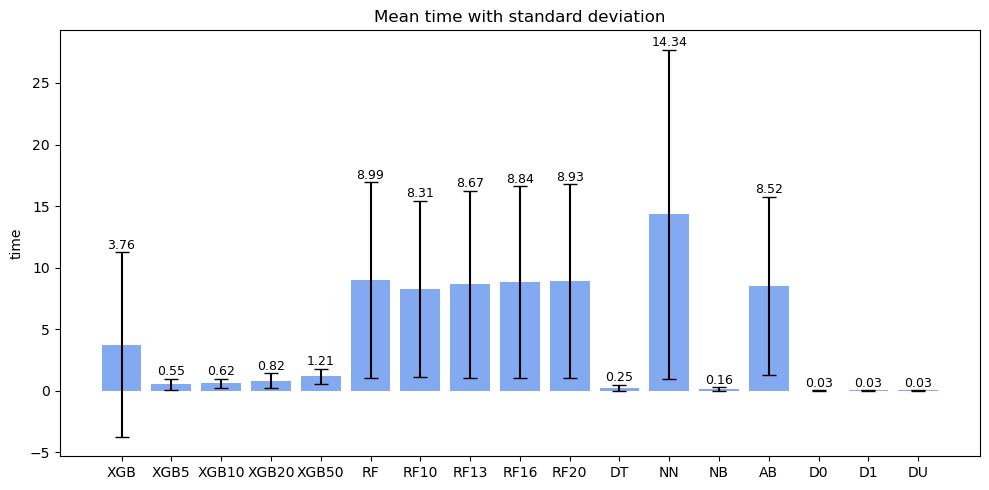

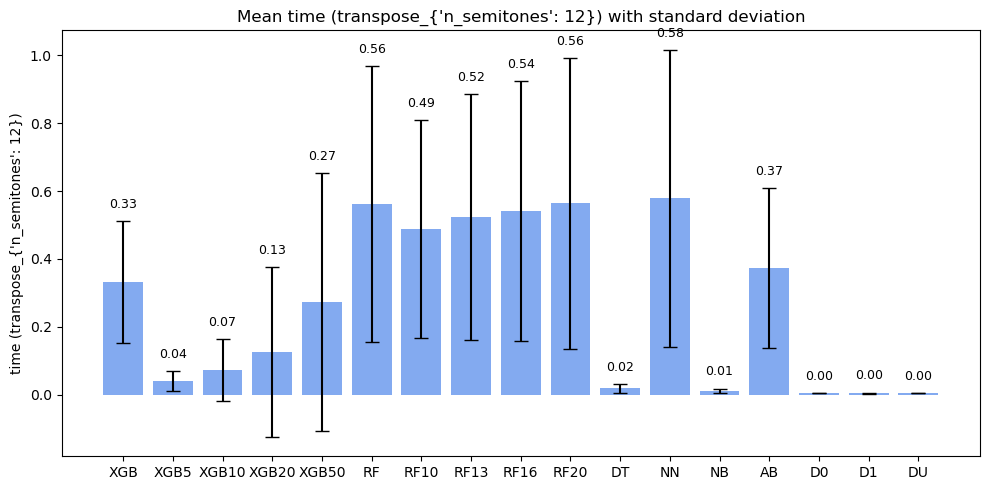

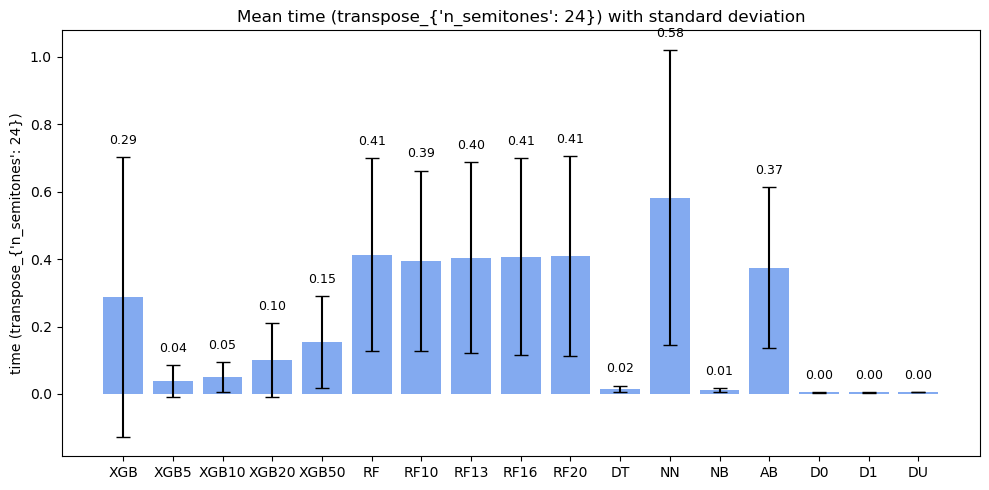

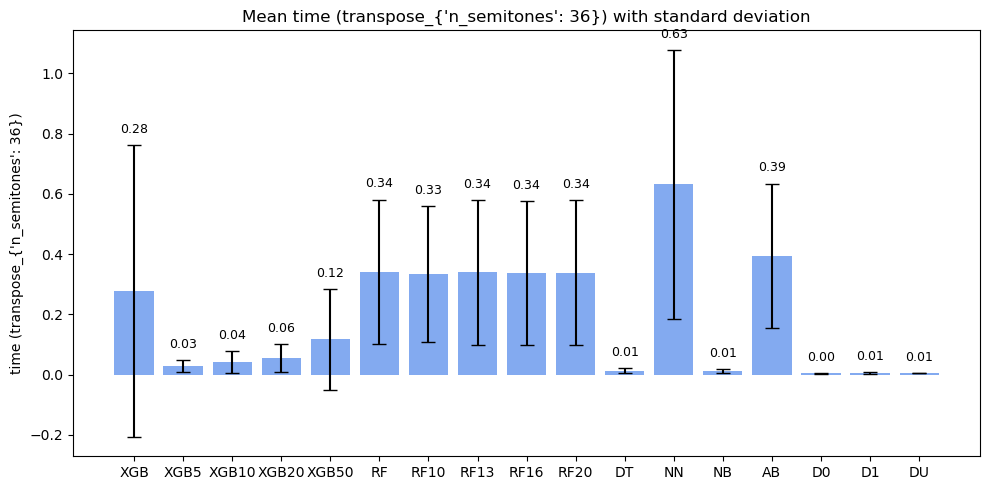

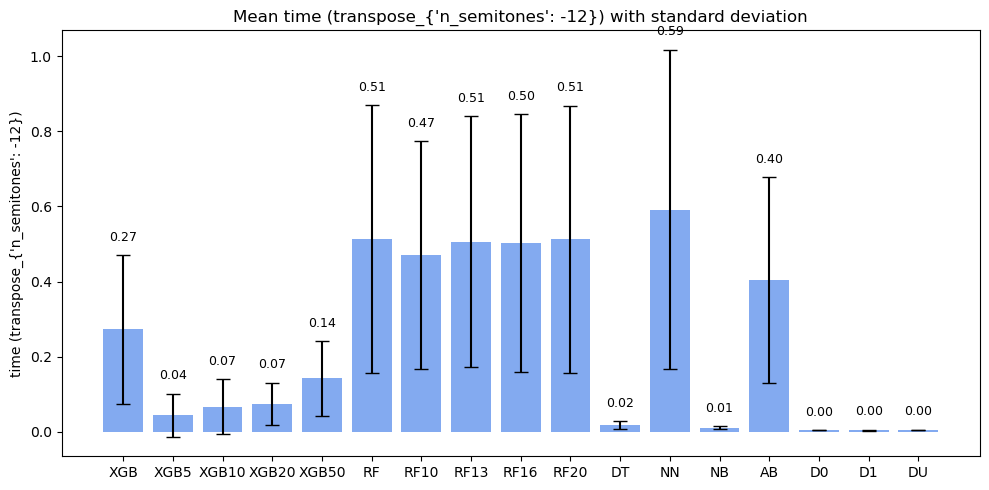

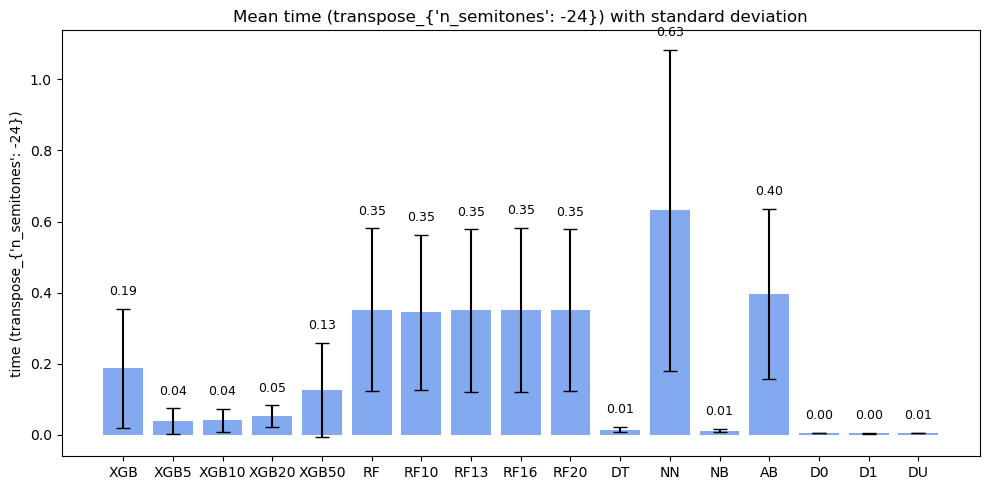

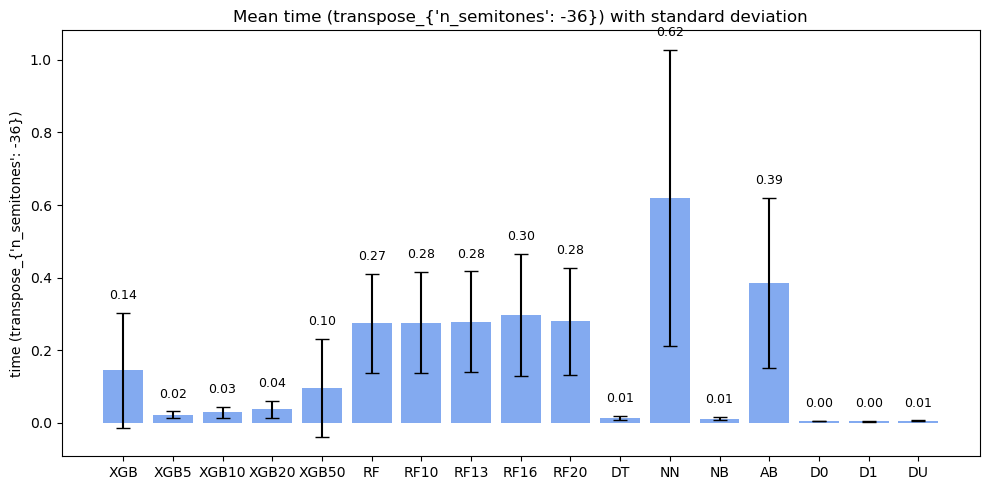

In [17]:
for mn in ml_metrics_names:
    if "time" in mn:
        # Plot
        plt.figure(figsize=(10, 5))
        barlist = plt.bar(model_names_short, metrics_mean[mn], yerr=metrics_std[mn], capsize=5, color='cornflowerblue', alpha=0.8)

        plt.ylabel(mn)
        plt.title(f'Mean {mn} with standard deviation')
        if not "time" in mn:
            plt.ylim(0, 1.1)

        # Optional: Add mean values above bars
        for i, (mean, std) in enumerate(zip(metrics_mean[mn], metrics_std[mn])):
            plt.text(i, mean + std + 0.03, f"{mean:.2f}", ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

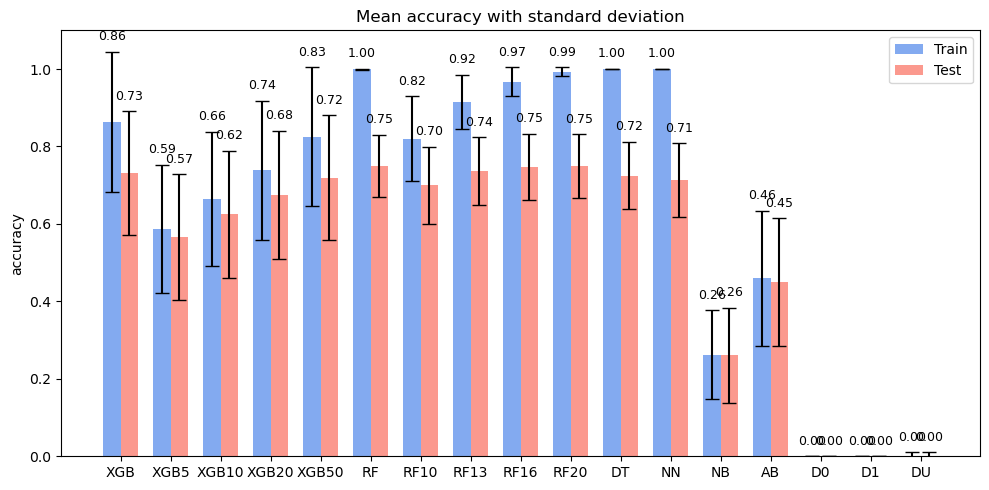

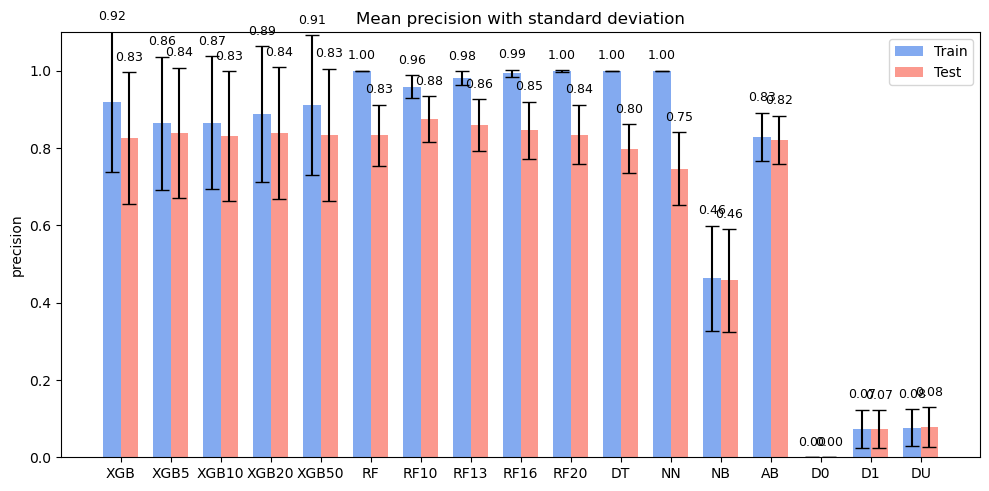

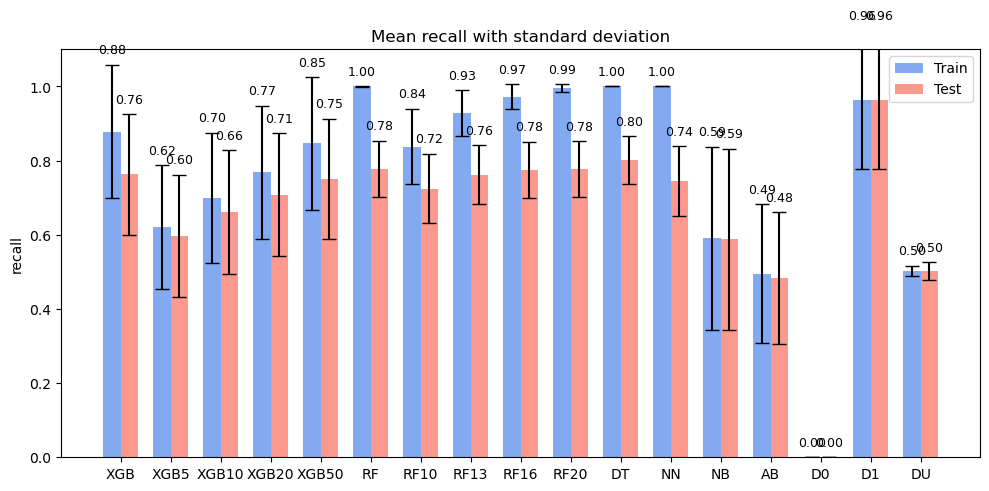

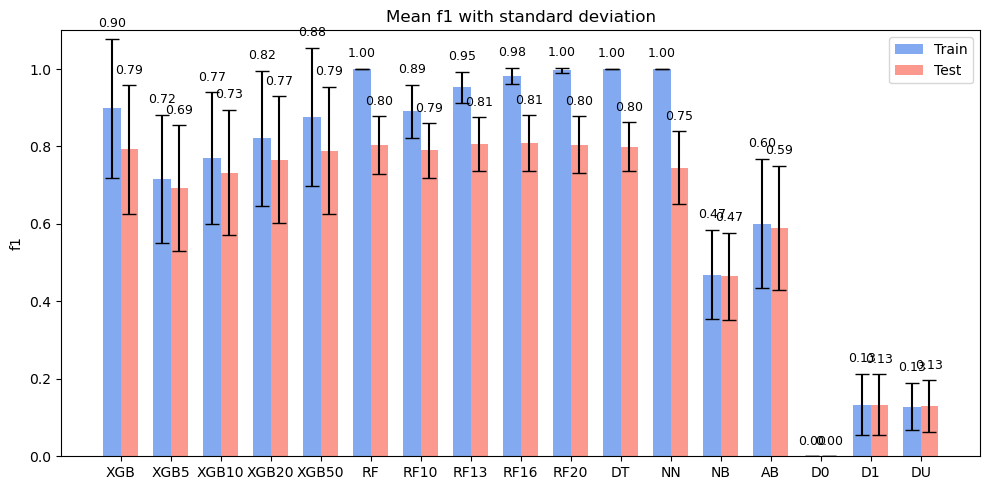

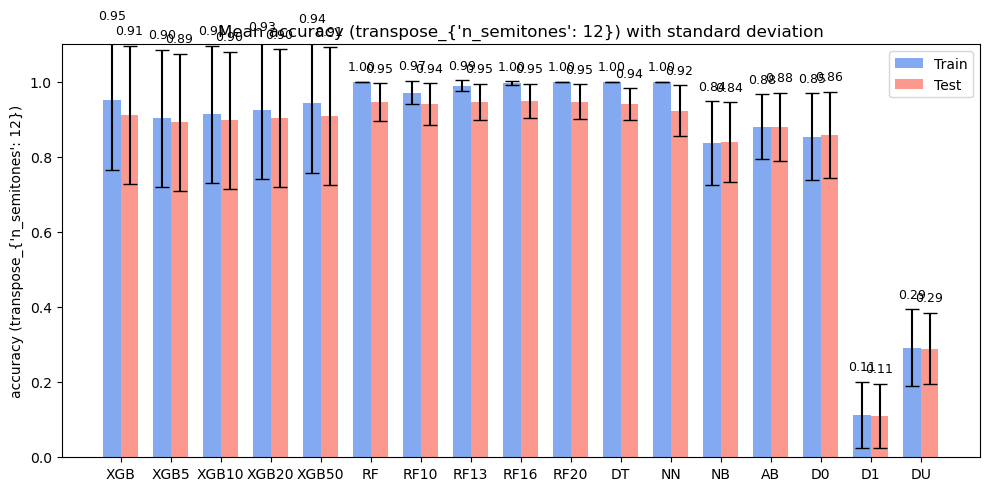

...

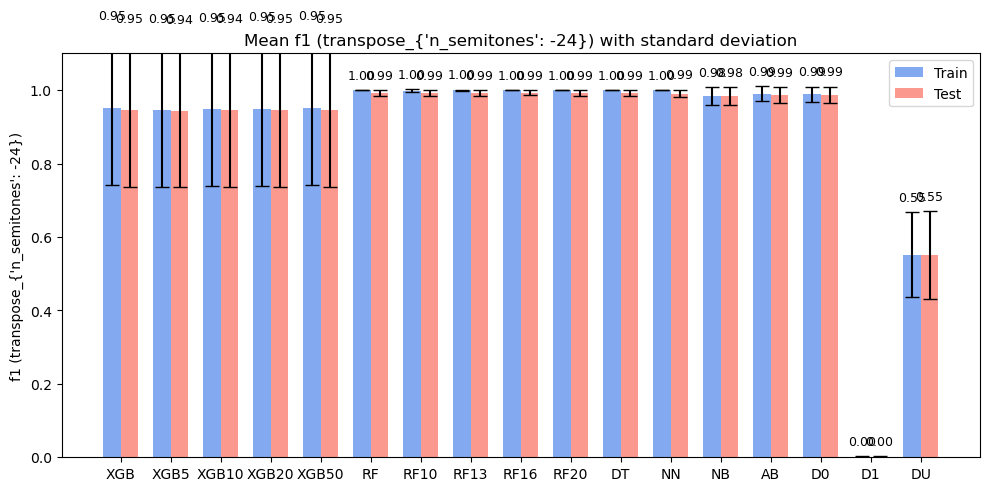

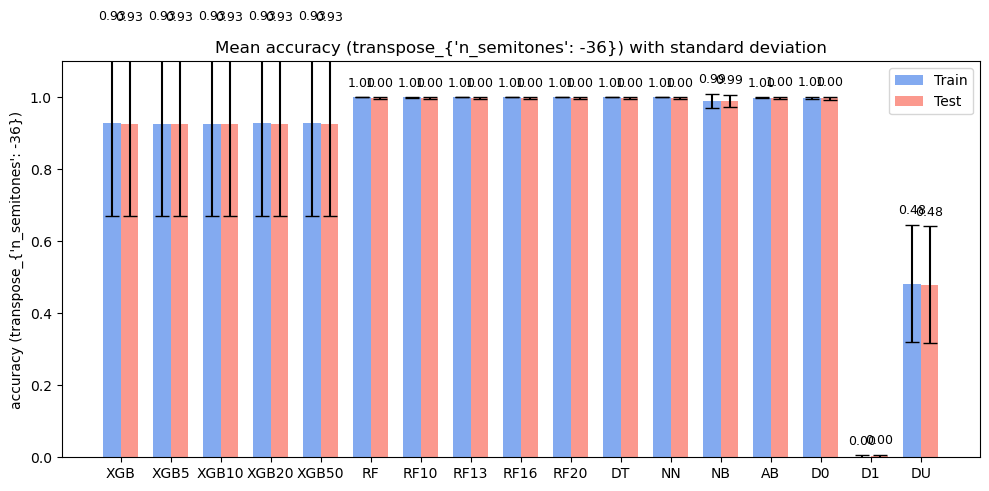

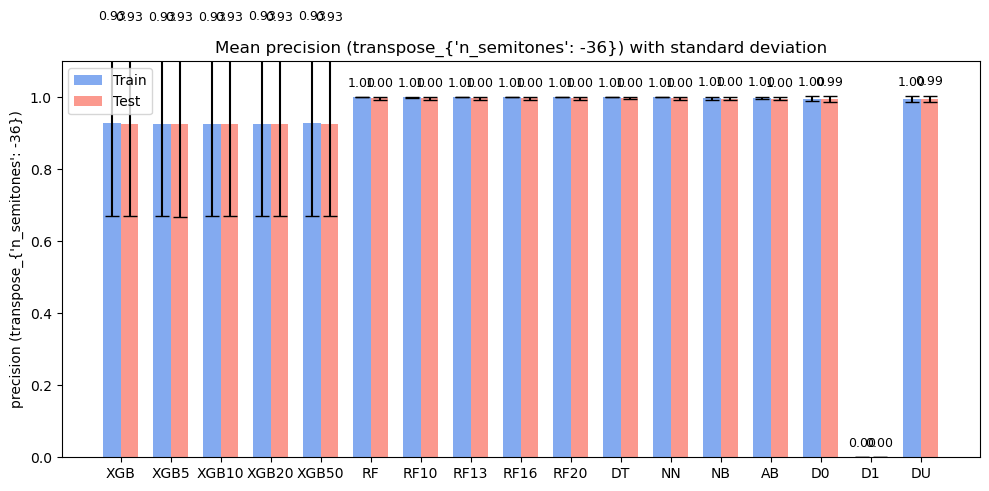

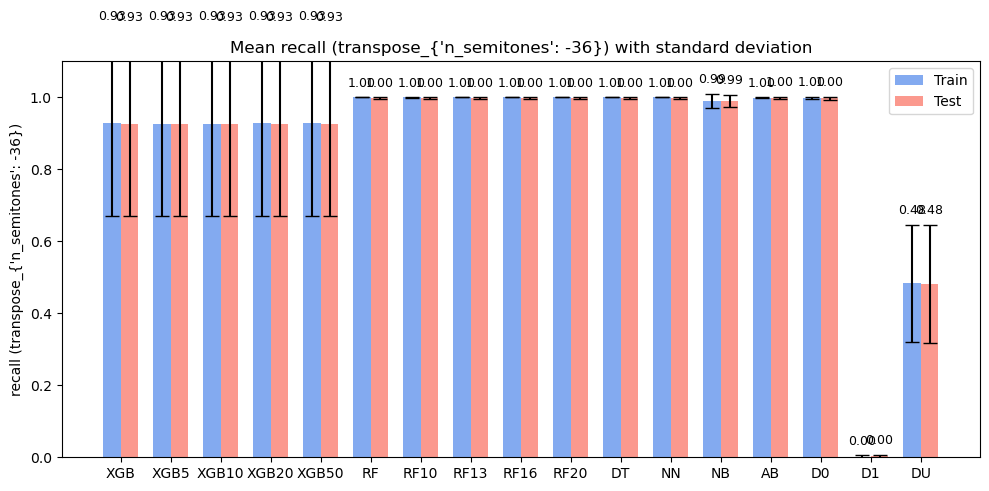

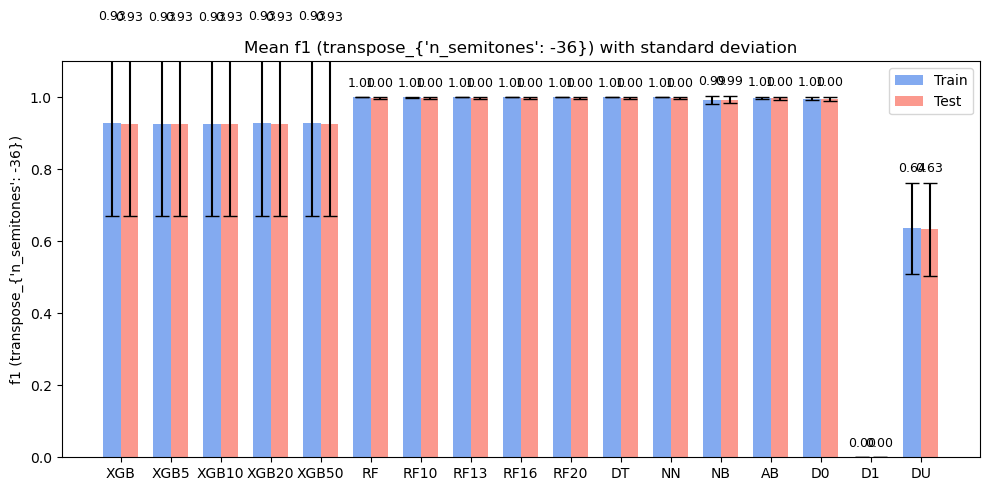

In [18]:
for mn in ml_metrics_names:
    if "train" in mn:
        mn_train = mn
        mn_test = mn.replace("train", "test")

        # Data for the two series
        train_means = metrics_mean[mn_train]
        test_means  = metrics_mean[mn_test]
        train_stds  = metrics_std[mn_train]
        test_stds   = metrics_std[mn_test]

        x = np.arange(len(model_names_short))   # positions
        width = 0.35

        plt.figure(figsize=(10, 5))

        # Two bar groups
        plt.bar(x - width/2, train_means, width,
                yerr=train_stds, capsize=5,
                label='Train', color='cornflowerblue', alpha=0.8)

        plt.bar(x + width/2, test_means, width,
                yerr=test_stds, capsize=5,
                label='Test', color='salmon', alpha=0.8)

        # Labels & layout
        plt.xticks(x, model_names_short)
        title = mn.replace(" (train)", "")
        plt.ylabel(title)
        plt.title(f'Mean {title} with standard deviation')

        if "time" not in mn:
            plt.ylim(0, 1.1)

        # Add mean value labels above bars
        for i, (mean, std) in enumerate(zip(train_means, train_stds)):
            plt.text(x[i] - width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        for i, (mean, std) in enumerate(zip(test_means, test_stds)):
            plt.text(x[i] + width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)
            
        plt.legend()
        plt.tight_layout()
        plt.show()

In [19]:
# Renitialize metrics collectors
s = (len(filenames),len(model_names))
ml_metrics = dict()
base_metrics_names = ["time",
                      "accuracy (train)",
                      "accuracy (test)",
                      "precision (train)",
                      "precision (test)",
                      "recall (train)",
                      "recall (test)",
                      "f1 (train)",
                      "f1 (test)",
                      ] #, "n_events", "n_classes"]
ml_metrics_names = base_metrics_names.copy()

for mn in ml_metrics_names:
    ml_metrics[mn] = np.zeros(s)

In [20]:
# Single-class, without transformations
error_collection = []
for i, filein in enumerate(filenames):    
    for u, (model_name, clf) in enumerate(zip(model_names, classifiers)):
        try: 
            metrics = amo_with_doublings_multiclass(filein,fileout=None,model=model_name, tol=0.2, transformations=None, multiclass=False, model_path=model_path)
            print(metrics)
            for mn in ml_metrics_names:
                # ml_metrics["accuracy"][i,u] = metrics["accuracy"]
                ml_metrics[mn][i,u] = metrics[mn]
        except Exception as e:
            print("Error")
            error_collection.append(f"Error with {filein} and model {model_name}: {e}")

print("\n????????? ERRORS ??????????")
for error in error_collection:
    print(error)


========= PREPROCESSING =========
[PREPROCESSING] Computing and caching results...
Mapping: [[1 'Piccolo' 1 73]
 [2 '2 Flauti' 1 73]
 [3 '2 Oboi' 2 68]
 [4 '2 Clarinetti in B' 3 71]
 [5 '2 Fagotti' 4 70]
 [6 'Corni in F I II' 5 60]
 [7 'Corni in F III IV' 5 60]
 [8 '2 Pistoni in B' 6 56]
 [9 '2 Trombe in F' 6 56]
 [10 '2 Tromboni' 7 57]
 [11 'Trombone 3' 7 57]
 [12 'Tuba' 8 58]
 [13 'Timpani' 10 47]
 [14 'Arpa' 0 46]
 [15 'Violine I' 11 45]
 [15 'Violine I' 11 48]
 [16 'Violine II' 12 48]
 [17 'Viola' 13 45]
 [17 'Viola' 13 48]
 [18 'Violoncelle' 14 48]
 [18 'Violoncelle' 14 45]
 [19 'Contrabasse' 15 45]
 [19 'Contrabasse' 15 48]]

Define covariates and target variable. Target variable encoding
Labels ['10_7' '11_7' '12_8' '13_10' '14_0' '15_11' '16_12' '17_13' '18_14'
 '19_15' '1_1' '2_1' '3_2' '4_3' '5_4' '6_5' '7_5' '8_6' '9_6']
Number of events in filein:  4320
Last onset at 226.08333333333334
y_train, test size: 0.2 , labels: ['10_7' '11_7' '12_8' '13_10' '14_0' '15_11' '16_12' '

In [21]:
metrics_mean = dict()
metrics_std = dict()
for mn in ml_metrics_names:
    metrics_mean[mn], metrics_std[mn] = return_m_std(ml_metrics[mn], mn)

time
[1.52029402 0.09724921 0.16589    0.31747812 0.76245549 1.25411474
 0.80214404 0.95518107 1.0923798  1.21195668 0.03382657 0.81011118
 0.02936743 0.55362829 0.00526323 0.00491733 0.0055102 ]
[9.63120401e-01 5.41077360e-02 9.54636680e-02 1.73285808e-01
 4.39790050e-01 1.05921170e+00 5.75209580e-01 7.18524857e-01
 8.72274783e-01 1.01852046e+00 2.52632911e-02 6.24757501e-01
 2.05366362e-02 4.02791397e-01 8.61176114e-04 9.77582638e-04
 1.15278797e-03]
accuracy (train)
[0.90380051 0.76884983 0.79636603 0.83289211 0.88178176 0.9606186
 0.82291802 0.89533457 0.93714257 0.95676812 0.96062712 0.96054341
 0.51628382 0.33495949 0.05507783 0.05428826 0.06428935]
[0.08609019 0.10997624 0.10917964 0.1083087  0.09596945 0.07470387
 0.10671548 0.08620253 0.07721442 0.07431742 0.07470549 0.07473844
 0.14377086 0.13636626 0.05952524 0.06033098 0.03981524]
accuracy (test)
[0.75086721 0.71903678 0.73365261 0.74852798 0.75651033 0.73097244
 0.72967248 0.74146713 0.73606718 0.73359845 0.72775872 0.6662

In [22]:
output_dir = model_path + "results"
os.makedirs(output_dir, exist_ok=True)

# Combine into a DataFrame
rows = []
for metric in metrics_mean:
    means = metrics_mean[metric]
    stds = metrics_std[metric]
    
    for i, (m, s) in enumerate(zip(means, stds)):
        rows.append({
            "metric": metric,
            "index": i,
            "mean": m,
            "std": s
        })

df = pd.DataFrame(rows)

df.to_csv(os.path.join(output_dir, f"metrics (single label).csv"), index=False)

df = pd.DataFrame({
    "model_name": model_names,
    "model_name_short": model_names_short
})

df.to_csv(os.path.join(output_dir, "model_names (single label).csv"), index=False)

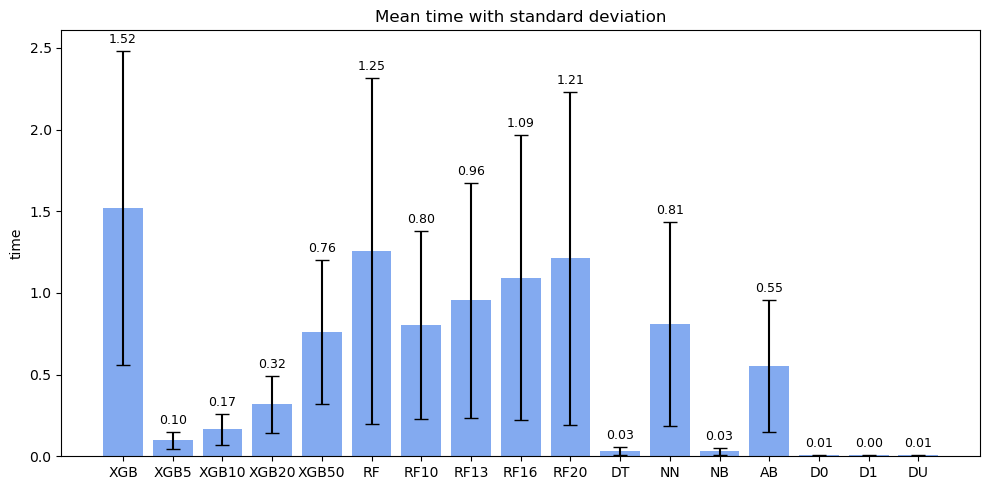

In [23]:
for mn in ml_metrics_names:
    if "time" in mn:
        # Plot
        plt.figure(figsize=(10, 5))
        barlist = plt.bar(model_names_short, metrics_mean[mn], yerr=metrics_std[mn], capsize=5, color='cornflowerblue', alpha=0.8)

        plt.ylabel(mn)
        plt.title(f'Mean {mn} with standard deviation')
        if not "time" in mn:
            plt.ylim(0, 1.1)

        # Optional: Add mean values above bars
        for i, (mean, std) in enumerate(zip(metrics_mean[mn], metrics_std[mn])):
            plt.text(i, mean + std + 0.03, f"{mean:.2f}", ha='center', va='bottom', fontsize=9)

        plt.tight_layout()
        plt.show()

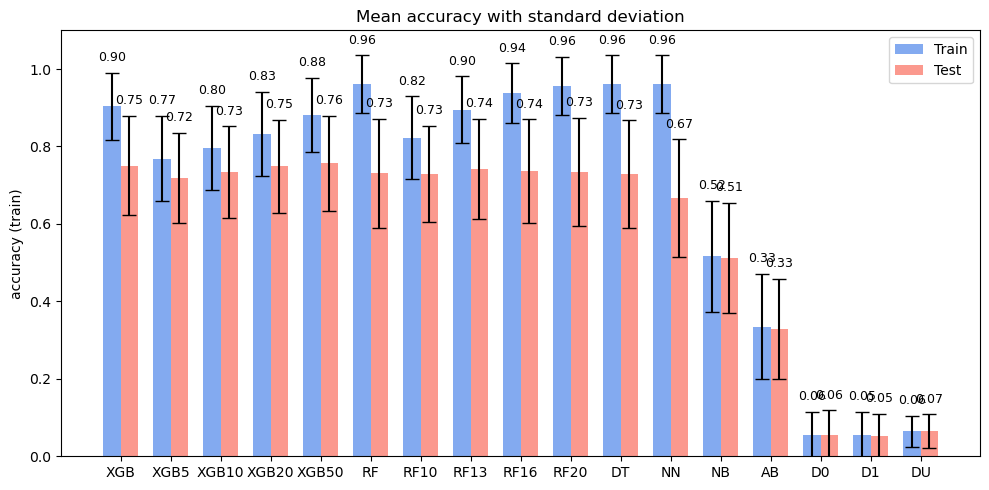

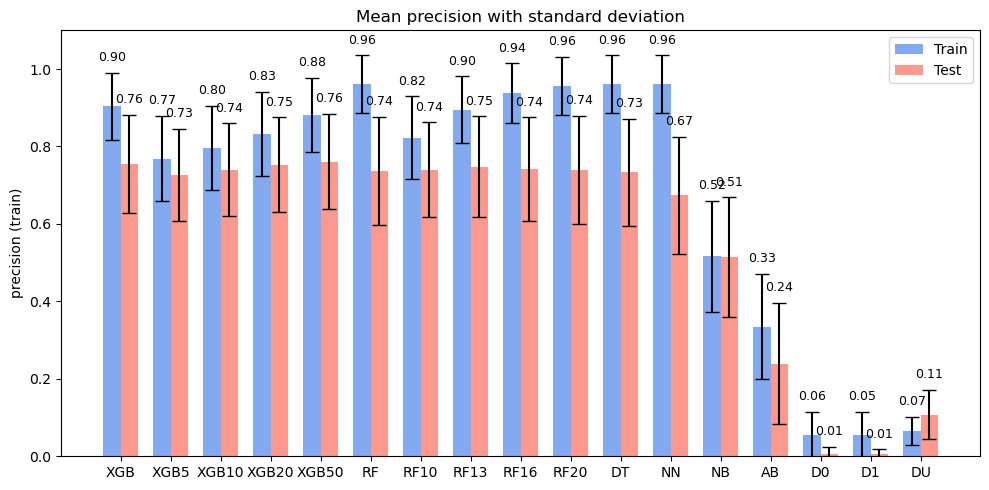

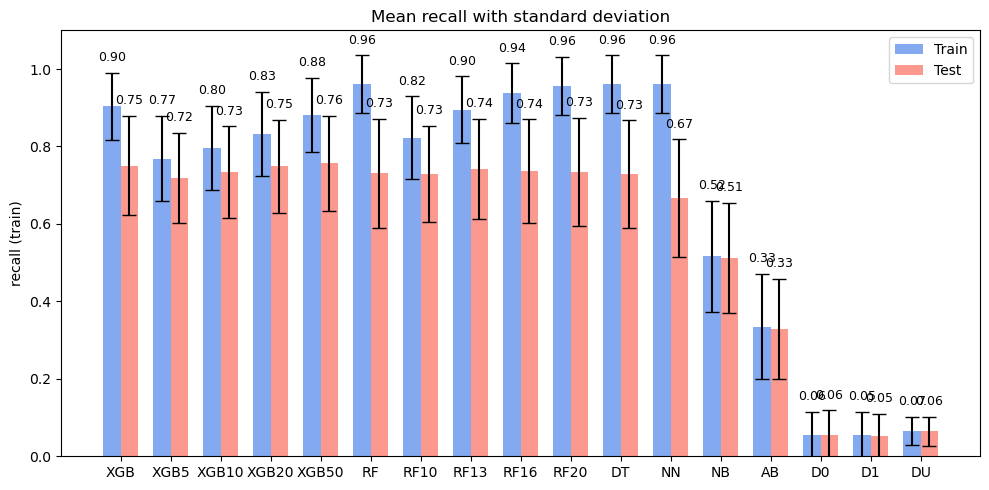

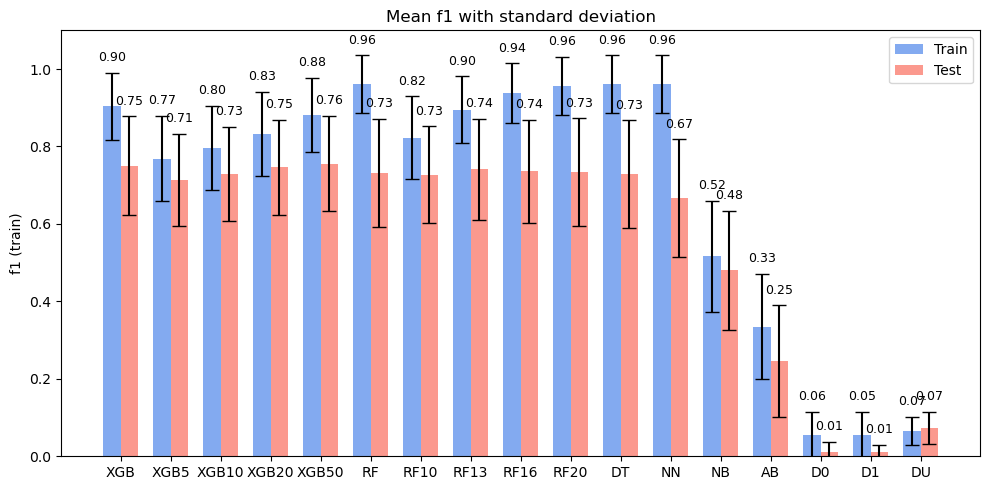

In [24]:
for mn in ml_metrics_names:
    if "train" in mn:
        mn_train = mn
        mn_test = mn.replace("train", "test")

        # Data for the two series
        train_means = metrics_mean[mn_train]
        test_means  = metrics_mean[mn_test]
        train_stds  = metrics_std[mn_train]
        test_stds   = metrics_std[mn_test]

        x = np.arange(len(model_names_short))   # positions
        width = 0.35

        plt.figure(figsize=(10, 5))

        # Two bar groups
        plt.bar(x - width/2, train_means, width,
                yerr=train_stds, capsize=5,
                label='Train', color='cornflowerblue', alpha=0.8)

        plt.bar(x + width/2, test_means, width,
                yerr=test_stds, capsize=5,
                label='Test', color='salmon', alpha=0.8)

        # Labels & layout
        plt.xticks(x, model_names_short)
        plt.ylabel(mn)
        plt.title(f'Mean {mn.replace(" (train)", "")} with standard deviation')

        if "time" not in mn:
            plt.ylim(0, 1.1)

        # Add mean value labels above bars
        for i, (mean, std) in enumerate(zip(train_means, train_stds)):
            plt.text(x[i] - width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        for i, (mean, std) in enumerate(zip(test_means, test_stds)):
            plt.text(x[i] + width/2, mean + std + 0.03, f"{mean:.2f}",
                    ha='center', fontsize=9)

        plt.legend()
        plt.tight_layout()
        plt.show()